In [75]:
!pip install ta-lib

You are using pip version 9.0.3, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [23]:
import quantiacsToolbox
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import svm
import talib
import sys
from sklearn.metrics import mean_squared_error, r2_score
%matplotlib inline

In [90]:
F_BP = pd.read_csv('./tickerData/F_CL.txt')
CLOSE = np.array(F_BP.loc[:252-1, [' CLOSE']])
VOL = np.array(F_BP.loc[:252-1, [' VOL']])
#plt.plot(CLOSE)
print(CLOSE[0:6])
print('VOL',VOL[0:6])

[[22890.]
 [23680.]
 [23410.]
 [23080.]
 [21620.]
 [22070.]]
('VOL', array([[100943],
       [121957],
       [130841],
       [112860],
       [117388],
       [ 98166]]))


In [87]:
CLOSE=CLOSE[0:6]
X_train = np.concatenate([CLOSE[i:i+1] for i in range(3)],axis=1).T
print('X_train.shape',X_train.shape)
print('CLOSE[5:]',CLOSE[3:])
print('CLOSE[5-1: -1]',CLOSE[3-1: -1])
y_train = np.sign((CLOSE[3:] - CLOSE[3-1: -1])).T[0]
print('y_train.shape',y_train.shape)
print('y',y_train)

('X_train.shape', (3, 1))
('CLOSE[5:]', array([[23080.],
       [21620.],
       [22070.]]))
('CLOSE[5-1: -1]', array([[23410.],
       [23080.],
       [21620.]]))
('y_train.shape', (3,))
('y', array([-1., -1.,  1.]))


In [88]:
clf = svm.SVC()
clf.fit(X_train, y_train)
X_test = CLOSE[-3:]
print(X_test)
y_pred = clf.predict(X_test)
print(y_pred)

[[23080.]
 [21620.]
 [22070.]]
[-1. -1. -1.]


In [5]:
F_BP.loc[251:252, ['DATE', ' CLOSE']]

,DATE,CLOSE
251,19901228,119100.0
252,19901231,119337.5


In [6]:
class myStrategy(object):

    def myTradingSystem(self, DATE, OPEN, HIGH, LOW, CLOSE, VOL, OI, P, R, RINFO, exposure, equity, settings):
        """
        For 4 lookback days and 3 markets, CLOSE is a numpy array looks like
        [[ 12798.   11537.5   9010. ]
         [ 12822.   11487.5   9020. ]
         [ 12774.   11462.5   8940. ]
         [ 12966.   11587.5   9220. ]]
        """

        # define helper function
        # use close price predict the trend of the next day
        def predict(CLOSE, gap):
            lookback = CLOSE.shape[0]
            X = np.concatenate([CLOSE[i:i + gap] for i in range(lookback - gap)], axis=1).T 
            print(X)
            y = np.sign((CLOSE[gap:lookback] - CLOSE[gap - 1:lookback - 1]).T[0])
            y[y==0] = 1    
            print(y)
            #print(X.shape)
            clf = svm.SVC()
            clf.fit(X, y)            
       
            y_pred = clf.predict(CLOSE[-gap:].T) 
            #print(y_pred) 
            print(y_pred)
            return y_pred

        nMarkets = len(settings['markets'])
        gap = settings['gap']

        pos = np.zeros((1, nMarkets), dtype='float')
        for i in range(nMarkets):
            try:
                pos[0, i] = predict(CLOSE[:, i].reshape(-1, 1),
                                    gap, )
             

            # for NaN data set position to 0
            except ValueError:
                pos[0, i] = 0.
     
        return pos, settings


    def mySettings(self):
        """ Define your trading system settings here """

        settings = {}

        # Futures Contracts
        settings['markets'] = ['F_CL']

        settings['lookback'] = 2520
        settings['budget'] = 10 ** 6
        settings['slippage'] = 0.05

        settings['gap'] = 5

        return settings

Loading Data...
Done! 
Evaluating Trading System
[[22890. 23680. 23410. 23080. 21620.]
 [23680. 23410. 23080. 21620. 22070.]
 [23410. 23080. 21620. 22070. 22900.]
 [23080. 21620. 22070. 22900. 22170.]
 [21620. 22070. 22900. 22170. 22130.]
 [22070. 22900. 22170. 22130. 21490.]
 [22900. 22170. 22130. 21490. 21730.]
 [22170. 22130. 21490. 21730. 21260.]
 [22130. 21490. 21730. 21260. 21590.]
 [21490. 21730. 21260. 21590. 22080.]
 [21730. 21260. 21590. 22080. 21770.]
 [21260. 21590. 22080. 21770. 21600.]
 [21590. 22080. 21770. 21600. 21590.]
 [22080. 21770. 21600. 21590. 22240.]
 [21770. 21600. 21590. 22240. 22560.]
 [21600. 21590. 22240. 22560. 22800.]
 [21590. 22240. 22560. 22800. 22460.]
 [22240. 22560. 22800. 22460. 22680.]
 [22560. 22800. 22460. 22680. 22700.]
 [22800. 22460. 22680. 22700. 23020.]
 [22460. 22680. 22700. 23020. 22390.]
 [22680. 22700. 23020. 22390. 22510.]
 [22700. 23020. 22390. 22510. 22320.]
 [23020. 22390. 22510. 22320. 22090.]
 [22390. 22510. 22320. 22090. 21560.]


[[21770. 21600. 21590. 22240. 22560.]
 [21600. 21590. 22240. 22560. 22800.]
 [21590. 22240. 22560. 22800. 22460.]
 [22240. 22560. 22800. 22460. 22680.]
 [22560. 22800. 22460. 22680. 22700.]
 [22800. 22460. 22680. 22700. 23020.]
 [22460. 22680. 22700. 23020. 22390.]
 [22680. 22700. 23020. 22390. 22510.]
 [22700. 23020. 22390. 22510. 22320.]
 [23020. 22390. 22510. 22320. 22090.]
 [22390. 22510. 22320. 22090. 21560.]
 [22510. 22320. 22090. 21560. 21840.]
 [22320. 22090. 21560. 21840. 21820.]
 [22090. 21560. 21840. 21820. 21950.]
 [21560. 21840. 21820. 21950. 22430.]
 [21840. 21820. 21950. 22430. 22250.]
 [21820. 21950. 22430. 22250. 22140.]
 [21950. 22430. 22250. 22140. 21740.]
 [22430. 22250. 22140. 21740. 21750.]
 [22250. 22140. 21740. 21750. 21420.]
 [22140. 21740. 21750. 21420. 21790.]
 [21740. 21750. 21420. 21790. 21580.]
 [21750. 21420. 21790. 21580. 21540.]
 [21420. 21790. 21580. 21540. 21170.]
 [21790. 21580. 21540. 21170. 21350.]
 [21580. 21540. 21170. 21350. 21580.]
 [21540. 211

[[22100. 21950. 21820. 21570. 21560.]
 [21950. 21820. 21570. 21560. 21490.]
 [21820. 21570. 21560. 21490. 21850.]
 [21570. 21560. 21490. 21850. 21550.]
 [21560. 21490. 21850. 21550. 21130.]
 [21490. 21850. 21550. 21130. 20940.]
 [21850. 21550. 21130. 20940. 21130.]
 [21550. 21130. 20940. 21130. 21170.]
 [21130. 20940. 21130. 21170. 21560.]
 [20940. 21130. 21170. 21560. 21630.]
 [21130. 21170. 21560. 21630. 21650.]
 [21170. 21560. 21630. 21650. 21250.]
 [21560. 21630. 21650. 21250. 21200.]
 [21630. 21650. 21250. 21200. 21450.]
 [21650. 21250. 21200. 21450. 21650.]
 [21250. 21200. 21450. 21650. 21470.]
 [21200. 21450. 21650. 21470. 20950.]
 [21450. 21650. 21470. 20950. 20600.]
 [21650. 21470. 20950. 20600. 20320.]
 [21470. 20950. 20600. 20320. 19610.]
 [20950. 20600. 20320. 19610. 18850.]
 [20600. 20320. 19610. 18850. 19220.]
 [20320. 19610. 18850. 19220. 19010.]
 [19610. 18850. 19220. 19010. 19170.]
 [18850. 19220. 19010. 19170. 18890.]
 [19220. 19010. 19170. 18890. 18590.]
 [19010. 191

 -1. -1. -1. -1. -1. -1.  1.  1. -1.]
[-1.]
[[21170. 21560. 21630. 21650. 21250.]
 [21560. 21630. 21650. 21250. 21200.]
 [21630. 21650. 21250. 21200. 21450.]
 [21650. 21250. 21200. 21450. 21650.]
 [21250. 21200. 21450. 21650. 21470.]
 [21200. 21450. 21650. 21470. 20950.]
 [21450. 21650. 21470. 20950. 20600.]
 [21650. 21470. 20950. 20600. 20320.]
 [21470. 20950. 20600. 20320. 19610.]
 [20950. 20600. 20320. 19610. 18850.]
 [20600. 20320. 19610. 18850. 19220.]
 [20320. 19610. 18850. 19220. 19010.]
 [19610. 18850. 19220. 19010. 19170.]
 [18850. 19220. 19010. 19170. 18890.]
 [19220. 19010. 19170. 18890. 18590.]
 [19010. 19170. 18890. 18590. 19370.]
 [19170. 18890. 18590. 19370. 19320.]
 [18890. 18590. 19370. 19320. 19570.]
 [18590. 19370. 19320. 19570. 19500.]
 [19370. 19320. 19570. 19500. 19160.]
 [19320. 19570. 19500. 19160. 18970.]
 [19570. 19500. 19160. 18970. 19040.]
 [19500. 19160. 18970. 19040. 19040.]
 [19160. 18970. 19040. 19040. 19310.]
 [18970. 19040. 19040. 19310. 19180.]
 [1904

[[19970. 19960. 20250. 20260. 20970.]
 [19960. 20250. 20260. 20970. 21000.]
 [20250. 20260. 20970. 21000. 20820.]
 [20260. 20970. 21000. 20820. 21460.]
 [20970. 21000. 20820. 21460. 21400.]
 [21000. 20820. 21460. 21400. 21000.]
 [20820. 21460. 21400. 21000. 21050.]
 [21460. 21400. 21000. 21050. 20900.]
 [21400. 21000. 21050. 20900. 20520.]
 [21000. 21050. 20900. 20520. 20400.]
 [21050. 20900. 20520. 20400. 19620.]
 [20900. 20520. 20400. 19620. 19310.]
 [20520. 20400. 19620. 19310. 19280.]
 [20400. 19620. 19310. 19280. 19460.]
 [19620. 19310. 19280. 19460. 19560.]
 [19310. 19280. 19460. 19560. 18880.]
 [19280. 19460. 19560. 18880. 18980.]
 [19460. 19560. 18880. 18980. 18620.]
 [19560. 18880. 18980. 18620. 18160.]
 [18880. 18980. 18620. 18160. 18400.]
 [18980. 18620. 18160. 18400. 18150.]
 [18620. 18160. 18400. 18150. 18260.]
 [18160. 18400. 18150. 18260. 18180.]
 [18400. 18150. 18260. 18180. 18820.]
 [18150. 18260. 18180. 18820. 18940.]
 [18260. 18180. 18820. 18940. 18590.]
 [18180. 188

[[19620. 19310. 19280. 19460. 19560.]
 [19310. 19280. 19460. 19560. 18880.]
 [19280. 19460. 19560. 18880. 18980.]
 [19460. 19560. 18880. 18980. 18620.]
 [19560. 18880. 18980. 18620. 18160.]
 [18880. 18980. 18620. 18160. 18400.]
 [18980. 18620. 18160. 18400. 18150.]
 [18620. 18160. 18400. 18150. 18260.]
 [18160. 18400. 18150. 18260. 18180.]
 [18400. 18150. 18260. 18180. 18820.]
 [18150. 18260. 18180. 18820. 18940.]
 [18260. 18180. 18820. 18940. 18590.]
 [18180. 18820. 18940. 18590. 18340.]
 [18820. 18940. 18590. 18340. 17700.]
 [18940. 18590. 18340. 17700. 17670.]
 [18590. 18340. 17700. 17670. 17500.]
 [18340. 17700. 17670. 17500. 17690.]
 [17700. 17670. 17500. 17690. 18210.]
 [17670. 17500. 17690. 18210. 18130.]
 [17500. 17690. 18210. 18130. 17890.]
 [17690. 18210. 18130. 17890. 17430.]
 [18210. 18130. 17890. 17430. 17900.]
 [18130. 17890. 17430. 17900. 17820.]
 [17890. 17430. 17900. 17820. 17470.]
 [17430. 17900. 17820. 17470. 17550.]
 [17900. 17820. 17470. 17550. 17250.]
 [17820. 174

[ 1.  1.  1.  1. -1. -1. -1.  1.  1.  1.  1.  1.  1.  1. -1. -1.  1.  1.
  1.  1.  1.  1.  1.  1.  1. -1. -1.  1. -1.  1.  1.  1.  1.  1. -1.  1.
 -1.  1.  1.  1.  1.  1.  1.  1.  1.]
[1.]
[[18350. 18850. 18770. 18610. 18860.]
 [18850. 18770. 18610. 18860. 19060.]
 [18770. 18610. 18860. 19060. 19500.]
 [18610. 18860. 19060. 19500. 19560.]
 [18860. 19060. 19500. 19560. 19380.]
 [19060. 19500. 19560. 19380. 19300.]
 [19500. 19560. 19380. 19300. 19040.]
 [19560. 19380. 19300. 19040. 19210.]
 [19380. 19300. 19040. 19210. 19690.]
 [19300. 19040. 19210. 19690. 20540.]
 [19040. 19210. 19690. 20540. 22110.]
 [19210. 19690. 20540. 22110. 23490.]
 [19690. 20540. 22110. 23490. 27050.]
 [20540. 22110. 23490. 27050. 27310.]
 [22110. 23490. 27050. 27310. 24960.]
 [23490. 27050. 27310. 24960. 24670.]
 [27050. 27310. 24960. 24670. 25350.]
 [27310. 24960. 24670. 25350. 25630.]
 [24960. 24670. 25350. 25630. 25660.]
 [24670. 25350. 25630. 25660. 26580.]
 [25350. 25630. 25660. 26580. 27580.]
 [25630. 2566

[[19140. 20710. 22090. 25650. 25910.]
 [20710. 22090. 25650. 25910. 23560.]
 [22090. 25650. 25910. 23560. 23270.]
 [25650. 25910. 23560. 23270. 23950.]
 [25910. 23560. 23270. 23950. 24230.]
 [23560. 23270. 23950. 24230. 24260.]
 [23270. 23950. 24230. 24260. 25180.]
 [23950. 24230. 24260. 25180. 26180.]
 [24230. 24260. 25180. 26180. 26490.]
 [24260. 25180. 26180. 26490. 26610.]
 [25180. 26180. 26490. 26610. 29120.]
 [26180. 26490. 26610. 29120. 29830.]
 [26490. 26610. 29120. 29830. 28810.]
 [26610. 29120. 29830. 28810. 24810.]
 [29120. 29830. 28810. 24810. 25780.]
 [29830. 28810. 24810. 25780. 23820.]
 [28810. 24810. 25780. 23820. 24670.]
 [24810. 25780. 23820. 24670. 25220.]
 [25780. 23820. 24670. 25220. 27020.]
 [23820. 24670. 25220. 27020. 27670.]
 [24670. 25220. 27020. 27670. 29330.]
 [25220. 27020. 27670. 29330. 27940.]
 [27020. 27670. 29330. 27940. 29200.]
 [27670. 29330. 27940. 29200. 28470.]
 [29330. 27940. 29200. 28470. 28810.]
 [27940. 29200. 28470. 28810. 29190.]
 [29200. 284

[-1.]
[[30620. 31070. 33080. 35900. 35180.]
 [31070. 33080. 35900. 35180. 36320.]
 [33080. 35900. 35180. 36320. 37190.]
 [35900. 35180. 36320. 37190. 37160.]
 [35180. 36320. 37190. 37160. 34740.]
 [36320. 37190. 37160. 34740. 31600.]
 [37190. 37160. 34740. 31600. 34970.]
 [37160. 34740. 31600. 34970. 34580.]
 [34740. 31600. 34970. 34580. 35640.]
 [31600. 34970. 34580. 35640. 36600.]
 [34970. 34580. 35640. 36600. 38050.]
 [34580. 35640. 36600. 38050. 36340.]
 [35640. 36600. 38050. 36340. 37850.]
 [36600. 38050. 36340. 37850. 37150.]
 [38050. 36340. 37850. 37150. 35590.]
 [36340. 37850. 37150. 35590. 36500.]
 [37850. 37150. 35590. 36500. 35000.]
 [37150. 35590. 36500. 35000. 34460.]
 [35590. 36500. 35000. 34460. 32460.]
 [36500. 35000. 34460. 32460. 29460.]
 [35000. 34460. 32460. 29460. 28420.]
 [34460. 32460. 29460. 28420. 30130.]
 [32460. 29460. 28420. 30130. 33300.]
 [29460. 28420. 30130. 33300. 32060.]
 [28420. 30130. 33300. 32060. 33730.]
 [30130. 33300. 32060. 33730. 33590.]
 [3330

[[37600. 35890. 37400. 36700. 35140.]
 [35890. 37400. 36700. 35140. 36050.]
 [37400. 36700. 35140. 36050. 34550.]
 [36700. 35140. 36050. 34550. 34010.]
 [35140. 36050. 34550. 34010. 32010.]
 [36050. 34550. 34010. 32010. 29010.]
 [34550. 34010. 32010. 29010. 27970.]
 [34010. 32010. 29010. 27970. 29680.]
 [32010. 29010. 27970. 29680. 32850.]
 [29010. 27970. 29680. 32850. 31610.]
 [27970. 29680. 32850. 31610. 33280.]
 [29680. 32850. 31610. 33280. 33140.]
 [32850. 31610. 33280. 33140. 33830.]
 [31610. 33280. 33140. 33830. 33770.]
 [33280. 33140. 33830. 33770. 32600.]
 [33140. 33830. 33770. 32600. 30560.]
 [33830. 33770. 32600. 30560. 31230.]
 [33770. 32600. 30560. 31230. 33910.]
 [32600. 30560. 31230. 33910. 34130.]
 [30560. 31230. 33910. 34130. 32460.]
 [31230. 33910. 34130. 32460. 30960.]
 [33910. 34130. 32460. 30960. 31720.]
 [34130. 32460. 30960. 31720. 30290.]
 [32460. 30960. 31720. 30290. 30190.]
 [30960. 31720. 30290. 30190. 29140.]
 [31720. 30290. 30190. 29140. 30270.]
 [30290. 301

[[31830. 31460. 27400. 27700. 29210.]
 [31460. 27400. 27700. 29210. 25840.]
 [27400. 27700. 29210. 25840. 24950.]
 [27700. 29210. 25840. 24950. 25130.]
 [29210. 25840. 24950. 25130. 25450.]
 [25840. 24950. 25130. 25450. 24880.]
 [24950. 25130. 25450. 24880. 23660.]
 [25130. 25450. 24880. 23660. 24600.]
 [25450. 24880. 23660. 24600. 24670.]
 [24880. 23660. 24600. 24670. 25210.]
 [23660. 24600. 24670. 25210. 25920.]
 [24600. 24670. 25210. 25920. 25930.]
 [24670. 25210. 25920. 25930. 25390.]
 [25210. 25920. 25930. 25390. 24920.]
 [25920. 25930. 25390. 24920. 26220.]
 [25930. 25390. 24920. 26220. 26010.]
 [25390. 24920. 26220. 26010. 26570.]
 [24920. 26220. 26010. 26570. 27440.]
 [26220. 26010. 26570. 27440. 25490.]
 [26010. 26570. 27440. 25490. 24480.]
 [26570. 27440. 25490. 24480. 23900.]
 [27440. 25490. 24480. 23900. 26650.]
 [25490. 24480. 23900. 26650. 26170.]
 [24480. 23900. 26650. 26170. 26260.]
 [23900. 26650. 26170. 26260. 26710.]
 [26650. 26170. 26260. 26710. 26240.]
 [26170. 262

[[23760. 24470. 24480. 23940. 23470.]
 [24470. 24480. 23940. 23470. 24770.]
 [24480. 23940. 23470. 24770. 24560.]
 [23940. 23470. 24770. 24560. 25120.]
 [23470. 24770. 24560. 25120. 25990.]
 [24770. 24560. 25120. 25990. 24040.]
 [24560. 25120. 25990. 24040. 23030.]
 [25120. 25990. 24040. 23030. 22450.]
 [25990. 24040. 23030. 22450. 25200.]
 [24040. 23030. 22450. 25200. 24720.]
 [23030. 22450. 25200. 24720. 24810.]
 [22450. 25200. 24720. 24810. 25260.]
 [25200. 24720. 24810. 25260. 24790.]
 [24720. 24810. 25260. 24790. 28240.]
 [24810. 25260. 24790. 28240. 27600.]
 [25260. 24790. 28240. 27600. 28840.]
 [24790. 28240. 27600. 28840. 19180.]
 [28240. 27600. 28840. 19180. 17540.]
 [27600. 28840. 19180. 17540. 18870.]
 [28840. 19180. 17540. 18870. 20430.]
 [19180. 17540. 18870. 20430. 20590.]
 [17540. 18870. 20430. 20590. 20260.]
 [18870. 20430. 20590. 20260. 19900.]
 [20430. 20590. 20260. 19900. 19510.]
 [20590. 20260. 19900. 19510. 20400.]
 [20260. 19900. 19510. 20400. 19520.]
 [19900. 195

[1.]
[[18940. 18460. 19290. 19020. 19720.]
 [18460. 19290. 19020. 19720. 20210.]
 [19290. 19020. 19720. 20210. 20390.]
 [19020. 19720. 20210. 20390. 20020.]
 [19720. 20210. 20390. 20020. 19740.]
 [20210. 20390. 20020. 19740. 18190.]
 [20390. 20020. 19740. 18190. 18040.]
 [20020. 19740. 18190. 18040. 18800.]
 [19740. 18190. 18040. 18800. 17750.]
 [18190. 18040. 18800. 17750. 17160.]
 [18040. 18800. 17750. 17160. 17190.]
 [18800. 17750. 17160. 17190. 17620.]
 [17750. 17160. 17190. 17620. 18110.]
 [17160. 17190. 17620. 18110. 18410.]
 [17190. 17620. 18110. 18410. 18630.]
 [17620. 18110. 18410. 18630. 19500.]
 [18110. 18410. 18630. 19500. 19680.]
 [18410. 18630. 19500. 19680. 18980.]
 [18630. 19500. 19680. 18980. 18670.]
 [19500. 19680. 18980. 18670. 18560.]
 [19680. 18980. 18670. 18560. 18130.]
 [18980. 18670. 18560. 18130. 18860.]
 [18670. 18560. 18130. 18860. 19570.]
 [18560. 18130. 18860. 19570. 19340.]
 [18130. 18860. 19570. 19340. 18970.]
 [18860. 19570. 19340. 18970. 18550.]
 [19570

[1.]
[[17750. 17160. 17190. 17620. 18110.]
 [17160. 17190. 17620. 18110. 18410.]
 [17190. 17620. 18110. 18410. 18630.]
 [17620. 18110. 18410. 18630. 19500.]
 [18110. 18410. 18630. 19500. 19680.]
 [18410. 18630. 19500. 19680. 18980.]
 [18630. 19500. 19680. 18980. 18670.]
 [19500. 19680. 18980. 18670. 18560.]
 [19680. 18980. 18670. 18560. 18130.]
 [18980. 18670. 18560. 18130. 18860.]
 [18670. 18560. 18130. 18860. 19570.]
 [18560. 18130. 18860. 19570. 19340.]
 [18130. 18860. 19570. 19340. 18970.]
 [18860. 19570. 19340. 18970. 18550.]
 [19570. 19340. 18970. 18550. 19430.]
 [19340. 18970. 18550. 19430. 19600.]
 [18970. 18550. 19430. 19600. 20040.]
 [18550. 19430. 19600. 20040. 19650.]
 [19430. 19600. 20040. 19650. 19170.]
 [19600. 20040. 19650. 19170. 19310.]
 [20040. 19650. 19170. 19310. 18960.]
 [19650. 19170. 19310. 18960. 19180.]
 [19170. 19310. 18960. 19180. 18840.]
 [19310. 18960. 19180. 18840. 19250.]
 [18960. 19180. 18840. 19250. 19020.]
 [19180. 18840. 19250. 19020. 19530.]
 [18840

 -1. -1.  1.  1. -1. -1.  1.  1. -1.]
[1.]
[[20560. 21050. 21510. 21320. 21380.]
 [21050. 21510. 21320. 21380. 20820.]
 [21510. 21320. 21380. 20820. 21010.]
 [21320. 21380. 20820. 21010. 21400.]
 [21380. 20820. 21010. 21400. 20960.]
 [20820. 21010. 21400. 20960. 21020.]
 [21010. 21400. 20960. 21020. 21230.]
 [21400. 20960. 21020. 21230. 21360.]
 [20960. 21020. 21230. 21360. 21340.]
 [21020. 21230. 21360. 21340. 21040.]
 [21230. 21360. 21340. 21040. 21330.]
 [21360. 21340. 21040. 21330. 21250.]
 [21340. 21040. 21330. 21250. 21450.]
 [21040. 21330. 21250. 21450. 21760.]
 [21330. 21250. 21450. 21760. 21710.]
 [21250. 21450. 21760. 21710. 21860.]
 [21450. 21760. 21710. 21860. 22010.]
 [21760. 21710. 21860. 22010. 21340.]
 [21710. 21860. 22010. 21340. 21090.]
 [21860. 22010. 21340. 21090. 21000.]
 [22010. 21340. 21090. 21000. 21130.]
 [21340. 21090. 21000. 21130. 21120.]
 [21090. 21000. 21130. 21120. 21340.]
 [21000. 21130. 21120. 21340. 21420.]
 [21130. 21120. 21340. 21420. 21190.]
 [21120

[1.]
[[21040. 21330. 21250. 21450. 21760.]
 [21330. 21250. 21450. 21760. 21710.]
 [21250. 21450. 21760. 21710. 21860.]
 [21450. 21760. 21710. 21860. 22010.]
 [21760. 21710. 21860. 22010. 21340.]
 [21710. 21860. 22010. 21340. 21090.]
 [21860. 22010. 21340. 21090. 21000.]
 [22010. 21340. 21090. 21000. 21130.]
 [21340. 21090. 21000. 21130. 21120.]
 [21090. 21000. 21130. 21120. 21340.]
 [21000. 21130. 21120. 21340. 21420.]
 [21130. 21120. 21340. 21420. 21190.]
 [21120. 21340. 21420. 21190. 20960.]
 [21340. 21420. 21190. 20960. 21150.]
 [21420. 21190. 20960. 21150. 21320.]
 [21190. 20960. 21150. 21320. 21460.]
 [20960. 21150. 21320. 21460. 21240.]
 [21150. 21320. 21460. 21240. 21450.]
 [21320. 21460. 21240. 21450. 21260.]
 [21460. 21240. 21450. 21260. 21260.]
 [21240. 21450. 21260. 21260. 21150.]
 [21450. 21260. 21260. 21150. 20600.]
 [21260. 21260. 21150. 20600. 20460.]
 [21260. 21150. 20600. 20460. 20410.]
 [21150. 20600. 20460. 20410. 19970.]
 [20600. 20460. 20410. 19970. 20070.]
 [20460

[[21010. 20900. 20350. 20210. 20160.]
 [20900. 20350. 20210. 20160. 19720.]
 [20350. 20210. 20160. 19720. 19820.]
 [20210. 20160. 19720. 19820. 19930.]
 [20160. 19720. 19820. 19930. 19570.]
 [19720. 19820. 19930. 19570. 19550.]
 [19820. 19930. 19570. 19550. 19730.]
 [19930. 19570. 19550. 19730. 19820.]
 [19570. 19550. 19730. 19820. 19630.]
 [19550. 19730. 19820. 19630. 19920.]
 [19730. 19820. 19630. 19920. 19980.]
 [19820. 19630. 19920. 19980. 19730.]
 [19630. 19920. 19980. 19730. 19800.]
 [19920. 19980. 19730. 19800. 19830.]
 [19980. 19730. 19800. 19830. 20230.]
 [19730. 19800. 19830. 20230. 20310.]
 [19800. 19830. 20230. 20310. 20510.]
 [19830. 20230. 20310. 20510. 20570.]
 [20230. 20310. 20510. 20570. 20420.]
 [20310. 20510. 20570. 20420. 20640.]
 [20510. 20570. 20420. 20640. 20990.]
 [20570. 20420. 20640. 20990. 21040.]
 [20420. 20640. 20990. 21040. 21180.]
 [20640. 20990. 21040. 21180. 21000.]
 [20990. 21040. 21180. 21000. 21410.]
 [21040. 21180. 21000. 21410. 21140.]
 [21180. 210

[[19720. 19820. 19930. 19570. 19550.]
 [19820. 19930. 19570. 19550. 19730.]
 [19930. 19570. 19550. 19730. 19820.]
 [19570. 19550. 19730. 19820. 19630.]
 [19550. 19730. 19820. 19630. 19920.]
 [19730. 19820. 19630. 19920. 19980.]
 [19820. 19630. 19920. 19980. 19730.]
 [19630. 19920. 19980. 19730. 19800.]
 [19920. 19980. 19730. 19800. 19830.]
 [19980. 19730. 19800. 19830. 20230.]
 [19730. 19800. 19830. 20230. 20310.]
 [19800. 19830. 20230. 20310. 20510.]
 [19830. 20230. 20310. 20510. 20570.]
 [20230. 20310. 20510. 20570. 20420.]
 [20310. 20510. 20570. 20420. 20640.]
 [20510. 20570. 20420. 20640. 20990.]
 [20570. 20420. 20640. 20990. 21040.]
 [20420. 20640. 20990. 21040. 21180.]
 [20640. 20990. 21040. 21180. 21000.]
 [20990. 21040. 21180. 21000. 21410.]
 [21040. 21180. 21000. 21410. 21140.]
 [21180. 21000. 21410. 21140. 21340.]
 [21000. 21410. 21140. 21340. 21840.]
 [21410. 21140. 21340. 21840. 21660.]
 [21140. 21340. 21840. 21660. 22000.]
 [21340. 21840. 21660. 22000. 21700.]
 [21840. 216

[[21340. 21070. 21270. 21770. 21590.]
 [21070. 21270. 21770. 21590. 21930.]
 [21270. 21770. 21590. 21930. 21630.]
 [21770. 21590. 21930. 21630. 21080.]
 [21590. 21930. 21630. 21080. 21280.]
 [21930. 21630. 21080. 21280. 21220.]
 [21630. 21080. 21280. 21220. 21240.]
 [21080. 21280. 21220. 21240. 21110.]
 [21280. 21220. 21240. 21110. 21180.]
 [21220. 21240. 21110. 21180. 21440.]
 [21240. 21110. 21180. 21440. 21030.]
 [21110. 21180. 21440. 21030. 21080.]
 [21180. 21440. 21030. 21080. 21230.]
 [21440. 21030. 21080. 21230. 21130.]
 [21030. 21080. 21230. 21130. 21120.]
 [21080. 21230. 21130. 21120. 21340.]
 [21230. 21130. 21120. 21340. 21440.]
 [21130. 21120. 21340. 21440. 21520.]
 [21120. 21340. 21440. 21520. 21460.]
 [21340. 21440. 21520. 21460. 21210.]
 [21440. 21520. 21460. 21210. 21360.]
 [21520. 21460. 21210. 21360. 21210.]
 [21460. 21210. 21360. 21210. 22360.]
 [21210. 21360. 21210. 22360. 22330.]
 [21360. 21210. 22360. 22330. 21480.]
 [21210. 22360. 22330. 21480. 21650.]
 [22360. 223

 [21660. 21790. 22070. 22190. 22210.]]
[-1.  1. -1.  1.  1. -1.  1.  1. -1. -1.  1.  1.  1. -1. -1.  1. -1.  1.
 -1. -1.  1.  1.  1.  1. -1.  1.  1. -1. -1. -1. -1. -1.  1.  1. -1.  1.
  1. -1.  1. -1.  1.  1.  1.  1.  1.]
[1.]
[[21930. 21630. 21080. 21280. 21220.]
 [21630. 21080. 21280. 21220. 21240.]
 [21080. 21280. 21220. 21240. 21110.]
 [21280. 21220. 21240. 21110. 21180.]
 [21220. 21240. 21110. 21180. 21440.]
 [21240. 21110. 21180. 21440. 21030.]
 [21110. 21180. 21440. 21030. 21080.]
 [21180. 21440. 21030. 21080. 21230.]
 [21440. 21030. 21080. 21230. 21130.]
 [21030. 21080. 21230. 21130. 21120.]
 [21080. 21230. 21130. 21120. 21340.]
 [21230. 21130. 21120. 21340. 21440.]
 [21130. 21120. 21340. 21440. 21520.]
 [21120. 21340. 21440. 21520. 21460.]
 [21340. 21440. 21520. 21460. 21210.]
 [21440. 21520. 21460. 21210. 21360.]
 [21520. 21460. 21210. 21360. 21210.]
 [21460. 21210. 21360. 21210. 22360.]
 [21210. 21360. 21210. 22360. 22330.]
 [21360. 21210. 22360. 22330. 21480.]
 [21210. 223

[1.]
[[21180. 21440. 21030. 21080. 21230.]
 [21440. 21030. 21080. 21230. 21130.]
 [21030. 21080. 21230. 21130. 21120.]
 [21080. 21230. 21130. 21120. 21340.]
 [21230. 21130. 21120. 21340. 21440.]
 [21130. 21120. 21340. 21440. 21520.]
 [21120. 21340. 21440. 21520. 21460.]
 [21340. 21440. 21520. 21460. 21210.]
 [21440. 21520. 21460. 21210. 21360.]
 [21520. 21460. 21210. 21360. 21210.]
 [21460. 21210. 21360. 21210. 22360.]
 [21210. 21360. 21210. 22360. 22330.]
 [21360. 21210. 22360. 22330. 21480.]
 [21210. 22360. 22330. 21480. 21650.]
 [22360. 22330. 21480. 21650. 21740.]
 [22330. 21480. 21650. 21740. 21900.]
 [21480. 21650. 21740. 21900. 21910.]
 [21650. 21740. 21900. 21910. 21670.]
 [21740. 21900. 21910. 21670. 21900.]
 [21900. 21910. 21670. 21900. 22190.]
 [21910. 21670. 21900. 22190. 22170.]
 [21670. 21900. 22190. 22170. 21740.]
 [21900. 22190. 22170. 21740. 21620.]
 [22190. 22170. 21740. 21620. 21500.]
 [22170. 21740. 21620. 21500. 21260.]
 [21740. 21620. 21500. 21260. 21340.]
 [21620

[[21330. 21410. 21230. 21450. 21350.]
 [21410. 21230. 21450. 21350. 21480.]
 [21230. 21450. 21350. 21480. 21760.]
 [21450. 21350. 21480. 21760. 21880.]
 [21350. 21480. 21760. 21880. 21900.]
 [21480. 21760. 21880. 21900. 21900.]
 [21760. 21880. 21900. 21900. 22010.]
 [21880. 21900. 21900. 22010. 21920.]
 [21900. 21900. 22010. 21920. 21910.]
 [21900. 22010. 21920. 21910. 22020.]
 [22010. 21920. 21910. 22020. 22360.]
 [21920. 21910. 22020. 22360. 22300.]
 [21910. 22020. 22360. 22300. 22670.]
 [22020. 22360. 22300. 22670. 22680.]
 [22360. 22300. 22670. 22680. 22850.]
 [22300. 22670. 22680. 22850. 22670.]
 [22670. 22680. 22850. 22670. 22790.]
 [22680. 22850. 22670. 22790. 23100.]
 [22850. 22670. 22790. 23100. 23410.]
 [22670. 22790. 23100. 23410. 23280.]
 [22790. 23100. 23410. 23280. 23510.]
 [23100. 23410. 23280. 23510. 23720.]
 [23410. 23280. 23510. 23720. 23780.]
 [23280. 23510. 23720. 23780. 23500.]
 [23510. 23720. 23780. 23500. 23110.]
 [23720. 23780. 23500. 23110. 23340.]
 [23780. 235

 [21080. 20510. 20760. 20390. 20040.]]
[ 1.  1.  1. -1.  1.  1.  1. -1.  1.  1.  1. -1. -1.  1. -1.  1. -1.  1.
  1.  1. -1. -1. -1. -1. -1. -1. -1. -1.  1.  1. -1. -1.  1. -1. -1.  1.
 -1.  1.  1. -1. -1.  1. -1. -1. -1.]
[-1.]
[[21910. 22020. 22360. 22300. 22670.]
 [22020. 22360. 22300. 22670. 22680.]
 [22360. 22300. 22670. 22680. 22850.]
 [22300. 22670. 22680. 22850. 22670.]
 [22670. 22680. 22850. 22670. 22790.]
 [22680. 22850. 22670. 22790. 23100.]
 [22850. 22670. 22790. 23100. 23410.]
 [22670. 22790. 23100. 23410. 23280.]
 [22790. 23100. 23410. 23280. 23510.]
 [23100. 23410. 23280. 23510. 23720.]
 [23410. 23280. 23510. 23720. 23780.]
 [23280. 23510. 23720. 23780. 23500.]
 [23510. 23720. 23780. 23500. 23110.]
 [23720. 23780. 23500. 23110. 23340.]
 [23780. 23500. 23110. 23340. 22970.]
 [23500. 23110. 23340. 22970. 23060.]
 [23110. 23340. 22970. 23060. 22960.]
 [23340. 22970. 23060. 22960. 22960.]
 [22970. 23060. 22960. 22960. 23220.]
 [23060. 22960. 22960. 23220. 23670.]
 [22960. 22

[[22610. 22910. 22490. 22220. 22230.]
 [22910. 22490. 22220. 22230. 22020.]
 [22490. 22220. 22230. 22020. 21450.]
 [22220. 22230. 22020. 21450. 21660.]
 [22230. 22020. 21450. 21660. 21260.]
 [22020. 21450. 21660. 21260. 21590.]
 [21450. 21660. 21260. 21590. 21720.]
 [21660. 21260. 21590. 21720. 21320.]
 [21260. 21590. 21720. 21320. 20750.]
 [21590. 21720. 21320. 20750. 21000.]
 [21720. 21320. 20750. 21000. 20630.]
 [21320. 20750. 21000. 20630. 20280.]
 [20750. 21000. 20630. 20280. 19660.]
 [21000. 20630. 20280. 19660. 19650.]
 [20630. 20280. 19660. 19650. 19700.]
 [20280. 19660. 19650. 19700. 20060.]
 [19660. 19650. 19700. 20060. 20170.]
 [19650. 19700. 20060. 20170. 19860.]
 [19700. 20060. 20170. 19860. 19530.]
 [20060. 20170. 19860. 19530. 19450.]
 [20170. 19860. 19530. 19450. 19240.]
 [19860. 19530. 19450. 19240. 18640.]
 [19530. 19450. 19240. 18640. 18900.]
 [19450. 19240. 18640. 18900. 19090.]
 [19240. 18640. 18900. 19090. 18620.]
 [18640. 18900. 19090. 18620. 18880.]
 [18900. 190

[[20380. 19760. 19750. 19800. 20160.]
 [19760. 19750. 19800. 20160. 20270.]
 [19750. 19800. 20160. 20270. 19960.]
 [19800. 20160. 20270. 19960. 19630.]
 [20160. 20270. 19960. 19630. 19550.]
 [20270. 19960. 19630. 19550. 19340.]
 [19960. 19630. 19550. 19340. 18740.]
 [19630. 19550. 19340. 18740. 19000.]
 [19550. 19340. 18740. 19000. 19190.]
 [19340. 18740. 19000. 19190. 18720.]
 [18740. 19000. 19190. 18720. 18980.]
 [19000. 19190. 18720. 18980. 18870.]
 [19190. 18720. 18980. 18870. 19340.]
 [18720. 18980. 18870. 19340. 19710.]
 [18980. 18870. 19340. 19710. 19450.]
 [18870. 19340. 19710. 19450. 19430.]
 [19340. 19710. 19450. 19430. 18910.]
 [19710. 19450. 19430. 18910. 18090.]
 [19450. 19430. 18910. 18090. 18080.]
 [19430. 18910. 18090. 18080. 18480.]
 [18910. 18090. 18080. 18480. 19000.]
 [18090. 18080. 18480. 19000. 18710.]
 [18080. 18480. 19000. 18710. 19100.]
 [18480. 19000. 18710. 19100. 19140.]
 [19000. 18710. 19100. 19140. 19390.]
 [18710. 19100. 19140. 19390. 19140.]
 [19100. 191

 [18870. 18890. 18700. 19020. 19350.]]
[ 1. -1.  1.  1.  1. -1. -1.  1. -1.  1.  1. -1. -1.  1. -1.  1.  1.  1.
  1.  1. -1. -1. -1.  1. -1. -1.  1.  1. -1. -1.  1. -1.  1. -1. -1.  1.
 -1. -1. -1.  1.  1. -1.  1.  1. -1.]
[1.]
[[19110. 18290. 18280. 18680. 19200.]
 [18290. 18280. 18680. 19200. 18910.]
 [18280. 18680. 19200. 18910. 19300.]
 [18680. 19200. 18910. 19300. 19340.]
 [19200. 18910. 19300. 19340. 19590.]
 [18910. 19300. 19340. 19590. 19340.]
 [19300. 19340. 19590. 19340. 19020.]
 [19340. 19590. 19340. 19020. 19240.]
 [19590. 19340. 19020. 19240. 19020.]
 [19340. 19020. 19240. 19020. 19300.]
 [19020. 19240. 19020. 19300. 19660.]
 [19240. 19020. 19300. 19660. 19470.]
 [19020. 19300. 19660. 19470. 19190.]
 [19300. 19660. 19470. 19190. 19240.]
 [19660. 19470. 19190. 19240. 19200.]
 [19470. 19190. 19240. 19200. 19260.]
 [19190. 19240. 19200. 19260. 19570.]
 [19240. 19200. 19260. 19570. 19800.]
 [19200. 19260. 19570. 19800. 19800.]
 [19260. 19570. 19800. 19800. 20170.]
 [19570. 198

[[19240. 19020. 19300. 19660. 19470.]
 [19020. 19300. 19660. 19470. 19190.]
 [19300. 19660. 19470. 19190. 19240.]
 [19660. 19470. 19190. 19240. 19200.]
 [19470. 19190. 19240. 19200. 19260.]
 [19190. 19240. 19200. 19260. 19570.]
 [19240. 19200. 19260. 19570. 19800.]
 [19200. 19260. 19570. 19800. 19800.]
 [19260. 19570. 19800. 19800. 20170.]
 [19570. 19800. 19800. 20170. 20080.]
 [19800. 19800. 20170. 20080. 19670.]
 [19800. 20170. 20080. 19670. 19630.]
 [20170. 20080. 19670. 19630. 20040.]
 [20080. 19670. 19630. 20040. 19830.]
 [19670. 19630. 20040. 19830. 18470.]
 [19630. 20040. 19830. 18470. 18910.]
 [20040. 19830. 18470. 18910. 18940.]
 [19830. 18470. 18910. 18940. 18860.]
 [18470. 18910. 18940. 18860. 18630.]
 [18910. 18940. 18860. 18630. 18680.]
 [18940. 18860. 18630. 18680. 18660.]
 [18860. 18630. 18680. 18660. 18950.]
 [18630. 18680. 18660. 18950. 18880.]
 [18680. 18660. 18950. 18880. 18540.]
 [18660. 18950. 18880. 18540. 18840.]
 [18950. 18880. 18540. 18840. 18830.]
 [18880. 185

[[19660. 19620. 20030. 19820. 18460.]
 [19620. 20030. 19820. 18460. 18900.]
 [20030. 19820. 18460. 18900. 18930.]
 [19820. 18460. 18900. 18930. 18850.]
 [18460. 18900. 18930. 18850. 18620.]
 [18900. 18930. 18850. 18620. 18670.]
 [18930. 18850. 18620. 18670. 18650.]
 [18850. 18620. 18670. 18650. 18940.]
 [18620. 18670. 18650. 18940. 18870.]
 [18670. 18650. 18940. 18870. 18530.]
 [18650. 18940. 18870. 18530. 18830.]
 [18940. 18870. 18530. 18830. 18820.]
 [18870. 18530. 18830. 18820. 18740.]
 [18530. 18830. 18820. 18740. 18700.]
 [18830. 18820. 18740. 18700. 18860.]
 [18820. 18740. 18700. 18860. 18880.]
 [18740. 18700. 18860. 18880. 18690.]
 [18700. 18860. 18880. 18690. 19010.]
 [18860. 18880. 18690. 19010. 19340.]
 [18880. 18690. 19010. 19340. 19270.]
 [18690. 19010. 19340. 19270. 19340.]
 [19010. 19340. 19270. 19340. 19200.]
 [19340. 19270. 19340. 19200. 19460.]
 [19270. 19340. 19200. 19460. 19080.]
 [19340. 19200. 19460. 19080. 19120.]
 [19200. 19460. 19080. 19120. 19210.]
 [19460. 190

[[18670. 18650. 18940. 18870. 18530.]
 [18650. 18940. 18870. 18530. 18830.]
 [18940. 18870. 18530. 18830. 18820.]
 [18870. 18530. 18830. 18820. 18740.]
 [18530. 18830. 18820. 18740. 18700.]
 [18830. 18820. 18740. 18700. 18860.]
 [18820. 18740. 18700. 18860. 18880.]
 [18740. 18700. 18860. 18880. 18690.]
 [18700. 18860. 18880. 18690. 19010.]
 [18860. 18880. 18690. 19010. 19340.]
 [18880. 18690. 19010. 19340. 19270.]
 [18690. 19010. 19340. 19270. 19340.]
 [19010. 19340. 19270. 19340. 19200.]
 [19340. 19270. 19340. 19200. 19460.]
 [19270. 19340. 19200. 19460. 19080.]
 [19340. 19200. 19460. 19080. 19120.]
 [19200. 19460. 19080. 19120. 19210.]
 [19460. 19080. 19120. 19210. 19180.]
 [19080. 19120. 19210. 19180. 19270.]
 [19120. 19210. 19180. 19270. 19150.]
 [19210. 19180. 19270. 19150. 19240.]
 [19180. 19270. 19150. 19240. 19430.]
 [19270. 19150. 19240. 19430. 19830.]
 [19150. 19240. 19430. 19830. 19790.]
 [19240. 19430. 19830. 19790. 20280.]
 [19430. 19830. 19790. 20280. 20440.]
 [19830. 197

 -1.  1. -1. -1.  1. -1. -1. -1.  1.]
[1.]
[[20550. 20360. 19990. 20050. 20450.]
 [20360. 19990. 20050. 20450. 20500.]
 [19990. 20050. 20450. 20500. 20510.]
 [20050. 20450. 20500. 20510. 20180.]
 [20450. 20500. 20510. 20180. 20180.]
 [20500. 20510. 20180. 20180. 20290.]
 [20510. 20180. 20180. 20290. 20360.]
 [20180. 20180. 20290. 20360. 20480.]
 [20180. 20290. 20360. 20480. 20840.]
 [20290. 20360. 20480. 20840. 20920.]
 [20360. 20480. 20840. 20920. 20920.]
 [20480. 20840. 20920. 20920. 21190.]
 [20840. 20920. 20920. 21190. 20870.]
 [20920. 20920. 21190. 20870. 20840.]
 [20920. 21190. 20870. 20840. 20780.]
 [21190. 20870. 20840. 20780. 20930.]
 [20870. 20840. 20780. 20930. 21100.]
 [20840. 20780. 20930. 21100. 21060.]
 [20780. 20930. 21100. 21060. 20880.]
 [20930. 21100. 21060. 20880. 20660.]
 [21100. 21060. 20880. 20660. 20840.]
 [21060. 20880. 20660. 20840. 20690.]
 [20880. 20660. 20840. 20690. 20330.]
 [20660. 20840. 20690. 20330. 20380.]
 [20840. 20690. 20330. 20380. 20880.]
 [20690

[[21160. 20840. 20810. 20750. 20900.]
 [20840. 20810. 20750. 20900. 21070.]
 [20810. 20750. 20900. 21070. 21030.]
 [20750. 20900. 21070. 21030. 20850.]
 [20900. 21070. 21030. 20850. 20630.]
 [21070. 21030. 20850. 20630. 20810.]
 [21030. 20850. 20630. 20810. 20660.]
 [20850. 20630. 20810. 20660. 20300.]
 [20630. 20810. 20660. 20300. 20350.]
 [20810. 20660. 20300. 20350. 20850.]
 [20660. 20300. 20350. 20850. 20890.]
 [20300. 20350. 20850. 20890. 21950.]
 [20350. 20850. 20890. 21950. 21870.]
 [20850. 20890. 21950. 21870. 21900.]
 [20890. 21950. 21870. 21900. 22060.]
 [21950. 21870. 21900. 22060. 21980.]
 [21870. 21900. 22060. 21980. 22060.]
 [21900. 22060. 21980. 22060. 22380.]
 [22060. 21980. 22060. 22380. 22430.]
 [21980. 22060. 22380. 22430. 22570.]
 [22060. 22380. 22430. 22570. 22390.]
 [22380. 22430. 22570. 22390. 22270.]
 [22430. 22570. 22390. 22270. 22460.]
 [22570. 22390. 22270. 22460. 22320.]
 [22390. 22270. 22460. 22320. 22270.]
 [22270. 22460. 22320. 22270. 22370.]
 [22460. 223

[[20890. 21950. 21870. 21900. 22060.]
 [21950. 21870. 21900. 22060. 21980.]
 [21870. 21900. 22060. 21980. 22060.]
 [21900. 22060. 21980. 22060. 22380.]
 [22060. 21980. 22060. 22380. 22430.]
 [21980. 22060. 22380. 22430. 22570.]
 [22060. 22380. 22430. 22570. 22390.]
 [22380. 22430. 22570. 22390. 22270.]
 [22430. 22570. 22390. 22270. 22460.]
 [22570. 22390. 22270. 22460. 22320.]
 [22390. 22270. 22460. 22320. 22270.]
 [22270. 22460. 22320. 22270. 22370.]
 [22460. 22320. 22270. 22370. 22320.]
 [22320. 22270. 22370. 22320. 22310.]
 [22270. 22370. 22320. 22310. 22300.]
 [22370. 22320. 22310. 22300. 22320.]
 [22320. 22310. 22300. 22320. 22450.]
 [22310. 22300. 22320. 22450. 22560.]
 [22300. 22320. 22450. 22560. 22860.]
 [22320. 22450. 22560. 22860. 22550.]
 [22450. 22560. 22860. 22550. 22410.]
 [22560. 22860. 22550. 22410. 22210.]
 [22860. 22550. 22410. 22210. 21570.]
 [22550. 22410. 22210. 21570. 21830.]
 [22410. 22210. 21570. 21830. 22070.]
 [22210. 21570. 21830. 22070. 21860.]
 [21570. 218

[[22290. 22170. 22360. 22220. 22170.]
 [22170. 22360. 22220. 22170. 22270.]
 [22360. 22220. 22170. 22270. 22220.]
 [22220. 22170. 22270. 22220. 22210.]
 [22170. 22270. 22220. 22210. 22200.]
 [22270. 22220. 22210. 22200. 22220.]
 [22220. 22210. 22200. 22220. 22350.]
 [22210. 22200. 22220. 22350. 22460.]
 [22200. 22220. 22350. 22460. 22760.]
 [22220. 22350. 22460. 22760. 22450.]
 [22350. 22460. 22760. 22450. 22310.]
 [22460. 22760. 22450. 22310. 22110.]
 [22760. 22450. 22310. 22110. 21470.]
 [22450. 22310. 22110. 21470. 21730.]
 [22310. 22110. 21470. 21730. 21970.]
 [22110. 21470. 21730. 21970. 21760.]
 [21470. 21730. 21970. 21760. 21270.]
 [21730. 21970. 21760. 21270. 21280.]
 [21970. 21760. 21270. 21280. 21270.]
 [21760. 21270. 21280. 21270. 21110.]
 [21270. 21280. 21270. 21110. 21200.]
 [21280. 21270. 21110. 21200. 21260.]
 [21270. 21110. 21200. 21260. 21500.]
 [21110. 21200. 21260. 21500. 21570.]
 [21200. 21260. 21500. 21570. 21360.]
 [21260. 21500. 21570. 21360. 21510.]
 [21500. 215

[1.]
[[21220. 21370. 21310. 21600. 21720.]
 [21370. 21310. 21600. 21720. 21740.]
 [21310. 21600. 21720. 21740. 21800.]
 [21600. 21720. 21740. 21800. 21810.]
 [21720. 21740. 21800. 21810. 21760.]
 [21740. 21800. 21810. 21760. 21590.]
 [21800. 21810. 21760. 21590. 21630.]
 [21810. 21760. 21590. 21630. 21340.]
 [21760. 21590. 21630. 21340. 21110.]
 [21590. 21630. 21340. 21110. 20940.]
 [21630. 21340. 21110. 20940. 21180.]
 [21340. 21110. 20940. 21180. 20980.]
 [21110. 20940. 21180. 20980. 20790.]
 [20940. 21180. 20980. 20790. 20720.]
 [21180. 20980. 20790. 20720. 20880.]
 [20980. 20790. 20720. 20880. 21130.]
 [20790. 20720. 20880. 21130. 21080.]
 [20720. 20880. 21130. 21080. 21210.]
 [20880. 21130. 21080. 21210. 21180.]
 [21130. 21080. 21210. 21180. 21040.]
 [21080. 21210. 21180. 21040. 21110.]
 [21210. 21180. 21040. 21110. 20940.]
 [21180. 21040. 21110. 20940. 21400.]
 [21040. 21110. 20940. 21400. 21010.]
 [21110. 20940. 21400. 21010. 21070.]
 [20940. 21400. 21010. 21070. 20990.]
 [21400

[-1. -1. -1.  1. -1. -1. -1.  1.  1. -1.  1. -1. -1.  1. -1.  1. -1.  1.
 -1.  1.  1.  1.  1. -1.  1.  1.  1. -1.  1.  1. -1.  1. -1. -1.  1.  1.
  1. -1. -1.  1. -1.  1.  1.  1. -1.]
[1.]
[[21810. 21760. 21590. 21630. 21340.]
 [21760. 21590. 21630. 21340. 21110.]
 [21590. 21630. 21340. 21110. 20940.]
 [21630. 21340. 21110. 20940. 21180.]
 [21340. 21110. 20940. 21180. 20980.]
 [21110. 20940. 21180. 20980. 20790.]
 [20940. 21180. 20980. 20790. 20720.]
 [21180. 20980. 20790. 20720. 20880.]
 [20980. 20790. 20720. 20880. 21130.]
 [20790. 20720. 20880. 21130. 21080.]
 [20720. 20880. 21130. 21080. 21210.]
 [20880. 21130. 21080. 21210. 21180.]
 [21130. 21080. 21210. 21180. 21040.]
 [21080. 21210. 21180. 21040. 21110.]
 [21210. 21180. 21040. 21110. 20940.]
 [21180. 21040. 21110. 20940. 21400.]
 [21040. 21110. 20940. 21400. 21010.]
 [21110. 20940. 21400. 21010. 21070.]
 [20940. 21400. 21010. 21070. 20990.]
 [21400. 21010. 21070. 20990. 21170.]
 [21010. 21070. 20990. 21170. 21340.]
 [21070. 2099

[[20900. 20710. 20640. 20800. 21050.]
 [20710. 20640. 20800. 21050. 21000.]
 [20640. 20800. 21050. 21000. 21130.]
 [20800. 21050. 21000. 21130. 21100.]
 [21050. 21000. 21130. 21100. 20960.]
 [21000. 21130. 21100. 20960. 21030.]
 [21130. 21100. 20960. 21030. 20860.]
 [21100. 20960. 21030. 20860. 21320.]
 [20960. 21030. 20860. 21320. 20930.]
 [21030. 20860. 21320. 20930. 20990.]
 [20860. 21320. 20930. 20990. 20910.]
 [21320. 20930. 20990. 20910. 21090.]
 [20930. 20990. 20910. 21090. 21260.]
 [20990. 20910. 21090. 21260. 21420.]
 [20910. 21090. 21260. 21420. 21470.]
 [21090. 21260. 21420. 21470. 21450.]
 [21260. 21420. 21470. 21450. 21550.]
 [21420. 21470. 21450. 21550. 21740.]
 [21470. 21450. 21550. 21740. 21770.]
 [21450. 21550. 21740. 21770. 21710.]
 [21550. 21740. 21770. 21710. 21780.]
 [21740. 21770. 21710. 21780. 22070.]
 [21770. 21710. 21780. 22070. 21940.]
 [21710. 21780. 22070. 21940. 22080.]
 [21780. 22070. 21940. 22080. 21930.]
 [22070. 21940. 22080. 21930. 21670.]
 [21940. 220

[-1.]
[[21990. 21780. 21670. 21750. 21660.]
 [21780. 21670. 21750. 21660. 21700.]
 [21670. 21750. 21660. 21700. 21820.]
 [21750. 21660. 21700. 21820. 21910.]
 [21660. 21700. 21820. 21910. 21760.]
 [21700. 21820. 21910. 21760. 21800.]
 [21820. 21910. 21760. 21800. 21880.]
 [21910. 21760. 21800. 21880. 21980.]
 [21760. 21800. 21880. 21980. 22370.]
 [21800. 21880. 21980. 22370. 22290.]
 [21880. 21980. 22370. 22290. 22080.]
 [21980. 22370. 22290. 22080. 22080.]
 [22370. 22290. 22080. 22080. 22320.]
 [22290. 22080. 22080. 22320. 22260.]
 [22080. 22080. 22320. 22260. 22160.]
 [22080. 22320. 22260. 22160. 22120.]
 [22320. 22260. 22160. 22120. 21680.]
 [22260. 22160. 22120. 21680. 21420.]
 [22160. 22120. 21680. 21420. 21260.]
 [22120. 21680. 21420. 21260. 21340.]
 [21680. 21420. 21260. 21340. 21090.]
 [21420. 21260. 21340. 21090. 21190.]
 [21260. 21340. 21090. 21190. 20780.]
 [21340. 21090. 21190. 20780. 20690.]
 [21090. 21190. 20780. 20690. 20840.]
 [21190. 20780. 20690. 20840. 20770.]
 [2078

[[21840. 21930. 21780. 21820. 21900.]
 [21930. 21780. 21820. 21900. 22000.]
 [21780. 21820. 21900. 22000. 22390.]
 [21820. 21900. 22000. 22390. 22310.]
 [21900. 22000. 22390. 22310. 22100.]
 [22000. 22390. 22310. 22100. 22100.]
 [22390. 22310. 22100. 22100. 22340.]
 [22310. 22100. 22100. 22340. 22280.]
 [22100. 22100. 22340. 22280. 22180.]
 [22100. 22340. 22280. 22180. 22140.]
 [22340. 22280. 22180. 22140. 21700.]
 [22280. 22180. 22140. 21700. 21440.]
 [22180. 22140. 21700. 21440. 21280.]
 [22140. 21700. 21440. 21280. 21360.]
 [21700. 21440. 21280. 21360. 21110.]
 [21440. 21280. 21360. 21110. 21210.]
 [21280. 21360. 21110. 21210. 20800.]
 [21360. 21110. 21210. 20800. 20710.]
 [21110. 21210. 20800. 20710. 20860.]
 [21210. 20800. 20710. 20860. 20790.]
 [20800. 20710. 20860. 20790. 20420.]
 [20710. 20860. 20790. 20420. 20730.]
 [20860. 20790. 20420. 20730. 20390.]
 [20790. 20420. 20730. 20390. 20710.]
 [20420. 20730. 20390. 20710. 20560.]
 [20730. 20390. 20710. 20560. 20570.]
 [20390. 207

[[22100. 22340. 22280. 22180. 22140.]
 [22340. 22280. 22180. 22140. 21700.]
 [22280. 22180. 22140. 21700. 21440.]
 [22180. 22140. 21700. 21440. 21280.]
 [22140. 21700. 21440. 21280. 21360.]
 [21700. 21440. 21280. 21360. 21110.]
 [21440. 21280. 21360. 21110. 21210.]
 [21280. 21360. 21110. 21210. 20800.]
 [21360. 21110. 21210. 20800. 20710.]
 [21110. 21210. 20800. 20710. 20860.]
 [21210. 20800. 20710. 20860. 20790.]
 [20800. 20710. 20860. 20790. 20420.]
 [20710. 20860. 20790. 20420. 20730.]
 [20860. 20790. 20420. 20730. 20390.]
 [20790. 20420. 20730. 20390. 20710.]
 [20420. 20730. 20390. 20710. 20560.]
 [20730. 20390. 20710. 20560. 20570.]
 [20390. 20710. 20560. 20570. 20320.]
 [20710. 20560. 20570. 20320. 20130.]
 [20560. 20570. 20320. 20130. 20400.]
 [20570. 20320. 20130. 20400. 20310.]
 [20320. 20130. 20400. 20310. 20200.]
 [20130. 20400. 20310. 20200. 20590.]
 [20400. 20310. 20200. 20590. 20580.]
 [20310. 20200. 20590. 20580. 20220.]
 [20200. 20590. 20580. 20220. 20240.]
 [20590. 205

[[20080. 19700. 19640. 19270. 19130.]
 [19700. 19640. 19270. 19130. 19370.]
 [19640. 19270. 19130. 19370. 19030.]
 [19270. 19130. 19370. 19030. 19030.]
 [19130. 19370. 19030. 19030. 19470.]
 [19370. 19030. 19030. 19470. 19390.]
 [19030. 19030. 19470. 19390. 19370.]
 [19030. 19470. 19390. 19370. 19270.]
 [19470. 19390. 19370. 19270. 19740.]
 [19390. 19370. 19270. 19740. 20070.]
 [19370. 19270. 19740. 20070. 20070.]
 [19270. 19740. 20070. 20070. 20150.]
 [19740. 20070. 20070. 20150. 20010.]
 [20070. 20070. 20150. 20010. 20120.]
 [20070. 20150. 20010. 20120. 19990.]
 [20150. 20010. 20120. 19990. 19810.]
 [20010. 20120. 19990. 19810. 19760.]
 [20120. 19990. 19810. 19760. 19670.]
 [19990. 19810. 19760. 19670. 19210.]
 [19810. 19760. 19670. 19210. 19430.]
 [19760. 19670. 19210. 19430. 19210.]
 [19670. 19210. 19430. 19210. 19120.]
 [19210. 19430. 19210. 19120. 19050.]
 [19430. 19210. 19120. 19050. 18940.]
 [19210. 19120. 19050. 18940. 18560.]
 [19120. 19050. 18940. 18560. 18690.]
 [19050. 189

[[19000. 19440. 19360. 19340. 19240.]
 [19440. 19360. 19340. 19240. 19710.]
 [19360. 19340. 19240. 19710. 20040.]
 [19340. 19240. 19710. 20040. 20040.]
 [19240. 19710. 20040. 20040. 20120.]
 [19710. 20040. 20040. 20120. 19980.]
 [20040. 20040. 20120. 19980. 20090.]
 [20040. 20120. 19980. 20090. 19960.]
 [20120. 19980. 20090. 19960. 19780.]
 [19980. 20090. 19960. 19780. 19730.]
 [20090. 19960. 19780. 19730. 19640.]
 [19960. 19780. 19730. 19640. 19180.]
 [19780. 19730. 19640. 19180. 19400.]
 [19730. 19640. 19180. 19400. 19180.]
 [19640. 19180. 19400. 19180. 19090.]
 [19180. 19400. 19180. 19090. 19020.]
 [19400. 19180. 19090. 19020. 18910.]
 [19180. 19090. 19020. 18910. 18530.]
 [19090. 19020. 18910. 18530. 18660.]
 [19020. 18910. 18530. 18660. 18810.]
 [18910. 18530. 18660. 18810. 19000.]
 [18530. 18660. 18810. 19000. 18960.]
 [18660. 18810. 19000. 18960. 18670.]
 [18810. 19000. 18960. 18670. 18470.]
 [19000. 18960. 18670. 18470. 18780.]
 [18960. 18670. 18470. 18780. 18800.]
 [18670. 184

[-1.]
[[19980. 20090. 19960. 19780. 19730.]
 [20090. 19960. 19780. 19730. 19640.]
 [19960. 19780. 19730. 19640. 19180.]
 [19780. 19730. 19640. 19180. 19400.]
 [19730. 19640. 19180. 19400. 19180.]
 [19640. 19180. 19400. 19180. 19090.]
 [19180. 19400. 19180. 19090. 19020.]
 [19400. 19180. 19090. 19020. 18910.]
 [19180. 19090. 19020. 18910. 18530.]
 [19090. 19020. 18910. 18530. 18660.]
 [19020. 18910. 18530. 18660. 18810.]
 [18910. 18530. 18660. 18810. 19000.]
 [18530. 18660. 18810. 19000. 18960.]
 [18660. 18810. 19000. 18960. 18670.]
 [18810. 19000. 18960. 18670. 18470.]
 [19000. 18960. 18670. 18470. 18780.]
 [18960. 18670. 18470. 18780. 18800.]
 [18670. 18470. 18780. 18800. 19630.]
 [18470. 18780. 18800. 19630. 19610.]
 [18780. 18800. 19630. 19610. 19630.]
 [18800. 19630. 19610. 19630. 20380.]
 [19630. 19610. 19630. 20380. 20230.]
 [19610. 19630. 20380. 20230. 20280.]
 [19630. 20380. 20230. 20280. 19970.]
 [20380. 20230. 20280. 19970. 19900.]
 [20230. 20280. 19970. 19900. 20270.]
 [2028

[[20390. 20480. 20220. 19770. 19600.]
 [20480. 20220. 19770. 19600. 19770.]
 [20220. 19770. 19600. 19770. 20040.]
 [19770. 19600. 19770. 20040. 20480.]
 [19600. 19770. 20040. 20480. 20720.]
 [19770. 20040. 20480. 20720. 20770.]
 [20040. 20480. 20720. 20770. 20850.]
 [20480. 20720. 20770. 20850. 20840.]
 [20720. 20770. 20850. 20840. 20710.]
 [20770. 20850. 20840. 20710. 20720.]
 [20850. 20840. 20710. 20720. 21310.]
 [20840. 20710. 20720. 21310. 21170.]
 [20710. 20720. 21310. 21170. 20950.]
 [20720. 21310. 21170. 20950. 20920.]
 [21310. 21170. 20950. 20920. 20630.]
 [21170. 20950. 20920. 20630. 20430.]
 [20950. 20920. 20630. 20430. 20600.]
 [20920. 20630. 20430. 20600. 20490.]
 [20630. 20430. 20600. 20490. 20450.]
 [20430. 20600. 20490. 20450. 20490.]
 [20600. 20490. 20450. 20490. 20630.]
 [20490. 20450. 20490. 20630. 20410.]
 [20450. 20490. 20630. 20410. 19950.]
 [20490. 20630. 20410. 19950. 20220.]
 [20630. 20410. 19950. 20220. 20430.]
 [20410. 19950. 20220. 20430. 20600.]
 [19950. 202

[[20480. 20720. 20770. 20850. 20840.]
 [20720. 20770. 20850. 20840. 20710.]
 [20770. 20850. 20840. 20710. 20720.]
 [20850. 20840. 20710. 20720. 21310.]
 [20840. 20710. 20720. 21310. 21170.]
 [20710. 20720. 21310. 21170. 20950.]
 [20720. 21310. 21170. 20950. 20920.]
 [21310. 21170. 20950. 20920. 20630.]
 [21170. 20950. 20920. 20630. 20430.]
 [20950. 20920. 20630. 20430. 20600.]
 [20920. 20630. 20430. 20600. 20490.]
 [20630. 20430. 20600. 20490. 20450.]
 [20430. 20600. 20490. 20450. 20490.]
 [20600. 20490. 20450. 20490. 20630.]
 [20490. 20450. 20490. 20630. 20410.]
 [20450. 20490. 20630. 20410. 19950.]
 [20490. 20630. 20410. 19950. 20220.]
 [20630. 20410. 19950. 20220. 20430.]
 [20410. 19950. 20220. 20430. 20600.]
 [19950. 20220. 20430. 20600. 20600.]
 [20220. 20430. 20600. 20600. 20480.]
 [20430. 20600. 20600. 20480. 20470.]
 [20600. 20600. 20480. 20470. 20630.]
 [20600. 20480. 20470. 20630. 20710.]
 [20480. 20470. 20630. 20710. 20840.]
 [20470. 20630. 20710. 20840. 20810.]
 [20630. 207

[-1.]
[[21340. 21120. 21090. 20800. 20600.]
 [21120. 21090. 20800. 20600. 20770.]
 [21090. 20800. 20600. 20770. 20660.]
 [20800. 20600. 20770. 20660. 20620.]
 [20600. 20770. 20660. 20620. 20660.]
 [20770. 20660. 20620. 20660. 20800.]
 [20660. 20620. 20660. 20800. 20580.]
 [20620. 20660. 20800. 20580. 20120.]
 [20660. 20800. 20580. 20120. 20390.]
 [20800. 20580. 20120. 20390. 20600.]
 [20580. 20120. 20390. 20600. 20770.]
 [20120. 20390. 20600. 20770. 20770.]
 [20390. 20600. 20770. 20770. 20650.]
 [20600. 20770. 20770. 20650. 20640.]
 [20770. 20770. 20650. 20640. 20800.]
 [20770. 20650. 20640. 20800. 20880.]
 [20650. 20640. 20800. 20880. 21010.]
 [20640. 20800. 20880. 21010. 20980.]
 [20800. 20880. 21010. 20980. 20660.]
 [20880. 21010. 20980. 20660. 20730.]
 [21010. 20980. 20660. 20730. 20580.]
 [20980. 20660. 20730. 20580. 20830.]
 [20660. 20730. 20580. 20830. 20830.]
 [20730. 20580. 20830. 20830. 20770.]
 [20580. 20830. 20830. 20770. 20590.]
 [20830. 20830. 20770. 20590. 20550.]
 [2083

[[20790. 20840. 20620. 20810. 20770.]
 [20840. 20620. 20810. 20770. 20650.]
 [20620. 20810. 20770. 20650. 20660.]
 [20810. 20770. 20650. 20660. 21050.]
 [20770. 20650. 20660. 21050. 21000.]
 [20650. 20660. 21050. 21000. 21040.]
 [20660. 21050. 21000. 21040. 20860.]
 [21050. 21000. 21040. 20860. 20930.]
 [21000. 21040. 20860. 20930. 20940.]
 [21040. 20860. 20930. 20940. 20910.]
 [20860. 20930. 20940. 20910. 20910.]
 [20930. 20940. 20910. 20910. 20810.]
 [20940. 20910. 20910. 20810. 20710.]
 [20910. 20910. 20810. 20710. 20300.]
 [20910. 20810. 20710. 20300. 20090.]
 [20810. 20710. 20300. 20090. 20130.]
 [20710. 20300. 20090. 20130. 19970.]
 [20300. 20090. 20130. 19970. 19910.]
 [20090. 20130. 19970. 19910. 20140.]
 [20130. 19970. 19910. 20140. 20180.]
 [19970. 19910. 20140. 20180. 20020.]
 [19910. 20140. 20180. 20020. 20200.]
 [20140. 20180. 20020. 20200. 20190.]
 [20180. 20020. 20200. 20190. 20360.]
 [20020. 20200. 20190. 20360. 20320.]
 [20200. 20190. 20360. 20320. 20540.]
 [20190. 203

[-1.]
[[21260. 21210. 21250. 21070. 21140.]
 [21210. 21250. 21070. 21140. 21150.]
 [21250. 21070. 21140. 21150. 21120.]
 [21070. 21140. 21150. 21120. 21120.]
 [21140. 21150. 21120. 21120. 21020.]
 [21150. 21120. 21120. 21020. 20920.]
 [21120. 21120. 21020. 20920. 20510.]
 [21120. 21020. 20920. 20510. 20300.]
 [21020. 20920. 20510. 20300. 20340.]
 [20920. 20510. 20300. 20340. 20180.]
 [20510. 20300. 20340. 20180. 20120.]
 [20300. 20340. 20180. 20120. 20350.]
 [20340. 20180. 20120. 20350. 20390.]
 [20180. 20120. 20350. 20390. 20230.]
 [20120. 20350. 20390. 20230. 20410.]
 [20350. 20390. 20230. 20410. 20400.]
 [20390. 20230. 20410. 20400. 20570.]
 [20230. 20410. 20400. 20570. 20530.]
 [20410. 20400. 20570. 20530. 20750.]
 [20400. 20570. 20530. 20750. 20540.]
 [20570. 20530. 20750. 20540. 20250.]
 [20530. 20750. 20540. 20250. 20280.]
 [20750. 20540. 20250. 20280. 20050.]
 [20540. 20250. 20280. 20050. 20160.]
 [20250. 20280. 20050. 20160. 20150.]
 [20280. 20050. 20160. 20150. 19790.]
 [2005

[[21120. 21020. 20920. 20510. 20300.]
 [21020. 20920. 20510. 20300. 20340.]
 [20920. 20510. 20300. 20340. 20180.]
 [20510. 20300. 20340. 20180. 20120.]
 [20300. 20340. 20180. 20120. 20350.]
 [20340. 20180. 20120. 20350. 20390.]
 [20180. 20120. 20350. 20390. 20230.]
 [20120. 20350. 20390. 20230. 20410.]
 [20350. 20390. 20230. 20410. 20400.]
 [20390. 20230. 20410. 20400. 20570.]
 [20230. 20410. 20400. 20570. 20530.]
 [20410. 20400. 20570. 20530. 20750.]
 [20400. 20570. 20530. 20750. 20540.]
 [20570. 20530. 20750. 20540. 20250.]
 [20530. 20750. 20540. 20250. 20280.]
 [20750. 20540. 20250. 20280. 20050.]
 [20540. 20250. 20280. 20050. 20160.]
 [20250. 20280. 20050. 20160. 20150.]
 [20280. 20050. 20160. 20150. 19790.]
 [20050. 20160. 20150. 19790. 19530.]
 [20160. 20150. 19790. 19530. 19470.]
 [20150. 19790. 19530. 19470. 19110.]
 [19790. 19530. 19470. 19110. 19380.]
 [19530. 19470. 19110. 19380. 19210.]
 [19470. 19110. 19380. 19210. 19180.]
 [19110. 19380. 19210. 19180. 19120.]
 [19380. 192

[-1.]
[[19540. 19650. 19490. 19090. 18590.]
 [19650. 19490. 19090. 18590. 18930.]
 [19490. 19090. 18590. 18930. 18660.]
 [19090. 18590. 18930. 18660. 18430.]
 [18590. 18930. 18660. 18430. 18560.]
 [18930. 18660. 18430. 18560. 18760.]
 [18660. 18430. 18560. 18760. 18810.]
 [18430. 18560. 18760. 18810. 18120.]
 [18560. 18760. 18810. 18120. 18350.]
 [18760. 18810. 18120. 18350. 17920.]
 [18810. 18120. 18350. 17920. 18680.]
 [18120. 18350. 17920. 18680. 18270.]
 [18350. 17920. 18680. 18270. 18360.]
 [17920. 18680. 18270. 18360. 18060.]
 [18680. 18270. 18360. 18060. 18180.]
 [18270. 18360. 18060. 18180. 18500.]
 [18360. 18060. 18180. 18500. 18850.]
 [18060. 18180. 18500. 18850. 18660.]
 [18180. 18500. 18850. 18660. 18550.]
 [18500. 18850. 18660. 18550. 18310.]
 [18850. 18660. 18550. 18310. 18400.]
 [18660. 18550. 18310. 18400. 18280.]
 [18550. 18310. 18400. 18280. 18230.]
 [18310. 18400. 18280. 18230. 18000.]
 [18400. 18280. 18230. 18000. 17700.]
 [18280. 18230. 18000. 17700. 17980.]
 [1823

[-1.]
[[19020. 18790. 18920. 19120. 19170.]
 [18790. 18920. 19120. 19170. 18480.]
 [18920. 19120. 19170. 18480. 18710.]
 [19120. 19170. 18480. 18710. 18280.]
 [19170. 18480. 18710. 18280. 19040.]
 [18480. 18710. 18280. 19040. 18630.]
 [18710. 18280. 19040. 18630. 18720.]
 [18280. 19040. 18630. 18720. 18420.]
 [19040. 18630. 18720. 18420. 18540.]
 [18630. 18720. 18420. 18540. 18860.]
 [18720. 18420. 18540. 18860. 19210.]
 [18420. 18540. 18860. 19210. 19020.]
 [18540. 18860. 19210. 19020. 18910.]
 [18860. 19210. 19020. 18910. 18670.]
 [19210. 19020. 18910. 18670. 18760.]
 [19020. 18910. 18670. 18760. 18640.]
 [18910. 18670. 18760. 18640. 18590.]
 [18670. 18760. 18640. 18590. 18360.]
 [18760. 18640. 18590. 18360. 18060.]
 [18640. 18590. 18360. 18060. 18340.]
 [18590. 18360. 18060. 18340. 18310.]
 [18360. 18060. 18340. 18310. 18610.]
 [18060. 18340. 18310. 18610. 18890.]
 [18340. 18310. 18610. 18890. 18890.]
 [18310. 18610. 18890. 18890. 18660.]
 [18610. 18890. 18890. 18660. 18710.]
 [1889

  1. -1. -1.  1.  1.  1. -1.  1. -1.]
[-1.]
[[19040. 18630. 18720. 18420. 18540.]
 [18630. 18720. 18420. 18540. 18860.]
 [18720. 18420. 18540. 18860. 19210.]
 [18420. 18540. 18860. 19210. 19020.]
 [18540. 18860. 19210. 19020. 18910.]
 [18860. 19210. 19020. 18910. 18670.]
 [19210. 19020. 18910. 18670. 18760.]
 [19020. 18910. 18670. 18760. 18640.]
 [18910. 18670. 18760. 18640. 18590.]
 [18670. 18760. 18640. 18590. 18360.]
 [18760. 18640. 18590. 18360. 18060.]
 [18640. 18590. 18360. 18060. 18340.]
 [18590. 18360. 18060. 18340. 18310.]
 [18360. 18060. 18340. 18310. 18610.]
 [18060. 18340. 18310. 18610. 18890.]
 [18340. 18310. 18610. 18890. 18890.]
 [18310. 18610. 18890. 18890. 18660.]
 [18610. 18890. 18890. 18660. 18710.]
 [18890. 18890. 18660. 18710. 18490.]
 [18890. 18660. 18710. 18490. 18510.]
 [18660. 18710. 18490. 18510. 18650.]
 [18710. 18490. 18510. 18650. 18890.]
 [18490. 18510. 18650. 18890. 18710.]
 [18510. 18650. 18890. 18710. 18680.]
 [18650. 18890. 18710. 18680. 18720.]
 [1889

[[18600. 17940. 17900. 17840. 17630.]
 [17940. 17900. 17840. 17630. 17810.]
 [17900. 17840. 17630. 17810. 17810.]
 [17840. 17630. 17810. 17810. 17750.]
 [17630. 17810. 17810. 17750. 17700.]
 [17810. 17810. 17750. 17700. 17880.]
 [17810. 17750. 17700. 17880. 18440.]
 [17750. 17700. 17880. 18440. 18490.]
 [17700. 17880. 18440. 18490. 18100.]
 [17880. 18440. 18490. 18100. 18140.]
 [18440. 18490. 18100. 18140. 18080.]
 [18490. 18100. 18140. 18080. 18240.]
 [18100. 18140. 18080. 18240. 18470.]
 [18140. 18080. 18240. 18470. 19180.]
 [18080. 18240. 18470. 19180. 19300.]
 [18240. 18470. 19180. 19300. 19140.]
 [18470. 19180. 19300. 19140. 18930.]
 [19180. 19300. 19140. 18930. 18900.]
 [19300. 19140. 18930. 18900. 18930.]
 [19140. 18930. 18900. 18930. 19000.]
 [18930. 18900. 18930. 19000. 19060.]
 [18900. 18930. 19000. 19060. 19240.]
 [18930. 19000. 19060. 19240. 19180.]
 [19000. 19060. 19240. 19180. 19090.]
 [19060. 19240. 19180. 19090. 18890.]
 [19240. 19180. 19090. 18890. 18670.]
 [19180. 190

[[17750. 17700. 17880. 18440. 18490.]
 [17700. 17880. 18440. 18490. 18100.]
 [17880. 18440. 18490. 18100. 18140.]
 [18440. 18490. 18100. 18140. 18080.]
 [18490. 18100. 18140. 18080. 18240.]
 [18100. 18140. 18080. 18240. 18470.]
 [18140. 18080. 18240. 18470. 19180.]
 [18080. 18240. 18470. 19180. 19300.]
 [18240. 18470. 19180. 19300. 19140.]
 [18470. 19180. 19300. 19140. 18930.]
 [19180. 19300. 19140. 18930. 18900.]
 [19300. 19140. 18930. 18900. 18930.]
 [19140. 18930. 18900. 18930. 19000.]
 [18930. 18900. 18930. 19000. 19060.]
 [18900. 18930. 19000. 19060. 19240.]
 [18930. 19000. 19060. 19240. 19180.]
 [19000. 19060. 19240. 19180. 19090.]
 [19060. 19240. 19180. 19090. 18890.]
 [19240. 19180. 19090. 18890. 18670.]
 [19180. 19090. 18890. 18670. 18540.]
 [19090. 18890. 18670. 18540. 18550.]
 [18890. 18670. 18540. 18550. 18710.]
 [18670. 18540. 18550. 18710. 18640.]
 [18540. 18550. 18710. 18640. 18360.]
 [18550. 18710. 18640. 18360. 17800.]
 [18710. 18640. 18360. 17800. 17830.]
 [18640. 183

[[18080. 18240. 18470. 19180. 19300.]
 [18240. 18470. 19180. 19300. 19140.]
 [18470. 19180. 19300. 19140. 18930.]
 [19180. 19300. 19140. 18930. 18900.]
 [19300. 19140. 18930. 18900. 18930.]
 [19140. 18930. 18900. 18930. 19000.]
 [18930. 18900. 18930. 19000. 19060.]
 [18900. 18930. 19000. 19060. 19240.]
 [18930. 19000. 19060. 19240. 19180.]
 [19000. 19060. 19240. 19180. 19090.]
 [19060. 19240. 19180. 19090. 18890.]
 [19240. 19180. 19090. 18890. 18670.]
 [19180. 19090. 18890. 18670. 18540.]
 [19090. 18890. 18670. 18540. 18550.]
 [18890. 18670. 18540. 18550. 18710.]
 [18670. 18540. 18550. 18710. 18640.]
 [18540. 18550. 18710. 18640. 18360.]
 [18550. 18710. 18640. 18360. 17800.]
 [18710. 18640. 18360. 17800. 17830.]
 [18640. 18360. 17800. 17830. 17940.]
 [18360. 17800. 17830. 17940. 17660.]
 [17800. 17830. 17940. 17660. 17210.]
 [17830. 17940. 17660. 17210. 17720.]
 [17940. 17660. 17210. 17720. 17410.]
 [17660. 17210. 17720. 17410. 17780.]
 [17210. 17720. 17410. 17780. 17690.]
 [17720. 174

[[17540. 17560. 17590. 17920. 17600.]
 [17560. 17590. 17920. 17600. 17560.]
 [17590. 17920. 17600. 17560. 17600.]
 [17920. 17600. 17560. 17600. 17130.]
 [17600. 17560. 17600. 17130. 16880.]
 [17560. 17600. 17130. 16880. 15810.]
 [17600. 17130. 16880. 15810. 15930.]
 [17130. 16880. 15810. 15930. 15980.]
 [16880. 15810. 15930. 15980. 15450.]
 [15810. 15930. 15980. 15450. 15470.]
 [15930. 15980. 15450. 15470. 15070.]
 [15980. 15450. 15470. 15070. 15200.]
 [15450. 15470. 15070. 15200. 15090.]
 [15470. 15070. 15200. 15090. 15130.]
 [15070. 15200. 15090. 15130. 15600.]
 [15200. 15090. 15130. 15600. 15100.]
 [15090. 15130. 15600. 15100. 15150.]
 [15130. 15600. 15100. 15150. 15040.]
 [15600. 15100. 15150. 15040. 14890.]
 [15100. 15150. 15040. 14890. 14660.]
 [15150. 15040. 14890. 14660. 14620.]
 [15040. 14890. 14660. 14620. 14600.]
 [14890. 14660. 14620. 14600. 15010.]
 [14660. 14620. 14600. 15010. 14720.]
 [14620. 14600. 15010. 14720. 14370.]
 [14600. 15010. 14720. 14370. 14350.]
 [15010. 147

[[17130. 16880. 15810. 15930. 15980.]
 [16880. 15810. 15930. 15980. 15450.]
 [15810. 15930. 15980. 15450. 15470.]
 [15930. 15980. 15450. 15470. 15070.]
 [15980. 15450. 15470. 15070. 15200.]
 [15450. 15470. 15070. 15200. 15090.]
 [15470. 15070. 15200. 15090. 15130.]
 [15070. 15200. 15090. 15130. 15600.]
 [15200. 15090. 15130. 15600. 15100.]
 [15090. 15130. 15600. 15100. 15150.]
 [15130. 15600. 15100. 15150. 15040.]
 [15600. 15100. 15150. 15040. 14890.]
 [15100. 15150. 15040. 14890. 14660.]
 [15150. 15040. 14890. 14660. 14620.]
 [15040. 14890. 14660. 14620. 14600.]
 [14890. 14660. 14620. 14600. 15010.]
 [14660. 14620. 14600. 15010. 14720.]
 [14620. 14600. 15010. 14720. 14370.]
 [14600. 15010. 14720. 14370. 14350.]
 [15010. 14720. 14370. 14350. 14680.]
 [14720. 14370. 14350. 14680. 14410.]
 [14370. 14350. 14680. 14410. 14800.]
 [14350. 14680. 14410. 14800. 14910.]
 [14680. 14410. 14800. 14910. 15580.]
 [14410. 14800. 14910. 15580. 15660.]
 [14800. 14910. 15580. 15660. 15560.]
 [14910. 155

[-1.]
[[15370. 15260. 15300. 15770. 15270.]
 [15260. 15300. 15770. 15270. 15320.]
 [15300. 15770. 15270. 15320. 15210.]
 [15770. 15270. 15320. 15210. 15060.]
 [15270. 15320. 15210. 15060. 14830.]
 [15320. 15210. 15060. 14830. 14790.]
 [15210. 15060. 14830. 14790. 14770.]
 [15060. 14830. 14790. 14770. 15180.]
 [14830. 14790. 14770. 15180. 14890.]
 [14790. 14770. 15180. 14890. 14540.]
 [14770. 15180. 14890. 14540. 14520.]
 [15180. 14890. 14540. 14520. 14850.]
 [14890. 14540. 14520. 14850. 14580.]
 [14540. 14520. 14850. 14580. 14970.]
 [14520. 14850. 14580. 14970. 15080.]
 [14850. 14580. 14970. 15080. 15750.]
 [14580. 14970. 15080. 15750. 15830.]
 [14970. 15080. 15750. 15830. 15730.]
 [15080. 15750. 15830. 15730. 15080.]
 [15750. 15830. 15730. 15080. 15280.]
 [15830. 15730. 15080. 15280. 14780.]
 [15730. 15080. 15280. 14780. 14910.]
 [15080. 15280. 14780. 14910. 15130.]
 [15280. 14780. 14910. 15130. 15360.]
 [14780. 14910. 15130. 15360. 15190.]
 [14910. 15130. 15360. 15190. 15380.]
 [1513

[[15670. 15590. 15440. 16170. 16290.]
 [15590. 15440. 16170. 16290. 16140.]
 [15440. 16170. 16290. 16140. 15880.]
 [16170. 16290. 16140. 15880. 15500.]
 [16290. 16140. 15880. 15500. 15460.]
 [16140. 15880. 15500. 15460. 14850.]
 [15880. 15500. 15460. 14850. 14810.]
 [15500. 15460. 14850. 14810. 14930.]
 [15460. 14850. 14810. 14930. 14400.]
 [14850. 14810. 14930. 14400. 14360.]
 [14810. 14930. 14400. 14360. 14210.]
 [14930. 14400. 14360. 14210. 14380.]
 [14400. 14360. 14210. 14380. 14320.]
 [14360. 14210. 14380. 14320. 14470.]
 [14210. 14380. 14320. 14470. 14490.]
 [14380. 14320. 14470. 14490. 14850.]
 [14320. 14470. 14490. 14850. 14650.]
 [14470. 14490. 14850. 14650. 14560.]
 [14490. 14850. 14650. 14560. 14750.]
 [14850. 14650. 14560. 14750. 14840.]
 [14650. 14560. 14750. 14840. 14830.]
 [14560. 14750. 14840. 14830. 14650.]
 [14750. 14840. 14830. 14650. 14180.]
 [14840. 14830. 14650. 14180. 14180.]
 [14830. 14650. 14180. 14180. 14260.]
 [14650. 14180. 14180. 14260. 14220.]
 [14180. 141

[[15840. 15460. 15420. 14810. 14770.]
 [15460. 15420. 14810. 14770. 14890.]
 [15420. 14810. 14770. 14890. 14360.]
 [14810. 14770. 14890. 14360. 14320.]
 [14770. 14890. 14360. 14320. 14170.]
 [14890. 14360. 14320. 14170. 14340.]
 [14360. 14320. 14170. 14340. 14280.]
 [14320. 14170. 14340. 14280. 14430.]
 [14170. 14340. 14280. 14430. 14450.]
 [14340. 14280. 14430. 14450. 14810.]
 [14280. 14430. 14450. 14810. 14610.]
 [14430. 14450. 14810. 14610. 14520.]
 [14450. 14810. 14610. 14520. 14710.]
 [14810. 14610. 14520. 14710. 14800.]
 [14610. 14520. 14710. 14800. 14790.]
 [14520. 14710. 14800. 14790. 14610.]
 [14710. 14800. 14790. 14610. 14140.]
 [14800. 14790. 14610. 14140. 14140.]
 [14790. 14610. 14140. 14140. 14220.]
 [14610. 14140. 14140. 14220. 14180.]
 [14140. 14140. 14220. 14180. 14440.]
 [14140. 14220. 14180. 14440. 14500.]
 [14220. 14180. 14440. 14500. 14790.]
 [14180. 14440. 14500. 14790. 15010.]
 [14440. 14500. 14790. 15010. 14770.]
 [14500. 14790. 15010. 14770. 14800.]
 [14790. 150

[1.]
[[14360. 14320. 14170. 14340. 14280.]
 [14320. 14170. 14340. 14280. 14430.]
 [14170. 14340. 14280. 14430. 14450.]
 [14340. 14280. 14430. 14450. 14810.]
 [14280. 14430. 14450. 14810. 14610.]
 [14430. 14450. 14810. 14610. 14520.]
 [14450. 14810. 14610. 14520. 14710.]
 [14810. 14610. 14520. 14710. 14800.]
 [14610. 14520. 14710. 14800. 14790.]
 [14520. 14710. 14800. 14790. 14610.]
 [14710. 14800. 14790. 14610. 14140.]
 [14800. 14790. 14610. 14140. 14140.]
 [14790. 14610. 14140. 14140. 14220.]
 [14610. 14140. 14140. 14220. 14180.]
 [14140. 14140. 14220. 14180. 14440.]
 [14140. 14220. 14180. 14440. 14500.]
 [14220. 14180. 14440. 14500. 14790.]
 [14180. 14440. 14500. 14790. 15010.]
 [14440. 14500. 14790. 15010. 14770.]
 [14500. 14790. 15010. 14770. 14800.]
 [14790. 15010. 14770. 14800. 15190.]
 [15010. 14770. 14800. 15190. 15120.]
 [14770. 14800. 15190. 15120. 14860.]
 [14800. 15190. 15120. 14860. 15040.]
 [15190. 15120. 14860. 15040. 15090.]
 [15120. 14860. 15040. 15090. 14040.]
 [14860

[[13640. 14050. 15050. 15000. 15030.]
 [14050. 15050. 15000. 15030. 14840.]
 [15050. 15000. 15030. 14840. 14830.]
 [15000. 15030. 14840. 14830. 15160.]
 [15030. 14840. 14830. 15160. 15010.]
 [14840. 14830. 15160. 15010. 15150.]
 [14830. 15160. 15010. 15150. 15410.]
 [15160. 15010. 15150. 15410. 15740.]
 [15010. 15150. 15410. 15740. 15720.]
 [15150. 15410. 15740. 15720. 15420.]
 [15410. 15740. 15720. 15420. 15620.]
 [15740. 15720. 15420. 15620. 15930.]
 [15720. 15420. 15620. 15930. 16440.]
 [15420. 15620. 15930. 16440. 16540.]
 [15620. 15930. 16440. 16540. 16210.]
 [15930. 16440. 16540. 16210. 15870.]
 [16440. 16540. 16210. 15870. 16200.]
 [16540. 16210. 15870. 16200. 16460.]
 [16210. 15870. 16200. 16460. 16190.]
 [15870. 16200. 16460. 16190. 16160.]
 [16200. 16460. 16190. 16160. 16590.]
 [16460. 16190. 16160. 16590. 17000.]
 [16190. 16160. 16590. 17000. 17030.]
 [16160. 16590. 17000. 17030. 16910.]
 [16590. 17000. 17030. 16910. 16830.]
 [17000. 17030. 16910. 16830. 17150.]
 [17030. 169

[[14830. 15160. 15010. 15150. 15410.]
 [15160. 15010. 15150. 15410. 15740.]
 [15010. 15150. 15410. 15740. 15720.]
 [15150. 15410. 15740. 15720. 15420.]
 [15410. 15740. 15720. 15420. 15620.]
 [15740. 15720. 15420. 15620. 15930.]
 [15720. 15420. 15620. 15930. 16440.]
 [15420. 15620. 15930. 16440. 16540.]
 [15620. 15930. 16440. 16540. 16210.]
 [15930. 16440. 16540. 16210. 15870.]
 [16440. 16540. 16210. 15870. 16200.]
 [16540. 16210. 15870. 16200. 16460.]
 [16210. 15870. 16200. 16460. 16190.]
 [15870. 16200. 16460. 16190. 16160.]
 [16200. 16460. 16190. 16160. 16590.]
 [16460. 16190. 16160. 16590. 17000.]
 [16190. 16160. 16590. 17000. 17030.]
 [16160. 16590. 17000. 17030. 16910.]
 [16590. 17000. 17030. 16910. 16830.]
 [17000. 17030. 16910. 16830. 17150.]
 [17030. 16910. 16830. 17150. 17120.]
 [16910. 16830. 17150. 17120. 16970.]
 [16830. 17150. 17120. 16970. 16690.]
 [17150. 17120. 16970. 16690. 17100.]
 [17120. 16970. 16690. 17100. 17350.]
 [16970. 16690. 17100. 17350. 17660.]
 [16690. 171

[[15720. 15420. 15620. 15930. 16440.]
 [15420. 15620. 15930. 16440. 16540.]
 [15620. 15930. 16440. 16540. 16210.]
 [15930. 16440. 16540. 16210. 15870.]
 [16440. 16540. 16210. 15870. 16200.]
 [16540. 16210. 15870. 16200. 16460.]
 [16210. 15870. 16200. 16460. 16190.]
 [15870. 16200. 16460. 16190. 16160.]
 [16200. 16460. 16190. 16160. 16590.]
 [16460. 16190. 16160. 16590. 17000.]
 [16190. 16160. 16590. 17000. 17030.]
 [16160. 16590. 17000. 17030. 16910.]
 [16590. 17000. 17030. 16910. 16830.]
 [17000. 17030. 16910. 16830. 17150.]
 [17030. 16910. 16830. 17150. 17120.]
 [16910. 16830. 17150. 17120. 16970.]
 [16830. 17150. 17120. 16970. 16690.]
 [17150. 17120. 16970. 16690. 17100.]
 [17120. 16970. 16690. 17100. 17350.]
 [16970. 16690. 17100. 17350. 17660.]
 [16690. 17100. 17350. 17660. 17510.]
 [17100. 17350. 17660. 17510. 17370.]
 [17350. 17660. 17510. 17370. 17150.]
 [17660. 17510. 17370. 17150. 17190.]
 [17510. 17370. 17150. 17190. 17480.]
 [17370. 17150. 17190. 17480. 17760.]
 [17150. 171

[1.]
[[16960. 16850. 16840. 16480. 17070.]
 [16850. 16840. 16480. 17070. 17400.]
 [16840. 16480. 17070. 17400. 17180.]
 [16480. 17070. 17400. 17180. 17330.]
 [17070. 17400. 17180. 17330. 17520.]
 [17400. 17180. 17330. 17520. 18330.]
 [17180. 17330. 17520. 18330. 18350.]
 [17330. 17520. 18330. 18350. 19070.]
 [17520. 18330. 18350. 19070. 18990.]
 [18330. 18350. 19070. 18990. 18660.]
 [18350. 19070. 18990. 18660. 18650.]
 [19070. 18990. 18660. 18650. 18700.]
 [18990. 18660. 18650. 18700. 18600.]
 [18660. 18650. 18700. 18600. 18290.]
 [18650. 18700. 18600. 18290. 18550.]
 [18700. 18600. 18290. 18550. 18110.]
 [18600. 18290. 18550. 18110. 18650.]
 [18290. 18550. 18110. 18650. 18810.]
 [18550. 18110. 18650. 18810. 18900.]
 [18110. 18650. 18810. 18900. 18520.]
 [18650. 18810. 18900. 18520. 18400.]
 [18810. 18900. 18520. 18400. 18760.]
 [18900. 18520. 18400. 18760. 19360.]
 [18520. 18400. 18760. 19360. 19610.]
 [18400. 18760. 19360. 19610. 19420.]
 [18760. 19360. 19610. 19420. 19520.]
 [19360

[[17330. 17520. 18330. 18350. 19070.]
 [17520. 18330. 18350. 19070. 18990.]
 [18330. 18350. 19070. 18990. 18660.]
 [18350. 19070. 18990. 18660. 18650.]
 [19070. 18990. 18660. 18650. 18700.]
 [18990. 18660. 18650. 18700. 18600.]
 [18660. 18650. 18700. 18600. 18290.]
 [18650. 18700. 18600. 18290. 18550.]
 [18700. 18600. 18290. 18550. 18110.]
 [18600. 18290. 18550. 18110. 18650.]
 [18290. 18550. 18110. 18650. 18810.]
 [18550. 18110. 18650. 18810. 18900.]
 [18110. 18650. 18810. 18900. 18520.]
 [18650. 18810. 18900. 18520. 18400.]
 [18810. 18900. 18520. 18400. 18760.]
 [18900. 18520. 18400. 18760. 19360.]
 [18520. 18400. 18760. 19360. 19610.]
 [18400. 18760. 19360. 19610. 19420.]
 [18760. 19360. 19610. 19420. 19520.]
 [19360. 19610. 19420. 19520. 19260.]
 [19610. 19420. 19520. 19260. 18970.]
 [19420. 19520. 19260. 18970. 19110.]
 [19520. 19260. 18970. 19110. 19090.]
 [19260. 18970. 19110. 19090. 19270.]
 [18970. 19110. 19090. 19270. 19490.]
 [19110. 19090. 19270. 19490. 19290.]
 [19090. 192

[1.]
[[18700. 18600. 18290. 18550. 18110.]
 [18600. 18290. 18550. 18110. 18650.]
 [18290. 18550. 18110. 18650. 18810.]
 [18550. 18110. 18650. 18810. 18900.]
 [18110. 18650. 18810. 18900. 18520.]
 [18650. 18810. 18900. 18520. 18400.]
 [18810. 18900. 18520. 18400. 18760.]
 [18900. 18520. 18400. 18760. 19360.]
 [18520. 18400. 18760. 19360. 19610.]
 [18400. 18760. 19360. 19610. 19420.]
 [18760. 19360. 19610. 19420. 19520.]
 [19360. 19610. 19420. 19520. 19260.]
 [19610. 19420. 19520. 19260. 18970.]
 [19420. 19520. 19260. 18970. 19110.]
 [19520. 19260. 18970. 19110. 19090.]
 [19260. 18970. 19110. 19090. 19270.]
 [18970. 19110. 19090. 19270. 19490.]
 [19110. 19090. 19270. 19490. 19290.]
 [19090. 19270. 19490. 19290. 19090.]
 [19270. 19490. 19290. 19090. 19340.]
 [19490. 19290. 19090. 19340. 19650.]
 [19290. 19090. 19340. 19650. 20180.]
 [19090. 19340. 19650. 20180. 20430.]
 [19340. 19650. 20180. 20430. 20020.]
 [19650. 20180. 20430. 20020. 19980.]
 [20180. 20430. 20020. 19980. 20020.]
 [20430

[-1. -1. -1.  1.  1.  1. -1.  1. -1.  1. -1.  1.  1.  1. -1. -1. -1. -1.
 -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.  1. -1. -1. -1.  1.  1.
 -1. -1. -1. -1. -1.  1.  1.  1.  1.]
[-1.]
[[18240. 18410. 18040. 18400. 18000.]
 [18410. 18040. 18400. 18000. 17760.]
 [18040. 18400. 18000. 17760. 17120.]
 [18400. 18000. 17760. 17120. 17310.]
 [18000. 17760. 17120. 17310. 17710.]
 [17760. 17120. 17310. 17710. 17740.]
 [17120. 17310. 17710. 17740. 17360.]
 [17310. 17710. 17740. 17360. 17850.]
 [17710. 17740. 17360. 17850. 17670.]
 [17740. 17360. 17850. 17670. 17780.]
 [17360. 17850. 17670. 17780. 17690.]
 [17850. 17670. 17780. 17690. 17740.]
 [17670. 17780. 17690. 17740. 17840.]
 [17780. 17690. 17740. 17840. 18030.]
 [17690. 17740. 17840. 18030. 17890.]
 [17740. 17840. 18030. 17890. 17790.]
 [17840. 18030. 17890. 17790. 17680.]
 [18030. 17890. 17790. 17680. 17420.]
 [17890. 17790. 17680. 17420. 17020.]
 [17790. 17680. 17420. 17020. 16970.]
 [17680. 17420. 17020. 16970. 17120.]
 [17420. 170

  1.  1. -1.  1.  1.  1.  1.  1. -1.]
[1.]
[[17310. 17710. 17740. 17360. 17850.]
 [17710. 17740. 17360. 17850. 17670.]
 [17740. 17360. 17850. 17670. 17780.]
 [17360. 17850. 17670. 17780. 17690.]
 [17850. 17670. 17780. 17690. 17740.]
 [17670. 17780. 17690. 17740. 17840.]
 [17780. 17690. 17740. 17840. 18030.]
 [17690. 17740. 17840. 18030. 17890.]
 [17740. 17840. 18030. 17890. 17790.]
 [17840. 18030. 17890. 17790. 17680.]
 [18030. 17890. 17790. 17680. 17420.]
 [17890. 17790. 17680. 17420. 17020.]
 [17790. 17680. 17420. 17020. 16970.]
 [17680. 17420. 17020. 16970. 17120.]
 [17420. 17020. 16970. 17120. 17510.]
 [17020. 16970. 17120. 17510. 17430.]
 [16970. 17120. 17510. 17430. 17340.]
 [17120. 17510. 17430. 17340. 17790.]
 [17510. 17430. 17340. 17790. 17950.]
 [17430. 17340. 17790. 17950. 17790.]
 [17340. 17790. 17950. 17790. 17670.]
 [17790. 17950. 17790. 17670. 17800.]
 [17950. 17790. 17670. 17800. 18100.]
 [17790. 17670. 17800. 18100. 18510.]
 [17670. 17800. 18100. 18510. 18310.]
 [17800

  1. -1.  1.  1. -1. -1. -1.  1. -1.]
[-1.]
[[17690. 17740. 17840. 18030. 17890.]
 [17740. 17840. 18030. 17890. 17790.]
 [17840. 18030. 17890. 17790. 17680.]
 [18030. 17890. 17790. 17680. 17420.]
 [17890. 17790. 17680. 17420. 17020.]
 [17790. 17680. 17420. 17020. 16970.]
 [17680. 17420. 17020. 16970. 17120.]
 [17420. 17020. 16970. 17120. 17510.]
 [17020. 16970. 17120. 17510. 17430.]
 [16970. 17120. 17510. 17430. 17340.]
 [17120. 17510. 17430. 17340. 17790.]
 [17510. 17430. 17340. 17790. 17950.]
 [17430. 17340. 17790. 17950. 17790.]
 [17340. 17790. 17950. 17790. 17670.]
 [17790. 17950. 17790. 17670. 17800.]
 [17950. 17790. 17670. 17800. 18100.]
 [17790. 17670. 17800. 18100. 18510.]
 [17670. 17800. 18100. 18510. 18310.]
 [17800. 18100. 18510. 18310. 18200.]
 [18100. 18510. 18310. 18200. 18130.]
 [18510. 18310. 18200. 18130. 18370.]
 [18310. 18200. 18130. 18370. 18380.]
 [18200. 18130. 18370. 18380. 18110.]
 [18130. 18370. 18380. 18110. 17790.]
 [18370. 18380. 18110. 17790. 17280.]
 [1838

[[17170. 17300. 17460. 17570. 17330.]
 [17300. 17460. 17570. 17330. 17400.]
 [17460. 17570. 17330. 17400. 17530.]
 [17570. 17330. 17400. 17530. 17900.]
 [17330. 17400. 17530. 17900. 18100.]
 [17400. 17530. 17900. 18100. 18180.]
 [17530. 17900. 18100. 18180. 18140.]
 [17900. 18100. 18180. 18140. 18630.]
 [18100. 18180. 18140. 18630. 18880.]
 [18180. 18140. 18630. 18880. 18850.]
 [18140. 18630. 18880. 18850. 18710.]
 [18630. 18880. 18850. 18710. 18340.]
 [18880. 18850. 18710. 18340. 18530.]
 [18850. 18710. 18340. 18530. 18110.]
 [18710. 18340. 18530. 18110. 18140.]
 [18340. 18530. 18110. 18140. 18070.]
 [18530. 18110. 18140. 18070. 17530.]
 [18110. 18140. 18070. 17530. 17640.]
 [18140. 18070. 17530. 17640. 17410.]
 [18070. 17530. 17640. 17410. 17690.]
 [17530. 17640. 17410. 17690. 17580.]
 [17640. 17410. 17690. 17580. 17590.]
 [17410. 17690. 17580. 17590. 17850.]
 [17690. 17580. 17590. 17850. 18180.]
 [17580. 17590. 17850. 18180. 18150.]
 [17590. 17850. 18180. 18150. 18080.]
 [17850. 181

[[17900. 18100. 18180. 18140. 18630.]
 [18100. 18180. 18140. 18630. 18880.]
 [18180. 18140. 18630. 18880. 18850.]
 [18140. 18630. 18880. 18850. 18710.]
 [18630. 18880. 18850. 18710. 18340.]
 [18880. 18850. 18710. 18340. 18530.]
 [18850. 18710. 18340. 18530. 18110.]
 [18710. 18340. 18530. 18110. 18140.]
 [18340. 18530. 18110. 18140. 18070.]
 [18530. 18110. 18140. 18070. 17530.]
 [18110. 18140. 18070. 17530. 17640.]
 [18140. 18070. 17530. 17640. 17410.]
 [18070. 17530. 17640. 17410. 17690.]
 [17530. 17640. 17410. 17690. 17580.]
 [17640. 17410. 17690. 17580. 17590.]
 [17410. 17690. 17580. 17590. 17850.]
 [17690. 17580. 17590. 17850. 18180.]
 [17580. 17590. 17850. 18180. 18150.]
 [17590. 17850. 18180. 18150. 18080.]
 [17850. 18180. 18150. 18080. 18080.]
 [18180. 18150. 18080. 18080. 17850.]
 [18150. 18080. 18080. 17850. 17020.]
 [18080. 18080. 17850. 17020. 16880.]
 [18080. 17850. 17020. 16880. 16970.]
 [17850. 17020. 16880. 16970. 16900.]
 [17020. 16880. 16970. 16900. 17150.]
 [16880. 169

[ 1. -1. -1.  1. -1.  1. -1.  1.  1.  1. -1. -1.  1. -1. -1. -1.  1. -1.
  1.  1. -1. -1.  1. -1.  1.  1.  1.  1.  1.  1.  1.  1. -1.  1. -1.  1.
  1. -1. -1. -1.  1.  1. -1.  1.  1.]
[1.]
[[18670. 18300. 18490. 18070. 18100.]
 [18300. 18490. 18070. 18100. 18030.]
 [18490. 18070. 18100. 18030. 17490.]
 [18070. 18100. 18030. 17490. 17600.]
 [18100. 18030. 17490. 17600. 17370.]
 [18030. 17490. 17600. 17370. 17650.]
 [17490. 17600. 17370. 17650. 17540.]
 [17600. 17370. 17650. 17540. 17550.]
 [17370. 17650. 17540. 17550. 17810.]
 [17650. 17540. 17550. 17810. 18140.]
 [17540. 17550. 17810. 18140. 18110.]
 [17550. 17810. 18140. 18110. 18040.]
 [17810. 18140. 18110. 18040. 18040.]
 [18140. 18110. 18040. 18040. 17810.]
 [18110. 18040. 18040. 17810. 16980.]
 [18040. 18040. 17810. 16980. 16840.]
 [18040. 17810. 16980. 16840. 16930.]
 [17810. 16980. 16840. 16930. 16860.]
 [16980. 16840. 16930. 16860. 17110.]
 [16840. 16930. 16860. 17110. 17130.]
 [16930. 16860. 17110. 17130. 16910.]
 [16860. 1711

[[17440. 17590. 17520. 17560. 17240.]
 [17590. 17520. 17560. 17240. 17280.]
 [17520. 17560. 17240. 17280. 17520.]
 [17560. 17240. 17280. 17520. 17470.]
 [17240. 17280. 17520. 17470. 17200.]
 [17280. 17520. 17470. 17200. 17170.]
 [17520. 17470. 17200. 17170. 17460.]
 [17470. 17200. 17170. 17460. 17480.]
 [17200. 17170. 17460. 17480. 17300.]
 [17170. 17460. 17480. 17300. 17620.]
 [17460. 17480. 17300. 17620. 18060.]
 [17480. 17300. 17620. 18060. 18350.]
 [17300. 17620. 18060. 18350. 18200.]
 [17620. 18060. 18350. 18200. 18260.]
 [18060. 18350. 18200. 18260. 17940.]
 [18350. 18200. 18260. 17940. 18230.]
 [18200. 18260. 17940. 18230. 18230.]
 [18260. 17940. 18230. 18230. 18080.]
 [17940. 18230. 18230. 18080. 17790.]
 [18230. 18230. 18080. 17790. 17930.]
 [18230. 18080. 17790. 17930. 18230.]
 [18080. 17790. 17930. 18230. 18360.]
 [17790. 17930. 18230. 18360. 18380.]
 [17930. 18230. 18360. 18380. 18620.]
 [18230. 18360. 18380. 18620. 18430.]
 [18360. 18380. 18620. 18430. 18300.]
 [18380. 186

[[17470. 17200. 17170. 17460. 17480.]
 [17200. 17170. 17460. 17480. 17300.]
 [17170. 17460. 17480. 17300. 17620.]
 [17460. 17480. 17300. 17620. 18060.]
 [17480. 17300. 17620. 18060. 18350.]
 [17300. 17620. 18060. 18350. 18200.]
 [17620. 18060. 18350. 18200. 18260.]
 [18060. 18350. 18200. 18260. 17940.]
 [18350. 18200. 18260. 17940. 18230.]
 [18200. 18260. 17940. 18230. 18230.]
 [18260. 17940. 18230. 18230. 18080.]
 [17940. 18230. 18230. 18080. 17790.]
 [18230. 18230. 18080. 17790. 17930.]
 [18230. 18080. 17790. 17930. 18230.]
 [18080. 17790. 17930. 18230. 18360.]
 [17790. 17930. 18230. 18360. 18380.]
 [17930. 18230. 18360. 18380. 18620.]
 [18230. 18360. 18380. 18620. 18430.]
 [18360. 18380. 18620. 18430. 18300.]
 [18380. 18620. 18430. 18300. 18140.]
 [18620. 18430. 18300. 18140. 18080.]
 [18430. 18300. 18140. 18080. 18300.]
 [18300. 18140. 18080. 18300. 18180.]
 [18140. 18080. 18300. 18180. 18270.]
 [18080. 18300. 18180. 18270. 18340.]
 [18300. 18180. 18270. 18340. 18460.]
 [18180. 182

[[17620. 18060. 18350. 18200. 18260.]
 [18060. 18350. 18200. 18260. 17940.]
 [18350. 18200. 18260. 17940. 18230.]
 [18200. 18260. 17940. 18230. 18230.]
 [18260. 17940. 18230. 18230. 18080.]
 [17940. 18230. 18230. 18080. 17790.]
 [18230. 18230. 18080. 17790. 17930.]
 [18230. 18080. 17790. 17930. 18230.]
 [18080. 17790. 17930. 18230. 18360.]
 [17790. 17930. 18230. 18360. 18380.]
 [17930. 18230. 18360. 18380. 18620.]
 [18230. 18360. 18380. 18620. 18430.]
 [18360. 18380. 18620. 18430. 18300.]
 [18380. 18620. 18430. 18300. 18140.]
 [18620. 18430. 18300. 18140. 18080.]
 [18430. 18300. 18140. 18080. 18300.]
 [18300. 18140. 18080. 18300. 18180.]
 [18140. 18080. 18300. 18180. 18270.]
 [18080. 18300. 18180. 18270. 18340.]
 [18300. 18180. 18270. 18340. 18460.]
 [18180. 18270. 18340. 18460. 18730.]
 [18270. 18340. 18460. 18730. 18640.]
 [18340. 18460. 18730. 18640. 18630.]
 [18460. 18730. 18640. 18630. 18430.]
 [18730. 18640. 18630. 18430. 18690.]
 [18640. 18630. 18430. 18690. 18660.]
 [18630. 184

[[18030. 17720. 17610. 17820. 17640.]
 [17720. 17610. 17820. 17640. 17800.]
 [17610. 17820. 17640. 17800. 17830.]
 [17820. 17640. 17800. 17830. 17910.]
 [17640. 17800. 17830. 17910. 18170.]
 [17800. 17830. 17910. 18170. 18110.]
 [17830. 17910. 18170. 18110. 18660.]
 [17910. 18170. 18110. 18660. 18620.]
 [18170. 18110. 18660. 18620. 18480.]
 [18110. 18660. 18620. 18480. 18770.]
 [18660. 18620. 18480. 18770. 18750.]
 [18620. 18480. 18770. 18750. 18920.]
 [18480. 18770. 18750. 18920. 18850.]
 [18770. 18750. 18920. 18850. 18870.]
 [18750. 18920. 18850. 18870. 18730.]
 [18920. 18850. 18870. 18730. 18880.]
 [18850. 18870. 18730. 18880. 19260.]
 [18870. 18730. 18880. 19260. 19470.]
 [18730. 18880. 19260. 19470. 19370.]
 [18880. 19260. 19470. 19370. 19290.]
 [19260. 19470. 19370. 19290. 19560.]
 [19470. 19370. 19290. 19560. 19230.]
 [19370. 19290. 19560. 19230. 18860.]
 [19290. 19560. 19230. 18860. 19470.]
 [19560. 19230. 18860. 19470. 19700.]
 [19230. 18860. 19470. 19700. 19830.]
 [18860. 194

[1.]
[[17910. 18170. 18110. 18660. 18620.]
 [18170. 18110. 18660. 18620. 18480.]
 [18110. 18660. 18620. 18480. 18770.]
 [18660. 18620. 18480. 18770. 18750.]
 [18620. 18480. 18770. 18750. 18920.]
 [18480. 18770. 18750. 18920. 18850.]
 [18770. 18750. 18920. 18850. 18870.]
 [18750. 18920. 18850. 18870. 18730.]
 [18920. 18850. 18870. 18730. 18880.]
 [18850. 18870. 18730. 18880. 19260.]
 [18870. 18730. 18880. 19260. 19470.]
 [18730. 18880. 19260. 19470. 19370.]
 [18880. 19260. 19470. 19370. 19290.]
 [19260. 19470. 19370. 19290. 19560.]
 [19470. 19370. 19290. 19560. 19230.]
 [19370. 19290. 19560. 19230. 18860.]
 [19290. 19560. 19230. 18860. 19470.]
 [19560. 19230. 18860. 19470. 19700.]
 [19230. 18860. 19470. 19700. 19830.]
 [18860. 19470. 19700. 19830. 19990.]
 [19470. 19700. 19830. 19990. 20210.]
 [19700. 19830. 19990. 20210. 19920.]
 [19830. 19990. 20210. 19920. 20090.]
 [19990. 20210. 19920. 20090. 19950.]
 [20210. 19920. 20090. 19950. 20230.]
 [19920. 20090. 19950. 20230. 20180.]
 [20090

[[18770. 18750. 18920. 18850. 18870.]
 [18750. 18920. 18850. 18870. 18730.]
 [18920. 18850. 18870. 18730. 18880.]
 [18850. 18870. 18730. 18880. 19260.]
 [18870. 18730. 18880. 19260. 19470.]
 [18730. 18880. 19260. 19470. 19370.]
 [18880. 19260. 19470. 19370. 19290.]
 [19260. 19470. 19370. 19290. 19560.]
 [19470. 19370. 19290. 19560. 19230.]
 [19370. 19290. 19560. 19230. 18860.]
 [19290. 19560. 19230. 18860. 19470.]
 [19560. 19230. 18860. 19470. 19700.]
 [19230. 18860. 19470. 19700. 19830.]
 [18860. 19470. 19700. 19830. 19990.]
 [19470. 19700. 19830. 19990. 20210.]
 [19700. 19830. 19990. 20210. 19920.]
 [19830. 19990. 20210. 19920. 20090.]
 [19990. 20210. 19920. 20090. 19950.]
 [20210. 19920. 20090. 19950. 20230.]
 [19920. 20090. 19950. 20230. 20180.]
 [20090. 19950. 20230. 20180. 20300.]
 [19950. 20230. 20180. 20300. 19890.]
 [20230. 20180. 20300. 19890. 19690.]
 [20180. 20300. 19890. 19690. 20090.]
 [20300. 19890. 19690. 20090. 20130.]
 [19890. 19690. 20090. 20130. 20090.]
 [19690. 200

[-1.]
[[19510. 19600. 19530. 19460. 19100.]
 [19600. 19530. 19460. 19100. 18950.]
 [19530. 19460. 19100. 18950. 18380.]
 [19460. 19100. 18950. 18380. 18470.]
 [19100. 18950. 18380. 18470. 18580.]
 [18950. 18380. 18470. 18580. 18590.]
 [18380. 18470. 18580. 18590. 18830.]
 [18470. 18580. 18590. 18830. 18940.]
 [18580. 18590. 18830. 18940. 18750.]
 [18590. 18830. 18940. 18750. 18820.]
 [18830. 18940. 18750. 18820. 18600.]
 [18940. 18750. 18820. 18600. 18510.]
 [18750. 18820. 18600. 18510. 18580.]
 [18820. 18600. 18510. 18580. 18610.]
 [18600. 18510. 18580. 18610. 18740.]
 [18510. 18580. 18610. 18740. 18610.]
 [18580. 18610. 18740. 18610. 18500.]
 [18610. 18740. 18610. 18500. 17880.]
 [18740. 18610. 18500. 17880. 17820.]
 [18610. 18500. 17880. 17820. 17310.]
 [18500. 17880. 17820. 17310. 17350.]
 [17880. 17820. 17310. 17350. 17340.]
 [17820. 17310. 17350. 17340. 17490.]
 [17310. 17350. 17340. 17490. 17620.]
 [17350. 17340. 17490. 17620. 17820.]
 [17340. 17490. 17620. 17820. 17410.]
 [1749

[-1.]
[[18380. 18470. 18580. 18590. 18830.]
 [18470. 18580. 18590. 18830. 18940.]
 [18580. 18590. 18830. 18940. 18750.]
 [18590. 18830. 18940. 18750. 18820.]
 [18830. 18940. 18750. 18820. 18600.]
 [18940. 18750. 18820. 18600. 18510.]
 [18750. 18820. 18600. 18510. 18580.]
 [18820. 18600. 18510. 18580. 18610.]
 [18600. 18510. 18580. 18610. 18740.]
 [18510. 18580. 18610. 18740. 18610.]
 [18580. 18610. 18740. 18610. 18500.]
 [18610. 18740. 18610. 18500. 17880.]
 [18740. 18610. 18500. 17880. 17820.]
 [18610. 18500. 17880. 17820. 17310.]
 [18500. 17880. 17820. 17310. 17350.]
 [17880. 17820. 17310. 17350. 17340.]
 [17820. 17310. 17350. 17340. 17490.]
 [17310. 17350. 17340. 17490. 17620.]
 [17350. 17340. 17490. 17620. 17820.]
 [17340. 17490. 17620. 17820. 17410.]
 [17490. 17620. 17820. 17410. 17250.]
 [17620. 17820. 17410. 17250. 17030.]
 [17820. 17410. 17250. 17030. 17220.]
 [17410. 17250. 17030. 17220. 16990.]
 [17250. 17030. 17220. 16990. 17190.]
 [17030. 17220. 16990. 17190. 17130.]
 [1722

[-1. -1. -1. -1. -1.  1. -1.  1.  1.  1. -1. -1. -1.  1. -1.  1. -1.  1.
 -1.  1. -1.  1. -1. -1.  1.  1.  1.  1. -1. -1.  1.  1.  1. -1. -1. -1.
  1. -1.  1. -1. -1. -1.  1.  1.  1.]
[-1.]
[[18290. 18360. 18390. 18520. 18390.]
 [18360. 18390. 18520. 18390. 18280.]
 [18390. 18520. 18390. 18280. 17660.]
 [18520. 18390. 18280. 17660. 17600.]
 [18390. 18280. 17660. 17600. 17090.]
 [18280. 17660. 17600. 17090. 17130.]
 [17660. 17600. 17090. 17130. 17120.]
 [17600. 17090. 17130. 17120. 17270.]
 [17090. 17130. 17120. 17270. 17400.]
 [17130. 17120. 17270. 17400. 17600.]
 [17120. 17270. 17400. 17600. 17190.]
 [17270. 17400. 17600. 17190. 17030.]
 [17400. 17600. 17190. 17030. 16810.]
 [17600. 17190. 17030. 16810. 17000.]
 [17190. 17030. 16810. 17000. 16770.]
 [17030. 16810. 17000. 16770. 16970.]
 [16810. 17000. 16770. 16970. 16910.]
 [17000. 16770. 16970. 16910. 16990.]
 [16770. 16970. 16910. 16990. 16780.]
 [16970. 16910. 16990. 16780. 16840.]
 [16910. 16990. 16780. 16840. 16750.]
 [16990. 167

[[16860. 16990. 17130. 17210. 17150.]
 [16990. 17130. 17210. 17150. 17140.]
 [17130. 17210. 17150. 17140. 17080.]
 [17210. 17150. 17140. 17080. 17220.]
 [17150. 17140. 17080. 17220. 17210.]
 [17140. 17080. 17220. 17210. 17320.]
 [17080. 17220. 17210. 17320. 17260.]
 [17220. 17210. 17320. 17260. 16910.]
 [17210. 17320. 17260. 16910. 16880.]
 [17320. 17260. 16910. 16880. 16930.]
 [17260. 16910. 16880. 16930. 17040.]
 [16910. 16880. 16930. 17040. 17160.]
 [16880. 16930. 17040. 17160. 17490.]
 [16930. 17040. 17160. 17490. 17530.]
 [17040. 17160. 17490. 17530. 17650.]
 [17160. 17490. 17530. 17650. 17510.]
 [17490. 17530. 17650. 17510. 17510.]
 [17530. 17650. 17510. 17510. 17470.]
 [17650. 17510. 17510. 17470. 17470.]
 [17510. 17510. 17470. 17470. 17440.]
 [17510. 17470. 17470. 17440. 17490.]
 [17470. 17470. 17440. 17490. 17690.]
 [17470. 17440. 17490. 17690. 18230.]
 [17440. 17490. 17690. 18230. 18010.]
 [17490. 17690. 18230. 18010. 17920.]
 [17690. 18230. 18010. 17920. 18090.]
 [18230. 180

[-1. -1. -1.  1.  1.  1.  1.  1.  1. -1.  1. -1.  1. -1.  1.  1.  1. -1.
 -1.  1.  1.  1. -1.  1.  1.  1.  1. -1. -1. -1.  1. -1.  1.  1. -1.  1.
 -1. -1. -1.  1.  1.  1. -1. -1.  1.]
[1.]
[[16800. 16940. 16930. 17040. 16980.]
 [16940. 16930. 17040. 16980. 16630.]
 [16930. 17040. 16980. 16630. 16600.]
 [17040. 16980. 16630. 16600. 16650.]
 [16980. 16630. 16600. 16650. 16760.]
 [16630. 16600. 16650. 16760. 16880.]
 [16600. 16650. 16760. 16880. 17210.]
 [16650. 16760. 16880. 17210. 17250.]
 [16760. 16880. 17210. 17250. 17370.]
 [16880. 17210. 17250. 17370. 17230.]
 [17210. 17250. 17370. 17230. 17230.]
 [17250. 17370. 17230. 17230. 17190.]
 [17370. 17230. 17230. 17190. 17190.]
 [17230. 17230. 17190. 17190. 17160.]
 [17230. 17190. 17190. 17160. 17210.]
 [17190. 17190. 17160. 17210. 17410.]
 [17190. 17160. 17210. 17410. 17950.]
 [17160. 17210. 17410. 17950. 17730.]
 [17210. 17410. 17950. 17730. 17640.]
 [17410. 17950. 17730. 17640. 17810.]
 [17950. 17730. 17640. 17810. 17820.]
 [17730. 1764

[1.]
[[16650. 16760. 16880. 17210. 17250.]
 [16760. 16880. 17210. 17250. 17370.]
 [16880. 17210. 17250. 17370. 17230.]
 [17210. 17250. 17370. 17230. 17230.]
 [17250. 17370. 17230. 17230. 17190.]
 [17370. 17230. 17230. 17190. 17190.]
 [17230. 17230. 17190. 17190. 17160.]
 [17230. 17190. 17190. 17160. 17210.]
 [17190. 17190. 17160. 17210. 17410.]
 [17190. 17160. 17210. 17410. 17950.]
 [17160. 17210. 17410. 17950. 17730.]
 [17210. 17410. 17950. 17730. 17640.]
 [17410. 17950. 17730. 17640. 17810.]
 [17950. 17730. 17640. 17810. 17820.]
 [17730. 17640. 17810. 17820. 17980.]
 [17640. 17810. 17820. 17980. 17880.]
 [17810. 17820. 17980. 17880. 18110.]
 [17820. 17980. 17880. 18110. 18140.]
 [17980. 17880. 18110. 18140. 18140.]
 [17880. 18110. 18140. 18140. 18150.]
 [18110. 18140. 18140. 18150. 17790.]
 [18140. 18140. 18150. 17790. 17280.]
 [18140. 18150. 17790. 17280. 16970.]
 [18150. 17790. 17280. 16970. 17190.]
 [17790. 17280. 16970. 17190. 17050.]
 [17280. 16970. 17190. 17050. 17290.]
 [16970

[[15950. 16110. 16390. 16500. 16420.]
 [16110. 16390. 16500. 16420. 16300.]
 [16390. 16500. 16420. 16300. 16630.]
 [16500. 16420. 16300. 16630. 16730.]
 [16420. 16300. 16630. 16730. 16740.]
 [16300. 16630. 16730. 16740. 16670.]
 [16630. 16730. 16740. 16670. 16430.]
 [16730. 16740. 16670. 16430. 16510.]
 [16740. 16670. 16430. 16510. 16570.]
 [16670. 16430. 16510. 16570. 16680.]
 [16430. 16510. 16570. 16680. 16680.]
 [16510. 16570. 16680. 16680. 16940.]
 [16570. 16680. 16680. 16940. 16900.]
 [16680. 16680. 16940. 16900. 16980.]
 [16680. 16940. 16900. 16980. 17000.]
 [16940. 16900. 16980. 17000. 17100.]
 [16900. 16980. 17000. 17100. 17340.]
 [16980. 17000. 17100. 17340. 17300.]
 [17000. 17100. 17340. 17300. 17070.]
 [17100. 17340. 17300. 17070. 17010.]
 [17340. 17300. 17070. 17010. 17180.]
 [17300. 17070. 17010. 17180. 17200.]
 [17070. 17010. 17180. 17200. 17190.]
 [17010. 17180. 17200. 17190. 17170.]
 [17180. 17200. 17190. 17170. 17200.]
 [17200. 17190. 17170. 17200. 17270.]
 [17190. 171

[1.]
[[16300. 16630. 16730. 16740. 16670.]
 [16630. 16730. 16740. 16670. 16430.]
 [16730. 16740. 16670. 16430. 16510.]
 [16740. 16670. 16430. 16510. 16570.]
 [16670. 16430. 16510. 16570. 16680.]
 [16430. 16510. 16570. 16680. 16680.]
 [16510. 16570. 16680. 16680. 16940.]
 [16570. 16680. 16680. 16940. 16900.]
 [16680. 16680. 16940. 16900. 16980.]
 [16680. 16940. 16900. 16980. 17000.]
 [16940. 16900. 16980. 17000. 17100.]
 [16900. 16980. 17000. 17100. 17340.]
 [16980. 17000. 17100. 17340. 17300.]
 [17000. 17100. 17340. 17300. 17070.]
 [17100. 17340. 17300. 17070. 17010.]
 [17340. 17300. 17070. 17010. 17180.]
 [17300. 17070. 17010. 17180. 17200.]
 [17070. 17010. 17180. 17200. 17190.]
 [17010. 17180. 17200. 17190. 17170.]
 [17180. 17200. 17190. 17170. 17200.]
 [17200. 17190. 17170. 17200. 17270.]
 [17190. 17170. 17200. 17270. 17490.]
 [17170. 17200. 17270. 17490. 17770.]
 [17200. 17270. 17490. 17770. 17700.]
 [17270. 17490. 17770. 17700. 17610.]
 [17490. 17770. 17700. 17610. 17600.]
 [17770

[[16680. 16680. 16940. 16900. 16980.]
 [16680. 16940. 16900. 16980. 17000.]
 [16940. 16900. 16980. 17000. 17100.]
 [16900. 16980. 17000. 17100. 17340.]
 [16980. 17000. 17100. 17340. 17300.]
 [17000. 17100. 17340. 17300. 17070.]
 [17100. 17340. 17300. 17070. 17010.]
 [17340. 17300. 17070. 17010. 17180.]
 [17300. 17070. 17010. 17180. 17200.]
 [17070. 17010. 17180. 17200. 17190.]
 [17010. 17180. 17200. 17190. 17170.]
 [17180. 17200. 17190. 17170. 17200.]
 [17200. 17190. 17170. 17200. 17270.]
 [17190. 17170. 17200. 17270. 17490.]
 [17170. 17200. 17270. 17490. 17770.]
 [17200. 17270. 17490. 17770. 17700.]
 [17270. 17490. 17770. 17700. 17610.]
 [17490. 17770. 17700. 17610. 17600.]
 [17770. 17700. 17610. 17600. 18020.]
 [17700. 17610. 17600. 18020. 17970.]
 [17610. 17600. 18020. 17970. 17900.]
 [17600. 18020. 17970. 17900. 17820.]
 [18020. 17970. 17900. 17820. 18070.]
 [17970. 17900. 17820. 18070. 18270.]
 [17900. 17820. 18070. 18270. 18310.]
 [17820. 18070. 18270. 18310. 18410.]
 [18070. 182

[[17790. 18030. 18170. 18050. 18030.]
 [18030. 18170. 18050. 18030. 18020.]
 [18170. 18050. 18030. 18020. 18200.]
 [18050. 18030. 18020. 18200. 18330.]
 [18030. 18020. 18200. 18330. 18560.]
 [18020. 18200. 18330. 18560. 18420.]
 [18200. 18330. 18560. 18420. 18610.]
 [18330. 18560. 18420. 18610. 18870.]
 [18560. 18420. 18610. 18870. 18950.]
 [18420. 18610. 18870. 18950. 18970.]
 [18610. 18870. 18950. 18970. 19320.]
 [18870. 18950. 18970. 19320. 19010.]
 [18950. 18970. 19320. 19010. 18730.]
 [18970. 19320. 19010. 18730. 17970.]
 [19320. 19010. 18730. 17970. 17560.]
 [19010. 18730. 17970. 17560. 17630.]
 [18730. 17970. 17560. 17630. 17270.]
 [17970. 17560. 17630. 17270. 17630.]
 [17560. 17630. 17270. 17630. 17970.]
 [17630. 17270. 17630. 17970. 17830.]
 [17270. 17630. 17970. 17830. 17730.]
 [17630. 17970. 17830. 17730. 17640.]
 [17970. 17830. 17730. 17640. 17860.]
 [17830. 17730. 17640. 17860. 17250.]
 [17730. 17640. 17860. 17250. 17310.]
 [17640. 17860. 17250. 17310. 17030.]
 [17860. 172

[[18250. 18270. 18620. 18310. 18030.]
 [18270. 18620. 18310. 18030. 17270.]
 [18620. 18310. 18030. 17270. 16860.]
 [18310. 18030. 17270. 16860. 16930.]
 [18030. 17270. 16860. 16930. 16570.]
 [17270. 16860. 16930. 16570. 16930.]
 [16860. 16930. 16570. 16930. 17270.]
 [16930. 16570. 16930. 17270. 17130.]
 [16570. 16930. 17270. 17130. 17030.]
 [16930. 17270. 17130. 17030. 16940.]
 [17270. 17130. 17030. 16940. 17160.]
 [17130. 17030. 16940. 17160. 16550.]
 [17030. 16940. 17160. 16550. 16610.]
 [16940. 17160. 16550. 16610. 16330.]
 [17160. 16550. 16610. 16330. 16440.]
 [16550. 16610. 16330. 16440. 16620.]
 [16610. 16330. 16440. 16620. 16590.]
 [16330. 16440. 16620. 16590. 16680.]
 [16440. 16620. 16590. 16680. 16420.]
 [16620. 16590. 16680. 16420. 16570.]
 [16590. 16680. 16420. 16570. 16620.]
 [16680. 16420. 16570. 16620. 16640.]
 [16420. 16570. 16620. 16640. 16680.]
 [16570. 16620. 16640. 16680. 16800.]
 [16620. 16640. 16680. 16800. 17650.]
 [16640. 16680. 16800. 17650. 17650.]
 [16680. 168

[1.]
[[16590. 16840. 16740. 16500. 16840.]
 [16840. 16740. 16500. 16840. 17490.]
 [16740. 16500. 16840. 17490. 17110.]
 [16500. 16840. 17490. 17110. 16910.]
 [16840. 17490. 17110. 16910. 17110.]
 [17490. 17110. 16910. 17110. 17480.]
 [17110. 16910. 17110. 17480. 17620.]
 [16910. 17110. 17480. 17620. 17840.]
 [17110. 17480. 17620. 17840. 18080.]
 [17480. 17620. 17840. 18080. 18730.]
 [17620. 17840. 18080. 18730. 18830.]
 [17840. 18080. 18730. 18830. 18850.]
 [18080. 18730. 18830. 18850. 19050.]
 [18730. 18830. 18850. 19050. 19950.]
 [18830. 18850. 19050. 19950. 20400.]
 [18850. 19050. 19950. 20400. 20190.]
 [19050. 19950. 20400. 20190. 19790.]
 [19950. 20400. 20190. 19790. 19410.]
 [20400. 20190. 19790. 19410. 19470.]
 [20190. 19790. 19410. 19470. 20260.]
 [19790. 19410. 19470. 20260. 20700.]
 [19410. 19470. 20260. 20700. 20270.]
 [19470. 20260. 20700. 20270. 20750.]
 [20260. 20700. 20270. 20750. 21030.]
 [20700. 20270. 20750. 21030. 21060.]
 [20270. 20750. 21030. 21060. 22210.]
 [20750

[ 1.  1.  1. -1. -1. -1.  1.  1.  1. -1.  1.  1.  1.  1.  1. -1.  1. -1.
 -1. -1.  1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.  1. -1. -1.  1.
  1.  1. -1. -1. -1.  1. -1.  1. -1.]
[1.]
[[17250. 17900. 18000. 18020. 18220.]
 [17900. 18000. 18020. 18220. 19120.]
 [18000. 18020. 18220. 19120. 19570.]
 [18020. 18220. 19120. 19570. 19360.]
 [18220. 19120. 19570. 19360. 18960.]
 [19120. 19570. 19360. 18960. 18580.]
 [19570. 19360. 18960. 18580. 18640.]
 [19360. 18960. 18580. 18640. 19430.]
 [18960. 18580. 18640. 19430. 19870.]
 [18580. 18640. 19430. 19870. 19440.]
 [18640. 19430. 19870. 19440. 19920.]
 [19430. 19870. 19440. 19920. 20200.]
 [19870. 19440. 19920. 20200. 20230.]
 [19440. 19920. 20200. 20230. 21380.]
 [19920. 20200. 20230. 21380. 21970.]
 [20200. 20230. 21380. 21970. 21080.]
 [20230. 21380. 21970. 21080. 21650.]
 [21380. 21970. 21080. 21650. 20760.]
 [21970. 21080. 21650. 20760. 20510.]
 [21080. 21650. 20760. 20510. 19980.]
 [21650. 20760. 20510. 19980. 20210.]
 [20760. 2051

[1.]
[[18890. 18750. 18820. 18710. 18390.]
 [18750. 18820. 18710. 18390. 18680.]
 [18820. 18710. 18390. 18680. 18880.]
 [18710. 18390. 18680. 18880. 18960.]
 [18390. 18680. 18880. 18960. 18950.]
 [18680. 18880. 18960. 18950. 18270.]
 [18880. 18960. 18950. 18270. 17980.]
 [18960. 18950. 18270. 17980. 19310.]
 [18950. 18270. 17980. 19310. 19170.]
 [18270. 17980. 19310. 19170. 19940.]
 [17980. 19310. 19170. 19940. 19770.]
 [19310. 19170. 19940. 19770. 19860.]
 [19170. 19940. 19770. 19860. 19650.]
 [19940. 19770. 19860. 19650. 19300.]
 [19770. 19860. 19650. 19300. 18480.]
 [19860. 19650. 19300. 18480. 18300.]
 [19650. 19300. 18480. 18300. 18390.]
 [19300. 18480. 18300. 18390. 18980.]
 [18480. 18300. 18390. 18980. 18260.]
 [18300. 18390. 18980. 18260. 18590.]
 [18390. 18980. 18260. 18590. 18820.]
 [18980. 18260. 18590. 18820. 18790.]
 [18260. 18590. 18820. 18790. 18640.]
 [18590. 18820. 18790. 18640. 18630.]
 [18820. 18790. 18640. 18630. 18560.]
 [18790. 18640. 18630. 18560. 18840.]
 [18640

[[19940. 19770. 19860. 19650. 19300.]
 [19770. 19860. 19650. 19300. 18480.]
 [19860. 19650. 19300. 18480. 18300.]
 [19650. 19300. 18480. 18300. 18390.]
 [19300. 18480. 18300. 18390. 18980.]
 [18480. 18300. 18390. 18980. 18260.]
 [18300. 18390. 18980. 18260. 18590.]
 [18390. 18980. 18260. 18590. 18820.]
 [18980. 18260. 18590. 18820. 18790.]
 [18260. 18590. 18820. 18790. 18640.]
 [18590. 18820. 18790. 18640. 18630.]
 [18820. 18790. 18640. 18630. 18560.]
 [18790. 18640. 18630. 18560. 18840.]
 [18640. 18630. 18560. 18840. 20040.]
 [18630. 18560. 18840. 20040. 19550.]
 [18560. 18840. 20040. 19550. 19190.]
 [18840. 20040. 19550. 19190. 19430.]
 [20040. 19550. 19190. 19430. 19260.]
 [19550. 19190. 19430. 19260. 19320.]
 [19190. 19430. 19260. 19320. 19300.]
 [19430. 19260. 19320. 19300. 19990.]
 [19260. 19320. 19300. 19990. 20360.]
 [19320. 19300. 19990. 20360. 20260.]
 [19300. 19990. 20360. 20260. 20870.]
 [19990. 20360. 20260. 20870. 20470.]
 [20360. 20260. 20870. 20470. 20550.]
 [20260. 208

[1.]
[[19960. 19950. 20460. 20410. 19950.]
 [19950. 20460. 20410. 19950. 19910.]
 [20460. 20410. 19950. 19910. 19530.]
 [20410. 19950. 19910. 19530. 19540.]
 [19950. 19910. 19530. 19540. 19760.]
 [19910. 19530. 19540. 19760. 19430.]
 [19530. 19540. 19760. 19430. 19490.]
 [19540. 19760. 19430. 19490. 18860.]
 [19760. 19430. 19490. 18860. 19030.]
 [19430. 19490. 18860. 19030. 19080.]
 [19490. 18860. 19030. 19080. 19170.]
 [18860. 19030. 19080. 19170. 19790.]
 [19030. 19080. 19170. 19790. 20090.]
 [19080. 19170. 19790. 20090. 19980.]
 [19170. 19790. 20090. 19980. 19880.]
 [19790. 20090. 19980. 19880. 20170.]
 [20090. 19980. 19880. 20170. 20300.]
 [19980. 19880. 20170. 20300. 20360.]
 [19880. 20170. 20300. 20360. 20950.]
 [20170. 20300. 20360. 20950. 21140.]
 [20300. 20360. 20950. 21140. 20880.]
 [20360. 20950. 21140. 20880. 20700.]
 [20950. 21140. 20880. 20700. 21350.]
 [21140. 20880. 20700. 21350. 21770.]
 [20880. 20700. 21350. 21770. 21410.]
 [20700. 21350. 21770. 21410. 21020.]
 [21350

[[19080. 19170. 19790. 20090. 19980.]
 [19170. 19790. 20090. 19980. 19880.]
 [19790. 20090. 19980. 19880. 20170.]
 [20090. 19980. 19880. 20170. 20300.]
 [19980. 19880. 20170. 20300. 20360.]
 [19880. 20170. 20300. 20360. 20950.]
 [20170. 20300. 20360. 20950. 21140.]
 [20300. 20360. 20950. 21140. 20880.]
 [20360. 20950. 21140. 20880. 20700.]
 [20950. 21140. 20880. 20700. 21350.]
 [21140. 20880. 20700. 21350. 21770.]
 [20880. 20700. 21350. 21770. 21410.]
 [20700. 21350. 21770. 21410. 21020.]
 [21350. 21770. 21410. 21020. 21600.]
 [21770. 21410. 21020. 21600. 21260.]
 [21410. 21020. 21600. 21260. 20920.]
 [21020. 21600. 21260. 20920. 20860.]
 [21600. 21260. 20920. 20860. 21010.]
 [21260. 20920. 20860. 21010. 21450.]
 [20920. 20860. 21010. 21450. 21550.]
 [20860. 21010. 21450. 21550. 22700.]
 [21010. 21450. 21550. 22700. 22540.]
 [21450. 21550. 22700. 22540. 22740.]
 [21550. 22700. 22540. 22740. 23150.]
 [22700. 22540. 22740. 23150. 23030.]
 [22540. 22740. 23150. 23030. 23420.]
 [22740. 231

[[22390. 22980. 22600. 22720. 22870.]
 [22980. 22600. 22720. 22870. 23570.]
 [22600. 22720. 22870. 23570. 23960.]
 [22720. 22870. 23570. 23960. 23660.]
 [22870. 23570. 23960. 23660. 24100.]
 [23570. 23960. 23660. 24100. 23880.]
 [23960. 23660. 24100. 23880. 23640.]
 [23660. 24100. 23880. 23640. 23550.]
 [24100. 23880. 23640. 23550. 24310.]
 [23880. 23640. 23550. 24310. 24230.]
 [23640. 23550. 24310. 24230. 24740.]
 [23550. 24310. 24230. 24740. 25040.]
 [24310. 24230. 24740. 25040. 24570.]
 [24230. 24740. 25040. 24570. 23760.]
 [24740. 25040. 24570. 23760. 24170.]
 [25040. 24570. 23760. 24170. 25010.]
 [24570. 23760. 24170. 25010. 24820.]
 [23760. 24170. 25010. 24820. 24580.]
 [24170. 25010. 24820. 24580. 24810.]
 [25010. 24820. 24580. 24810. 25140.]
 [24820. 24580. 24810. 25140. 25260.]
 [24580. 24810. 25140. 25260. 25330.]
 [24810. 25140. 25260. 25330. 24660.]
 [25140. 25260. 25330. 24660. 24310.]
 [25260. 25330. 24660. 24310. 24660.]
 [25330. 24660. 24310. 24660. 24650.]
 [24660. 243

[-1. -1. -1.  1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.  1.  1. -1.
 -1.  1. -1. -1. -1. -1. -1. -1. -1.  1.  1.  1. -1. -1.  1.  1. -1. -1.
  1. -1.  1. -1. -1.  1.  1.  1.  1.]
[-1.]
[[23570. 23960. 23660. 24100. 23880.]
 [23960. 23660. 24100. 23880. 23640.]
 [23660. 24100. 23880. 23640. 23550.]
 [24100. 23880. 23640. 23550. 24310.]
 [23880. 23640. 23550. 24310. 24230.]
 [23640. 23550. 24310. 24230. 24740.]
 [23550. 24310. 24230. 24740. 25040.]
 [24310. 24230. 24740. 25040. 24570.]
 [24230. 24740. 25040. 24570. 23760.]
 [24740. 25040. 24570. 23760. 24170.]
 [25040. 24570. 23760. 24170. 25010.]
 [24570. 23760. 24170. 25010. 24820.]
 [23760. 24170. 25010. 24820. 24580.]
 [24170. 25010. 24820. 24580. 24810.]
 [25010. 24820. 24580. 24810. 25140.]
 [24820. 24580. 24810. 25140. 25260.]
 [24580. 24810. 25140. 25260. 25330.]
 [24810. 25140. 25260. 25330. 24660.]
 [25140. 25260. 25330. 24660. 24310.]
 [25260. 25330. 24660. 24310. 24660.]
 [25330. 24660. 24310. 24660. 24650.]
 [24660. 243

[[23750. 24260. 24560. 24090. 23280.]
 [24260. 24560. 24090. 23280. 23690.]
 [24560. 24090. 23280. 23690. 24530.]
 [24090. 23280. 23690. 24530. 24340.]
 [23280. 23690. 24530. 24340. 24100.]
 [23690. 24530. 24340. 24100. 24330.]
 [24530. 24340. 24100. 24330. 24660.]
 [24340. 24100. 24330. 24660. 24780.]
 [24100. 24330. 24660. 24780. 24850.]
 [24330. 24660. 24780. 24850. 24180.]
 [24660. 24780. 24850. 24180. 23830.]
 [24780. 24850. 24180. 23830. 24180.]
 [24850. 24180. 23830. 24180. 24170.]
 [24180. 23830. 24180. 24170. 23660.]
 [23830. 24180. 24170. 23660. 23600.]
 [24180. 24170. 23660. 23600. 22670.]
 [24170. 23660. 23600. 22670. 22350.]
 [23660. 23600. 22670. 22350. 22110.]
 [23600. 22670. 22350. 22110. 21960.]
 [22670. 22350. 22110. 21960. 22010.]
 [22350. 22110. 21960. 22010. 22060.]
 [22110. 21960. 22010. 22060. 22910.]
 [21960. 22010. 22060. 22910. 22780.]
 [22010. 22060. 22910. 22780. 22770.]
 [22060. 22910. 22780. 22770. 23480.]
 [22910. 22780. 22770. 23480. 23760.]
 [22780. 227

[[22670. 22410. 22540. 22670. 23720.]
 [22410. 22540. 22670. 23720. 23850.]
 [22540. 22670. 23720. 23850. 23720.]
 [22670. 23720. 23850. 23720. 24500.]
 [23720. 23850. 23720. 24500. 24540.]
 [23850. 23720. 24500. 24540. 24220.]
 [23720. 24500. 24540. 24220. 23340.]
 [24500. 24540. 24220. 23340. 22330.]
 [24540. 24220. 23340. 22330. 22630.]
 [24220. 23340. 22330. 22630. 23390.]
 [23340. 22330. 22630. 23390. 24490.]
 [22330. 22630. 23390. 24490. 24400.]
 [22630. 23390. 24490. 24400. 24660.]
 [23390. 24490. 24400. 24660. 24850.]
 [24490. 24400. 24660. 24850. 24480.]
 [24400. 24660. 24850. 24480. 24190.]
 [24660. 24850. 24480. 24190. 24500.]
 [24850. 24480. 24190. 24500. 24320.]
 [24480. 24190. 24500. 24320. 24620.]
 [24190. 24500. 24320. 24620. 24770.]
 [24500. 24320. 24620. 24770. 25320.]
 [24320. 24620. 24770. 25320. 25090.]
 [24620. 24770. 25320. 25090. 24990.]
 [24770. 25320. 25090. 24990. 25770.]
 [25320. 25090. 24990. 25770. 25630.]
 [25090. 24990. 25770. 25630. 26020.]
 [24990. 257

[ 1. -1.  1.  1.  1. -1. -1.  1. -1.  1. -1. -1. -1. -1.  1. -1. -1.  1.
 -1.  1. -1. -1. -1. -1.  1.  1. -1.  1. -1. -1. -1. -1.  1. -1. -1.  1.
  1.  1.  1. -1. -1. -1.  1.  1. -1.]
[-1.]
[[24460. 24650. 24280. 23990. 24300.]
 [24650. 24280. 23990. 24300. 24120.]
 [24280. 23990. 24300. 24120. 24420.]
 [23990. 24300. 24120. 24420. 24570.]
 [24300. 24120. 24420. 24570. 25120.]
 [24120. 24420. 24570. 25120. 24890.]
 [24420. 24570. 25120. 24890. 24790.]
 [24570. 25120. 24890. 24790. 25570.]
 [25120. 24890. 24790. 25570. 25430.]
 [24890. 24790. 25570. 25430. 25820.]
 [24790. 25570. 25430. 25820. 25570.]
 [25570. 25430. 25820. 25570. 25290.]
 [25430. 25820. 25570. 25290. 24510.]
 [25820. 25570. 25290. 24510. 24420.]
 [25570. 25290. 24510. 24420. 25140.]
 [25290. 24510. 24420. 25140. 24620.]
 [24510. 24420. 25140. 24620. 24230.]
 [24420. 25140. 24620. 24230. 24230.]
 [25140. 24620. 24230. 24230. 24020.]
 [24620. 24230. 24230. 24020. 24040.]
 [24230. 24230. 24020. 24040. 23980.]
 [24230. 240

[[23940. 23830. 23020. 22150. 22380.]
 [23830. 23020. 22150. 22380. 22350.]
 [23020. 22150. 22380. 22350. 21750.]
 [22150. 22380. 22350. 21750. 21860.]
 [22380. 22350. 21750. 21860. 22150.]
 [22350. 21750. 21860. 22150. 22240.]
 [21750. 21860. 22150. 22240. 22450.]
 [21860. 22150. 22240. 22450. 21810.]
 [22150. 22240. 22450. 21810. 21510.]
 [22240. 22450. 21810. 21510. 20830.]
 [22450. 21810. 21510. 20830. 21120.]
 [21810. 21510. 20830. 21120. 21230.]
 [21510. 20830. 21120. 21230. 21010.]
 [20830. 21120. 21230. 21010. 20420.]
 [21120. 21230. 21010. 20420. 20370.]
 [21230. 21010. 20420. 20370. 20780.]
 [21010. 20420. 20370. 20780. 20610.]
 [20420. 20370. 20780. 20610. 21060.]
 [20370. 20780. 20610. 21060. 21400.]
 [20780. 20610. 21060. 21400. 20610.]
 [20610. 21060. 21400. 20610. 20370.]
 [21060. 21400. 20610. 20370. 20760.]
 [21400. 20610. 20370. 20760. 20840.]
 [20610. 20370. 20760. 20840. 21280.]
 [20370. 20760. 20840. 21280. 20930.]
 [20760. 20840. 21280. 20930. 21850.]
 [20840. 212

[-1.]
[[21120. 21230. 21010. 20420. 20370.]
 [21230. 21010. 20420. 20370. 20780.]
 [21010. 20420. 20370. 20780. 20610.]
 [20420. 20370. 20780. 20610. 21060.]
 [20370. 20780. 20610. 21060. 21400.]
 [20780. 20610. 21060. 21400. 20610.]
 [20610. 21060. 21400. 20610. 20370.]
 [21060. 21400. 20610. 20370. 20760.]
 [21400. 20610. 20370. 20760. 20840.]
 [20610. 20370. 20760. 20840. 21280.]
 [20370. 20760. 20840. 21280. 20930.]
 [20760. 20840. 21280. 20930. 21850.]
 [20840. 21280. 20930. 21850. 21900.]
 [21280. 20930. 21850. 21900. 21930.]
 [20930. 21850. 21900. 21930. 21590.]
 [21850. 21900. 21930. 21590. 21140.]
 [21900. 21930. 21590. 21140. 21070.]
 [21930. 21590. 21140. 21070. 20720.]
 [21590. 21140. 21070. 20720. 20780.]
 [21140. 21070. 20720. 20780. 20490.]
 [21070. 20720. 20780. 20490. 20360.]
 [20720. 20780. 20490. 20360. 19550.]
 [20780. 20490. 20360. 19550. 19550.]
 [20490. 20360. 19550. 19550. 19200.]
 [20360. 19550. 19550. 19200. 19310.]
 [19550. 19550. 19200. 19310. 19430.]
 [1955

[[20250. 20120. 19640. 19680. 20010.]
 [20120. 19640. 19680. 20010. 20410.]
 [19640. 19680. 20010. 20410. 19930.]
 [19680. 20010. 20410. 19930. 20070.]
 [20010. 20410. 19930. 20070. 20370.]
 [20410. 19930. 20070. 20370. 20330.]
 [19930. 20070. 20370. 20330. 20250.]
 [20070. 20370. 20330. 20250. 20780.]
 [20370. 20330. 20250. 20780. 20550.]
 [20330. 20250. 20780. 20550. 20250.]
 [20250. 20780. 20550. 20250. 19940.]
 [20780. 20550. 20250. 19940. 19970.]
 [20550. 20250. 19940. 19970. 20000.]
 [20250. 19940. 19970. 20000. 19960.]
 [19940. 19970. 20000. 19960. 20680.]
 [19970. 20000. 19960. 20680. 20750.]
 [20000. 19960. 20680. 20750. 21600.]
 [19960. 20680. 20750. 21600. 21620.]
 [20680. 20750. 21600. 21620. 21630.]
 [20750. 21600. 21620. 21630. 21630.]
 [21600. 21620. 21630. 21630. 22520.]
 [21620. 21630. 21630. 22520. 22240.]
 [21630. 21630. 22520. 22240. 21930.]
 [21630. 22520. 22240. 21930. 22200.]
 [22520. 22240. 21930. 22200. 22200.]
 [22240. 21930. 22200. 22200. 21970.]
 [21930. 222

[ 1.  1.  1.  1.  1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.  1. -1.
 -1. -1. -1. -1. -1. -1.  1.  1.  1.  1. -1. -1. -1.  1. -1.  1. -1.  1.
  1.  1.  1. -1. -1.  1. -1. -1.  1.]
[1.]
[[20120. 20150. 20180. 20140. 20860.]
 [20150. 20180. 20140. 20860. 20930.]
 [20180. 20140. 20860. 20930. 21780.]
 [20140. 20860. 20930. 21780. 21800.]
 [20860. 20930. 21780. 21800. 21810.]
 [20930. 21780. 21800. 21810. 21810.]
 [21780. 21800. 21810. 21810. 22700.]
 [21800. 21810. 21810. 22700. 22420.]
 [21810. 21810. 22700. 22420. 22110.]
 [21810. 22700. 22420. 22110. 22380.]
 [22700. 22420. 22110. 22380. 22380.]
 [22420. 22110. 22380. 22380. 22150.]
 [22110. 22380. 22380. 22150. 21310.]
 [22380. 22380. 22150. 21310. 21310.]
 [22380. 22150. 21310. 21310. 21490.]
 [22150. 21310. 21310. 21490. 21400.]
 [21310. 21310. 21490. 21400. 21500.]
 [21310. 21490. 21400. 21500. 20850.]
 [21490. 21400. 21500. 20850. 20640.]
 [21400. 21500. 20850. 20640. 20180.]
 [21500. 20850. 20640. 20180. 19310.]
 [20850. 2064

[[19250. 19500. 19390. 19880. 19450.]
 [19500. 19390. 19880. 19450. 19820.]
 [19390. 19880. 19450. 19820. 20160.]
 [19880. 19450. 19820. 20160. 20480.]
 [19450. 19820. 20160. 20480. 20700.]
 [19820. 20160. 20480. 20700. 19920.]
 [20160. 20480. 20700. 19920. 19880.]
 [20480. 20700. 19920. 19880. 20090.]
 [20700. 19920. 19880. 20090. 19820.]
 [19920. 19880. 20090. 19820. 19580.]
 [19880. 20090. 19820. 19580. 19670.]
 [20090. 19820. 19580. 19670. 19310.]
 [19820. 19580. 19670. 19310. 19940.]
 [19580. 19670. 19310. 19940. 19890.]
 [19670. 19310. 19940. 19890. 20200.]
 [19310. 19940. 19890. 20200. 19610.]
 [19940. 19890. 20200. 19610. 19600.]
 [19890. 20200. 19610. 19600. 19660.]
 [20200. 19610. 19600. 19660. 19810.]
 [19610. 19600. 19660. 19810. 19950.]
 [19600. 19660. 19810. 19950. 20070.]
 [19660. 19810. 19950. 20070. 19990.]
 [19810. 19950. 20070. 19990. 20030.]
 [19950. 20070. 19990. 20030. 20480.]
 [20070. 19990. 20030. 20480. 20320.]
 [19990. 20030. 20480. 20320. 20460.]
 [20030. 204

 -1. -1.  1. -1. -1. -1.  1. -1. -1.]
[-1.]
[[19800. 19440. 20070. 20020. 20330.]
 [19440. 20070. 20020. 20330. 19740.]
 [20070. 20020. 20330. 19740. 19730.]
 [20020. 20330. 19740. 19730. 19790.]
 [20330. 19740. 19730. 19790. 19940.]
 [19740. 19730. 19790. 19940. 20080.]
 [19730. 19790. 19940. 20080. 20200.]
 [19790. 19940. 20080. 20200. 20120.]
 [19940. 20080. 20200. 20120. 20160.]
 [20080. 20200. 20120. 20160. 20610.]
 [20200. 20120. 20160. 20610. 20450.]
 [20120. 20160. 20610. 20450. 20590.]
 [20160. 20610. 20450. 20590. 21060.]
 [20610. 20450. 20590. 21060. 21120.]
 [20450. 20590. 21060. 21120. 20770.]
 [20590. 21060. 21120. 20770. 20400.]
 [21060. 21120. 20770. 20400. 19850.]
 [21120. 20770. 20400. 19850. 20010.]
 [20770. 20400. 19850. 20010. 20300.]
 [20400. 19850. 20010. 20300. 20520.]
 [19850. 20010. 20300. 20520. 20430.]
 [20010. 20300. 20520. 20430. 20390.]
 [20300. 20520. 20430. 20390. 20280.]
 [20520. 20430. 20390. 20280. 20460.]
 [20430. 20390. 20280. 20460. 20340.]
 [2039

[-1.]
[[19810. 19660. 19690. 19730. 19690.]
 [19660. 19690. 19730. 19690. 19480.]
 [19690. 19730. 19690. 19480. 19710.]
 [19730. 19690. 19480. 19710. 19530.]
 [19690. 19480. 19710. 19530. 19500.]
 [19480. 19710. 19530. 19500. 19500.]
 [19710. 19530. 19500. 19500. 19440.]
 [19530. 19500. 19500. 19440. 19410.]
 [19500. 19500. 19440. 19410. 19360.]
 [19500. 19440. 19410. 19360. 19690.]
 [19440. 19410. 19360. 19690. 19510.]
 [19410. 19360. 19690. 19510. 19480.]
 [19360. 19690. 19510. 19480. 19480.]
 [19690. 19510. 19480. 19480. 19690.]
 [19510. 19480. 19480. 19690. 19740.]
 [19480. 19480. 19690. 19740. 19890.]
 [19480. 19690. 19740. 19890. 20340.]
 [19690. 19740. 19890. 20340. 20820.]
 [19740. 19890. 20340. 20820. 21210.]
 [19890. 20340. 20820. 21210. 21130.]
 [20340. 20820. 21210. 21130. 21000.]
 [20820. 21210. 21130. 21000. 21720.]
 [21210. 21130. 21000. 21720. 22710.]
 [21130. 21000. 21720. 22710. 21880.]
 [21000. 21720. 22710. 21880. 21910.]
 [21720. 22710. 21880. 21910. 22130.]
 [2271

[1.]
[[19890. 19710. 19680. 19680. 19890.]
 [19710. 19680. 19680. 19890. 19940.]
 [19680. 19680. 19890. 19940. 20090.]
 [19680. 19890. 19940. 20090. 20540.]
 [19890. 19940. 20090. 20540. 21020.]
 [19940. 20090. 20540. 21020. 21410.]
 [20090. 20540. 21020. 21410. 21330.]
 [20540. 21020. 21410. 21330. 21200.]
 [21020. 21410. 21330. 21200. 21920.]
 [21410. 21330. 21200. 21920. 22910.]
 [21330. 21200. 21920. 22910. 22080.]
 [21200. 21920. 22910. 22080. 22110.]
 [21920. 22910. 22080. 22110. 22330.]
 [22910. 22080. 22110. 22330. 22270.]
 [22080. 22110. 22330. 22270. 22340.]
 [22110. 22330. 22270. 22340. 21570.]
 [22330. 22270. 22340. 21570. 21000.]
 [22270. 22340. 21570. 21000. 20900.]
 [22340. 21570. 21000. 20900. 21290.]
 [21570. 21000. 20900. 21290. 20940.]
 [21000. 20900. 21290. 20940. 21110.]
 [20900. 21290. 20940. 21110. 21060.]
 [21290. 20940. 21110. 21060. 21620.]
 [20940. 21110. 21060. 21620. 21290.]
 [21110. 21060. 21620. 21290. 21170.]
 [21060. 21620. 21290. 21170. 21270.]
 [21620

[[21140. 21390. 21900. 21760. 21640.]
 [21390. 21900. 21760. 21640. 21380.]
 [21900. 21760. 21640. 21380. 20990.]
 [21760. 21640. 21380. 20990. 21070.]
 [21640. 21380. 20990. 21070. 21450.]
 [21380. 20990. 21070. 21450. 21080.]
 [20990. 21070. 21450. 21080. 21190.]
 [21070. 21450. 21080. 21190. 21160.]
 [21450. 21080. 21190. 21160. 21340.]
 [21080. 21190. 21160. 21340. 21640.]
 [21190. 21160. 21340. 21640. 20960.]
 [21160. 21340. 21640. 20960. 20770.]
 [21340. 21640. 20960. 20770. 20620.]
 [21640. 20960. 20770. 20620. 20070.]
 [20960. 20770. 20620. 20070. 20240.]
 [20770. 20620. 20070. 20240. 20310.]
 [20620. 20070. 20240. 20310. 20210.]
 [20070. 20240. 20310. 20210. 19630.]
 [20240. 20310. 20210. 19630. 19140.]
 [20310. 20210. 19630. 19140. 19240.]
 [20210. 19630. 19140. 19240. 19280.]
 [19630. 19140. 19240. 19280. 19080.]
 [19140. 19240. 19280. 19080. 19190.]
 [19240. 19280. 19080. 19190. 19320.]
 [19280. 19080. 19190. 19320. 19150.]
 [19080. 19190. 19320. 19150. 18620.]
 [19190. 193

[[20960. 20770. 20620. 20070. 20240.]
 [20770. 20620. 20070. 20240. 20310.]
 [20620. 20070. 20240. 20310. 20210.]
 [20070. 20240. 20310. 20210. 19630.]
 [20240. 20310. 20210. 19630. 19140.]
 [20310. 20210. 19630. 19140. 19240.]
 [20210. 19630. 19140. 19240. 19280.]
 [19630. 19140. 19240. 19280. 19080.]
 [19140. 19240. 19280. 19080. 19190.]
 [19240. 19280. 19080. 19190. 19320.]
 [19280. 19080. 19190. 19320. 19150.]
 [19080. 19190. 19320. 19150. 18620.]
 [19190. 19320. 19150. 18620. 18560.]
 [19320. 19150. 18620. 18560. 18600.]
 [19150. 18620. 18560. 18600. 18510.]
 [18620. 18560. 18600. 18510. 18530.]
 [18560. 18600. 18510. 18530. 18550.]
 [18600. 18510. 18530. 18550. 18900.]
 [18510. 18530. 18550. 18900. 18700.]
 [18530. 18550. 18900. 18700. 18480.]
 [18550. 18900. 18700. 18480. 18490.]
 [18900. 18700. 18480. 18490. 18510.]
 [18700. 18480. 18490. 18510. 18360.]
 [18480. 18490. 18510. 18360. 17780.]
 [18490. 18510. 18360. 17780. 17760.]
 [18510. 18360. 17780. 17760. 17800.]
 [18360. 177

[[17700. 17610. 17760. 17480. 17310.]
 [17610. 17760. 17480. 17310. 17270.]
 [17760. 17480. 17310. 17270. 17270.]
 [17480. 17310. 17270. 17270. 17140.]
 [17310. 17270. 17270. 17140. 17320.]
 [17270. 17270. 17140. 17320. 17190.]
 [17270. 17140. 17320. 17190. 16990.]
 [17140. 17320. 17190. 16990. 16670.]
 [17320. 17190. 16990. 16670. 16370.]
 [17190. 16990. 16670. 16370. 17450.]
 [16990. 16670. 16370. 17450. 17610.]
 [16670. 16370. 17450. 17610. 17940.]
 [16370. 17450. 17610. 17940. 18450.]
 [17450. 17610. 17940. 18450. 17840.]
 [17610. 17940. 18450. 17840. 17680.]
 [17940. 18450. 17840. 17680. 17130.]
 [18450. 17840. 17680. 17130. 17000.]
 [17840. 17680. 17130. 17000. 17210.]
 [17680. 17130. 17000. 17210. 17330.]
 [17130. 17000. 17210. 17330. 17260.]
 [17000. 17210. 17330. 17260. 17060.]
 [17210. 17330. 17260. 17060. 16760.]
 [17330. 17260. 17060. 16760. 16570.]
 [17260. 17060. 16760. 16570. 16630.]
 [17060. 16760. 16570. 16630. 16260.]
 [16760. 16570. 16630. 16260. 16830.]
 [16570. 166

[-1.]
[[17940. 18450. 17840. 17680. 17130.]
 [18450. 17840. 17680. 17130. 17000.]
 [17840. 17680. 17130. 17000. 17210.]
 [17680. 17130. 17000. 17210. 17330.]
 [17130. 17000. 17210. 17330. 17260.]
 [17000. 17210. 17330. 17260. 17060.]
 [17210. 17330. 17260. 17060. 16760.]
 [17330. 17260. 17060. 16760. 16570.]
 [17260. 17060. 16760. 16570. 16630.]
 [17060. 16760. 16570. 16630. 16260.]
 [16760. 16570. 16630. 16260. 16830.]
 [16570. 16630. 16260. 16830. 16700.]
 [16630. 16260. 16830. 16700. 16620.]
 [16260. 16830. 16700. 16620. 15750.]
 [16830. 16700. 16620. 15750. 15690.]
 [16700. 16620. 15750. 15690. 15830.]
 [16620. 15750. 15690. 15830. 15730.]
 [15750. 15690. 15830. 15730. 15820.]
 [15690. 15830. 15730. 15820. 15720.]
 [15830. 15730. 15820. 15720. 15650.]
 [15730. 15820. 15720. 15650. 15700.]
 [15820. 15720. 15650. 15700. 15710.]
 [15720. 15650. 15700. 15710. 15290.]
 [15650. 15700. 15710. 15290. 14710.]
 [15700. 15710. 15290. 14710. 14640.]
 [15710. 15290. 14710. 14640. 14560.]
 [1529

[[15610. 15620. 17520. 16930. 17490.]
 [15620. 17520. 16930. 17490. 17840.]
 [17520. 16930. 17490. 17840. 17770.]
 [16930. 17490. 17840. 17770. 17220.]
 [17490. 17840. 17770. 17220. 16620.]
 [17840. 17770. 17220. 16620. 16550.]
 [17770. 17220. 16620. 16550. 16750.]
 [17220. 16620. 16550. 16750. 17000.]
 [16620. 16550. 16750. 17000. 16460.]
 [16550. 16750. 17000. 16460. 16230.]
 [16750. 17000. 16460. 16230. 16560.]
 [17000. 16460. 16230. 16560. 16570.]
 [16460. 16230. 16560. 16570. 16320.]
 [16230. 16560. 16570. 16320. 16170.]
 [16560. 16570. 16320. 16170. 16490.]
 [16570. 16320. 16170. 16490. 16910.]
 [16320. 16170. 16490. 16910. 16580.]
 [16170. 16490. 16910. 16580. 16580.]
 [16490. 16910. 16580. 16580. 16650.]
 [16910. 16580. 16580. 16650. 16210.]
 [16580. 16580. 16650. 16210. 15860.]
 [16580. 16650. 16210. 15860. 15760.]
 [16650. 16210. 15860. 15760. 15990.]
 [16210. 15860. 15760. 15990. 16410.]
 [15860. 15760. 15990. 16410. 15990.]
 [15760. 15990. 16410. 15990. 16060.]
 [15990. 164

[-1.]
[[17450. 17460. 17210. 17060. 17380.]
 [17460. 17210. 17060. 17380. 17800.]
 [17210. 17060. 17380. 17800. 17470.]
 [17060. 17380. 17800. 17470. 17470.]
 [17380. 17800. 17470. 17470. 17540.]
 [17800. 17470. 17470. 17540. 17100.]
 [17470. 17470. 17540. 17100. 16750.]
 [17470. 17540. 17100. 16750. 16650.]
 [17540. 17100. 16750. 16650. 16880.]
 [17100. 16750. 16650. 16880. 17300.]
 [16750. 16650. 16880. 17300. 16880.]
 [16650. 16880. 17300. 16880. 16950.]
 [16880. 17300. 16880. 16950. 17690.]
 [17300. 16880. 16950. 17690. 17510.]
 [16880. 16950. 17690. 17510. 17030.]
 [16950. 17690. 17510. 17030. 16930.]
 [17690. 17510. 17030. 16930. 16800.]
 [17510. 17030. 16930. 16800. 16690.]
 [17030. 16930. 16800. 16690. 16760.]
 [16930. 16800. 16690. 16760. 16820.]
 [16800. 16690. 16760. 16820. 16570.]
 [16690. 16760. 16820. 16570. 16700.]
 [16760. 16820. 16570. 16700. 16210.]
 [16820. 16570. 16700. 16210. 16000.]
 [16570. 16700. 16210. 16000. 15900.]
 [16700. 16210. 16000. 15900. 15070.]
 [1621

[[16270. 16130. 16480. 16240. 16120.]
 [16130. 16480. 16240. 16120. 16090.]
 [16480. 16240. 16120. 16090. 16400.]
 [16240. 16120. 16090. 16400. 16350.]
 [16120. 16090. 16400. 16350. 15830.]
 [16090. 16400. 16350. 15830. 15130.]
 [16400. 16350. 15830. 15130. 14760.]
 [16350. 15830. 15130. 14760. 14310.]
 [15830. 15130. 14760. 14310. 14280.]
 [15130. 14760. 14310. 14280. 13420.]
 [14760. 14310. 14280. 13420. 13620.]
 [14310. 14280. 13420. 13620. 14080.]
 [14280. 13420. 13620. 14080. 13520.]
 [13420. 13620. 14080. 13520. 13560.]
 [13620. 14080. 13520. 13560. 14040.]
 [14080. 13520. 13560. 14040. 14910.]
 [13520. 13560. 14040. 14910. 14990.]
 [13560. 14040. 14910. 14990. 14420.]
 [14040. 14910. 14990. 14420. 14520.]
 [14910. 14990. 14420. 14520. 14460.]
 [14990. 14420. 14520. 14460. 14570.]
 [14420. 14520. 14460. 14570. 14760.]
 [14520. 14460. 14570. 14760. 14890.]
 [14460. 14570. 14760. 14890. 14310.]
 [14570. 14760. 14890. 14310. 14010.]
 [14760. 14890. 14310. 14010. 14240.]
 [14890. 143

[[15160. 14710. 14680. 13820. 14020.]
 [14710. 14680. 13820. 14020. 14480.]
 [14680. 13820. 14020. 14480. 13920.]
 [13820. 14020. 14480. 13920. 13960.]
 [14020. 14480. 13920. 13960. 14440.]
 [14480. 13920. 13960. 14440. 15310.]
 [13920. 13960. 14440. 15310. 15390.]
 [13960. 14440. 15310. 15390. 14820.]
 [14440. 15310. 15390. 14820. 14920.]
 [15310. 15390. 14820. 14920. 14860.]
 [15390. 14820. 14920. 14860. 14970.]
 [14820. 14920. 14860. 14970. 15160.]
 [14920. 14860. 14970. 15160. 15290.]
 [14860. 14970. 15160. 15290. 14710.]
 [14970. 15160. 15290. 14710. 14410.]
 [15160. 15290. 14710. 14410. 14640.]
 [15290. 14710. 14410. 14640. 14670.]
 [14710. 14410. 14640. 14670. 14600.]
 [14410. 14640. 14670. 14600. 14600.]
 [14640. 14670. 14600. 14600. 15170.]
 [14670. 14600. 14600. 15170. 15420.]
 [14600. 14600. 15170. 15420. 15130.]
 [14600. 15170. 15420. 15130. 14700.]
 [15170. 15420. 15130. 14700. 14030.]
 [15420. 15130. 14700. 14030. 14440.]
 [15130. 14700. 14030. 14440. 14560.]
 [14700. 140

[1.]
[[14590. 14820. 14850. 14780. 14780.]
 [14820. 14850. 14780. 14780. 15350.]
 [14850. 14780. 14780. 15350. 15600.]
 [14780. 14780. 15350. 15600. 15310.]
 [14780. 15350. 15600. 15310. 14880.]
 [15350. 15600. 15310. 14880. 14210.]
 [15600. 15310. 14880. 14210. 14620.]
 [15310. 14880. 14210. 14620. 14740.]
 [14880. 14210. 14620. 14740. 14460.]
 [14210. 14620. 14740. 14460. 14450.]
 [14620. 14740. 14460. 14450. 14800.]
 [14740. 14460. 14450. 14800. 14850.]
 [14460. 14450. 14800. 14850. 14670.]
 [14450. 14800. 14850. 14670. 14790.]
 [14800. 14850. 14670. 14790. 14790.]
 [14850. 14670. 14790. 14790. 14280.]
 [14670. 14790. 14790. 14280. 14330.]
 [14790. 14790. 14280. 14330. 14260.]
 [14790. 14280. 14330. 14260. 14340.]
 [14280. 14330. 14260. 14340. 14380.]
 [14330. 14260. 14340. 14380. 13630.]
 [14260. 14340. 14380. 13630. 13330.]
 [14340. 14380. 13630. 13330. 13300.]
 [14380. 13630. 13330. 13300. 13730.]
 [13630. 13330. 13300. 13730. 13820.]
 [13330. 13300. 13730. 13820. 13650.]
 [13300

[[15600. 15310. 14880. 14210. 14620.]
 [15310. 14880. 14210. 14620. 14740.]
 [14880. 14210. 14620. 14740. 14460.]
 [14210. 14620. 14740. 14460. 14450.]
 [14620. 14740. 14460. 14450. 14800.]
 [14740. 14460. 14450. 14800. 14850.]
 [14460. 14450. 14800. 14850. 14670.]
 [14450. 14800. 14850. 14670. 14790.]
 [14800. 14850. 14670. 14790. 14790.]
 [14850. 14670. 14790. 14790. 14280.]
 [14670. 14790. 14790. 14280. 14330.]
 [14790. 14790. 14280. 14330. 14260.]
 [14790. 14280. 14330. 14260. 14340.]
 [14280. 14330. 14260. 14340. 14380.]
 [14330. 14260. 14340. 14380. 13630.]
 [14260. 14340. 14380. 13630. 13330.]
 [14340. 14380. 13630. 13330. 13300.]
 [14380. 13630. 13330. 13300. 13730.]
 [13630. 13330. 13300. 13730. 13820.]
 [13330. 13300. 13730. 13820. 13650.]
 [13300. 13730. 13820. 13650. 13380.]
 [13730. 13820. 13650. 13380. 13540.]
 [13820. 13650. 13380. 13540. 13980.]
 [13650. 13380. 13540. 13980. 13550.]
 [13380. 13540. 13980. 13550. 13820.]
 [13540. 13980. 13550. 13820. 13950.]
 [13980. 135

 -1. -1. -1. -1. -1.  1.  1.  1. -1.]
[-1.]
[[14870. 14700. 15250. 14960. 15010.]
 [14700. 15250. 14960. 15010. 15100.]
 [15250. 14960. 15010. 15100. 15070.]
 [14960. 15010. 15100. 15070. 15360.]
 [15010. 15100. 15070. 15360. 16020.]
 [15100. 15070. 15360. 16020. 16070.]
 [15070. 15360. 16020. 16070. 16240.]
 [15360. 16020. 16070. 16240. 16210.]
 [16020. 16070. 16240. 16210. 16380.]
 [16070. 16240. 16210. 16380. 16150.]
 [16240. 16210. 16380. 16150. 16040.]
 [16210. 16380. 16150. 16040. 16380.]
 [16380. 16150. 16040. 16380. 16540.]
 [16150. 16040. 16380. 16540. 15830.]
 [16040. 16380. 16540. 15830. 16040.]
 [16380. 16540. 15830. 16040. 15790.]
 [16540. 15830. 16040. 15790. 15900.]
 [15830. 16040. 15790. 15900. 15460.]
 [16040. 15790. 15900. 15460. 14820.]
 [15790. 15900. 15460. 14820. 14950.]
 [15900. 15460. 14820. 14950. 14830.]
 [15460. 14820. 14950. 14830. 14630.]
 [14820. 14950. 14830. 14630. 14440.]
 [14950. 14830. 14630. 14440. 14450.]
 [14830. 14630. 14440. 14450. 14540.]
 [1463

[-1.]
[[16210. 16380. 16150. 16040. 16380.]
 [16380. 16150. 16040. 16380. 16540.]
 [16150. 16040. 16380. 16540. 15830.]
 [16040. 16380. 16540. 15830. 16040.]
 [16380. 16540. 15830. 16040. 15790.]
 [16540. 15830. 16040. 15790. 15900.]
 [15830. 16040. 15790. 15900. 15460.]
 [16040. 15790. 15900. 15460. 14820.]
 [15790. 15900. 15460. 14820. 14950.]
 [15900. 15460. 14820. 14950. 14830.]
 [15460. 14820. 14950. 14830. 14630.]
 [14820. 14950. 14830. 14630. 14440.]
 [14950. 14830. 14630. 14440. 14450.]
 [14830. 14630. 14440. 14450. 14540.]
 [14630. 14440. 14450. 14540. 13740.]
 [14440. 14450. 14540. 13740. 13730.]
 [14450. 14540. 13740. 13730. 14290.]
 [14540. 13740. 13730. 14290. 14180.]
 [13740. 13730. 14290. 14180. 14260.]
 [13730. 14290. 14180. 14260. 14440.]
 [14290. 14180. 14260. 14440. 14340.]
 [14180. 14260. 14440. 14340. 14500.]
 [14260. 14440. 14340. 14500. 14450.]
 [14440. 14340. 14500. 14450. 14630.]
 [14340. 14500. 14450. 14630. 14570.]
 [14500. 14450. 14630. 14570. 14410.]
 [1445

[[13150. 13130. 13280. 12840. 12510.]
 [13130. 13280. 12840. 12510. 12250.]
 [13280. 12840. 12510. 12250. 11610.]
 [12840. 12510. 12250. 11610. 11520.]
 [12510. 12250. 11610. 11520. 11630.]
 [12250. 11610. 11520. 11630. 11580.]
 [11610. 11520. 11630. 11580. 11560.]
 [11520. 11630. 11580. 11560. 11860.]
 [11630. 11580. 11560. 11860. 11690.]
 [11580. 11560. 11860. 11690. 11550.]
 [11560. 11860. 11690. 11550. 11110.]
 [11860. 11690. 11550. 11110. 11290.]
 [11690. 11550. 11110. 11290. 11710.]
 [11550. 11110. 11290. 11710. 11930.]
 [11110. 11290. 11710. 11930. 12700.]
 [11290. 11710. 11930. 12700. 11350.]
 [11710. 11930. 12700. 11350. 11240.]
 [11930. 12700. 11350. 11240. 11000.]
 [12700. 11350. 11240. 11000. 11100.]
 [11350. 11240. 11000. 11100. 11310.]
 [11240. 11000. 11100. 11310. 11210.]
 [11000. 11100. 11310. 11210. 11440.]
 [11100. 11310. 11210. 11440. 11700.]
 [11310. 11210. 11440. 11700. 11730.]
 [11210. 11440. 11700. 11730. 12030.]
 [11440. 11700. 11730. 12030. 12320.]
 [11700. 117

[1.]
[[11690. 11670. 11970. 11800. 11660.]
 [11670. 11970. 11800. 11660. 11220.]
 [11970. 11800. 11660. 11220. 11400.]
 [11800. 11660. 11220. 11400. 11820.]
 [11660. 11220. 11400. 11820. 12040.]
 [11220. 11400. 11820. 12040. 12810.]
 [11400. 11820. 12040. 12810. 11460.]
 [11820. 12040. 12810. 11460. 11350.]
 [12040. 12810. 11460. 11350. 11110.]
 [12810. 11460. 11350. 11110. 11210.]
 [11460. 11350. 11110. 11210. 11420.]
 [11350. 11110. 11210. 11420. 11320.]
 [11110. 11210. 11420. 11320. 11550.]
 [11210. 11420. 11320. 11550. 11810.]
 [11420. 11320. 11550. 11810. 11840.]
 [11320. 11550. 11810. 11840. 12140.]
 [11550. 11810. 11840. 12140. 12430.]
 [11810. 11840. 12140. 12430. 12080.]
 [11840. 12140. 12430. 12080. 12890.]
 [12140. 12430. 12080. 12890. 13180.]
 [12430. 12080. 12890. 13180. 13160.]
 [12080. 12890. 13180. 13160. 13560.]
 [12890. 13180. 13160. 13560. 13070.]
 [13180. 13160. 13560. 13070. 12490.]
 [13160. 13560. 13070. 12490. 12330.]
 [13560. 13070. 12490. 12330. 12310.]
 [13070

[[12150. 12410. 12540. 12840. 12460.]
 [12410. 12540. 12840. 12460. 12390.]
 [12540. 12840. 12460. 12390. 12470.]
 [12840. 12460. 12390. 12470. 12110.]
 [12460. 12390. 12470. 12110. 11890.]
 [12390. 12470. 12110. 11890. 11760.]
 [12470. 12110. 11890. 11760. 11770.]
 [12110. 11890. 11760. 11770. 11840.]
 [11890. 11760. 11770. 11840. 11910.]
 [11760. 11770. 11840. 11910. 11940.]
 [11770. 11840. 11910. 11940. 11460.]
 [11840. 11910. 11940. 11460. 11610.]
 [11910. 11940. 11460. 11610. 12150.]
 [11940. 11460. 11610. 12150. 11880.]
 [11460. 11610. 12150. 11880. 12050.]
 [11610. 12150. 11880. 12050. 12460.]
 [12150. 11880. 12050. 12460. 12590.]
 [11880. 12050. 12460. 12590. 12660.]
 [12050. 12460. 12590. 12660. 12250.]
 [12460. 12590. 12660. 12250. 12220.]
 [12590. 12660. 12250. 12220. 12490.]
 [12660. 12250. 12220. 12490. 12910.]
 [12250. 12220. 12490. 12910. 13330.]
 [12220. 12490. 12910. 13330. 13280.]
 [12490. 12910. 13330. 13280. 13610.]
 [12910. 13330. 13280. 13610. 13830.]
 [13330. 132

[[11880. 11950. 11980. 11500. 11650.]
 [11950. 11980. 11500. 11650. 12190.]
 [11980. 11500. 11650. 12190. 11920.]
 [11500. 11650. 12190. 11920. 12090.]
 [11650. 12190. 11920. 12090. 12500.]
 [12190. 11920. 12090. 12500. 12630.]
 [11920. 12090. 12500. 12630. 12700.]
 [12090. 12500. 12630. 12700. 12290.]
 [12500. 12630. 12700. 12290. 12260.]
 [12630. 12700. 12290. 12260. 12530.]
 [12700. 12290. 12260. 12530. 12950.]
 [12290. 12260. 12530. 12950. 13370.]
 [12260. 12530. 12950. 13370. 13320.]
 [12530. 12950. 13370. 13320. 13650.]
 [12950. 13370. 13320. 13650. 13870.]
 [13370. 13320. 13650. 13870. 14710.]
 [13320. 13650. 13870. 14710. 14320.]
 [13650. 13870. 14710. 14320. 14530.]
 [13870. 14710. 14320. 14530. 14540.]
 [14710. 14320. 14530. 14540. 14580.]
 [14320. 14530. 14540. 14580. 15190.]
 [14530. 14540. 14580. 15190. 15140.]
 [14540. 14580. 15190. 15140. 15400.]
 [14580. 15190. 15140. 15400. 15780.]
 [15190. 15140. 15400. 15780. 15550.]
 [15140. 15400. 15780. 15550. 15380.]
 [15400. 157

[[16960. 16820. 16040. 15840. 16530.]
 [16820. 16040. 15840. 16530. 16430.]
 [16040. 15840. 16530. 16430. 16750.]
 [15840. 16530. 16430. 16750. 16520.]
 [16530. 16430. 16750. 16520. 16860.]
 [16430. 16750. 16520. 16860. 17310.]
 [16750. 16520. 16860. 17310. 17600.]
 [16520. 16860. 17310. 17600. 17450.]
 [16860. 17310. 17600. 17450. 17890.]
 [17310. 17600. 17450. 17890. 18150.]
 [17600. 17450. 17890. 18150. 17910.]
 [17450. 17890. 18150. 17910. 17630.]
 [17890. 18150. 17910. 17630. 17780.]
 [18150. 17910. 17630. 17780. 18420.]
 [17910. 17630. 17780. 18420. 18500.]
 [17630. 17780. 18420. 18500. 18630.]
 [17780. 18420. 18500. 18630. 18820.]
 [18420. 18500. 18630. 18820. 18890.]
 [18500. 18630. 18820. 18890. 18950.]
 [18630. 18820. 18890. 18950. 18290.]
 [18820. 18890. 18950. 18290. 18190.]
 [18890. 18950. 18290. 18190. 18470.]
 [18950. 18290. 18190. 18470. 18070.]
 [18290. 18190. 18470. 18070. 17650.]
 [18190. 18470. 18070. 17650. 18000.]
 [18470. 18070. 17650. 18000. 18060.]
 [18070. 176

[[17450. 17890. 18150. 17910. 17630.]
 [17890. 18150. 17910. 17630. 17780.]
 [18150. 17910. 17630. 17780. 18420.]
 [17910. 17630. 17780. 18420. 18500.]
 [17630. 17780. 18420. 18500. 18630.]
 [17780. 18420. 18500. 18630. 18820.]
 [18420. 18500. 18630. 18820. 18890.]
 [18500. 18630. 18820. 18890. 18950.]
 [18630. 18820. 18890. 18950. 18290.]
 [18820. 18890. 18950. 18290. 18190.]
 [18890. 18950. 18290. 18190. 18470.]
 [18950. 18290. 18190. 18470. 18070.]
 [18290. 18190. 18470. 18070. 17650.]
 [18190. 18470. 18070. 17650. 18000.]
 [18470. 18070. 17650. 18000. 18060.]
 [18070. 17650. 18000. 18060. 17910.]
 [17650. 18000. 18060. 17910. 17130.]
 [18000. 18060. 17910. 17130. 16970.]
 [18060. 17910. 17130. 16970. 17150.]
 [17910. 17130. 16970. 17150. 17490.]
 [17130. 16970. 17150. 17490. 17140.]
 [16970. 17150. 17490. 17140. 17220.]
 [17150. 17490. 17140. 17220. 17430.]
 [17490. 17140. 17220. 17430. 17250.]
 [17140. 17220. 17430. 17250. 16920.]
 [17220. 17430. 17250. 16920. 16420.]
 [17430. 172

[[18360. 18640. 18410. 18140. 17980.]
 [18640. 18410. 18140. 17980. 18680.]
 [18410. 18140. 17980. 18680. 18520.]
 [18140. 17980. 18680. 18520. 18620.]
 [17980. 18680. 18520. 18620. 18460.]
 [18680. 18520. 18620. 18460. 18670.]
 [18520. 18620. 18460. 18670. 19520.]
 [18620. 18460. 18670. 19520. 19620.]
 [18460. 18670. 19520. 19620. 19920.]
 [18670. 19520. 19620. 19920. 20010.]
 [19520. 19620. 19920. 20010. 20000.]
 [19620. 19920. 20010. 20000. 19940.]
 [19920. 20010. 20000. 19940. 20140.]
 [20010. 20000. 19940. 20140. 20160.]
 [20000. 19940. 20140. 20160. 20430.]
 [19940. 20140. 20160. 20430. 20220.]
 [20140. 20160. 20430. 20220. 20480.]
 [20160. 20430. 20220. 20480. 20800.]
 [20430. 20220. 20480. 20800. 20730.]
 [20220. 20480. 20800. 20730. 19830.]
 [20480. 20800. 20730. 19830. 19730.]
 [20800. 20730. 19830. 19730. 20020.]
 [20730. 19830. 19730. 20020. 20710.]
 [19830. 19730. 20020. 20710. 20600.]
 [19730. 20020. 20710. 20600. 20460.]
 [20020. 20710. 20600. 20460. 20620.]
 [20710. 206

[[19650. 19950. 20040. 20030. 19970.]
 [19950. 20040. 20030. 19970. 20170.]
 [20040. 20030. 19970. 20170. 20190.]
 [20030. 19970. 20170. 20190. 20460.]
 [19970. 20170. 20190. 20460. 20250.]
 [20170. 20190. 20460. 20250. 20510.]
 [20190. 20460. 20250. 20510. 20830.]
 [20460. 20250. 20510. 20830. 20760.]
 [20250. 20510. 20830. 20760. 19860.]
 [20510. 20830. 20760. 19860. 19760.]
 [20830. 20760. 19860. 19760. 20050.]
 [20760. 19860. 19760. 20050. 20740.]
 [19860. 19760. 20050. 20740. 20630.]
 [19760. 20050. 20740. 20630. 20490.]
 [20050. 20740. 20630. 20490. 20650.]
 [20740. 20630. 20490. 20650. 21080.]
 [20630. 20490. 20650. 21080. 20640.]
 [20490. 20650. 21080. 20640. 20560.]
 [20650. 21080. 20640. 20560. 20410.]
 [21080. 20640. 20560. 20410. 20550.]
 [20640. 20560. 20410. 20550. 20670.]
 [20560. 20410. 20550. 20670. 20990.]
 [20410. 20550. 20670. 20990. 21380.]
 [20550. 20670. 20990. 21380. 21410.]
 [20670. 20990. 21380. 21410. 21640.]
 [20990. 21380. 21410. 21640. 21610.]
 [21380. 214

[[20980. 21300. 22040. 22140. 22020.]
 [21300. 22040. 22140. 22020. 21520.]
 [22040. 22140. 22020. 21520. 22030.]
 [22140. 22020. 21520. 22030. 22640.]
 [22020. 21520. 22030. 22640. 22690.]
 [21520. 22030. 22640. 22690. 23230.]
 [22030. 22640. 22690. 23230. 23530.]
 [22640. 22690. 23230. 23530. 24020.]
 [22690. 23230. 23530. 24020. 23750.]
 [23230. 23530. 24020. 23750. 23880.]
 [23530. 24020. 23750. 23880. 24090.]
 [24020. 23750. 23880. 24090. 24180.]
 [23750. 23880. 24090. 24180. 23850.]
 [23880. 24090. 24180. 23850. 23940.]
 [24090. 24180. 23850. 23940. 24120.]
 [24180. 23850. 23940. 24120. 24870.]
 [23850. 23940. 24120. 24870. 24760.]
 [23940. 24120. 24870. 24760. 24610.]
 [24120. 24870. 24760. 24610. 24330.]
 [24870. 24760. 24610. 24330. 24690.]
 [24760. 24610. 24330. 24690. 24510.]
 [24610. 24330. 24690. 24510. 24540.]
 [24330. 24690. 24510. 24540. 23760.]
 [24690. 24510. 24540. 23760. 23450.]
 [24510. 24540. 23760. 23450. 23270.]
 [24540. 23760. 23450. 23270. 22450.]
 [23760. 234

[1.]
[[23860. 23590. 23720. 23930. 24020.]
 [23590. 23720. 23930. 24020. 23690.]
 [23720. 23930. 24020. 23690. 23780.]
 [23930. 24020. 23690. 23780. 23960.]
 [24020. 23690. 23780. 23960. 24710.]
 [23690. 23780. 23960. 24710. 24600.]
 [23780. 23960. 24710. 24600. 24450.]
 [23960. 24710. 24600. 24450. 24170.]
 [24710. 24600. 24450. 24170. 24530.]
 [24600. 24450. 24170. 24530. 24350.]
 [24450. 24170. 24530. 24350. 24380.]
 [24170. 24530. 24350. 24380. 23600.]
 [24530. 24350. 24380. 23600. 23290.]
 [24350. 24380. 23600. 23290. 23110.]
 [24380. 23600. 23290. 23110. 22290.]
 [23600. 23290. 23110. 22290. 20740.]
 [23290. 23110. 22290. 20740. 21120.]
 [23110. 22290. 20740. 21120. 22140.]
 [22290. 20740. 21120. 22140. 22840.]
 [20740. 21120. 22140. 22840. 22240.]
 [21120. 22140. 22840. 22240. 22660.]
 [22140. 22840. 22240. 22660. 22550.]
 [22840. 22240. 22660. 22550. 22180.]
 [22240. 22660. 22550. 22180. 22320.]
 [22660. 22550. 22180. 22320. 22450.]
 [22550. 22180. 22320. 22450. 23290.]
 [22180

[[21830. 21690. 21960. 22720. 23160.]
 [21690. 21960. 22720. 23160. 23060.]
 [21960. 22720. 23160. 23060. 23620.]
 [22720. 23160. 23060. 23620. 23900.]
 [23160. 23060. 23620. 23900. 24290.]
 [23060. 23620. 23900. 24290. 24850.]
 [23620. 23900. 24290. 24850. 24180.]
 [23900. 24290. 24850. 24180. 24990.]
 [24290. 24850. 24180. 24990. 25920.]
 [24850. 24180. 24990. 25920. 25290.]
 [24180. 24990. 25920. 25290. 25720.]
 [24990. 25920. 25290. 25720. 24810.]
 [25920. 25290. 25720. 24810. 23440.]
 [25290. 25720. 24810. 23440. 23850.]
 [25720. 24810. 23440. 23850. 24670.]
 [24810. 23440. 23850. 24670. 24660.]
 [23440. 23850. 24670. 24660. 25510.]
 [23850. 24670. 24660. 25510. 25070.]
 [24670. 24660. 25510. 25070. 25390.]
 [24660. 25510. 25070. 25390. 25000.]
 [25510. 25070. 25390. 25000. 24160.]
 [25070. 25390. 25000. 24160. 24340.]
 [25390. 25000. 24160. 24340. 24740.]
 [25000. 24160. 24340. 24740. 25280.]
 [24160. 24340. 24740. 25280. 25870.]
 [24340. 24740. 25280. 25870. 25970.]
 [24740. 252

[-1.  1. -1. -1.  1.  1. -1.  1. -1.  1. -1. -1.  1.  1.  1.  1.  1. -1.
 -1. -1.  1.  1.  1. -1. -1. -1. -1. -1. -1.  1.  1.  1.  1.  1.  1.  1.
  1.  1. -1.  1. -1. -1. -1.  1.  1.]
[1.]
[[24850. 24180. 24990. 25920. 25290.]
 [24180. 24990. 25920. 25290. 25720.]
 [24990. 25920. 25290. 25720. 24810.]
 [25920. 25290. 25720. 24810. 23440.]
 [25290. 25720. 24810. 23440. 23850.]
 [25720. 24810. 23440. 23850. 24670.]
 [24810. 23440. 23850. 24670. 24660.]
 [23440. 23850. 24670. 24660. 25510.]
 [23850. 24670. 24660. 25510. 25070.]
 [24670. 24660. 25510. 25070. 25390.]
 [24660. 25510. 25070. 25390. 25000.]
 [25510. 25070. 25390. 25000. 24160.]
 [25070. 25390. 25000. 24160. 24340.]
 [25390. 25000. 24160. 24340. 24740.]
 [25000. 24160. 24340. 24740. 25280.]
 [24160. 24340. 24740. 25280. 25870.]
 [24340. 24740. 25280. 25870. 25970.]
 [24740. 25280. 25870. 25970. 25790.]
 [25280. 25870. 25970. 25790. 25710.]
 [25870. 25970. 25790. 25710. 24950.]
 [25970. 25790. 25710. 24950. 25320.]
 [25790. 2571

 [30350. 30130. 30430. 31770. 31690.]]
[ 1. -1. -1. -1. -1. -1. -1.  1.  1.  1.  1.  1.  1.  1.  1.  1. -1.  1.
 -1. -1. -1.  1.  1. -1.  1.  1. -1. -1.  1.  1.  1.  1. -1.  1. -1. -1.
  1.  1.  1.  1. -1.  1.  1. -1. -1.]
[1.]
[[24460. 23700. 24070. 24530. 25020.]
 [23700. 24070. 24530. 25020. 24670.]
 [24070. 24530. 25020. 24670. 23800.]
 [24530. 25020. 24670. 23800. 23750.]
 [25020. 24670. 23800. 23750. 23110.]
 [24670. 23800. 23750. 23110. 22980.]
 [23800. 23750. 23110. 22980. 22420.]
 [23750. 23110. 22980. 22420. 22870.]
 [23110. 22980. 22420. 22870. 23860.]
 [22980. 22420. 22870. 23860. 24410.]
 [22420. 22870. 23860. 24410. 24670.]
 [22870. 23860. 24410. 24670. 25890.]
 [23860. 24410. 24670. 25890. 26550.]
 [24410. 24670. 25890. 26550. 26630.]
 [24670. 25890. 26550. 26630. 26720.]
 [25890. 26550. 26630. 26720. 26950.]
 [26550. 26630. 26720. 26950. 26580.]
 [26630. 26720. 26950. 26580. 27030.]
 [26720. 26950. 26580. 27030. 26590.]
 [26950. 26580. 27030. 26590. 26070.]
 [26580. 270

[ 1. -1. -1.  1.  1. -1.  1. -1.  1. -1. -1.  1. -1. -1.  1. -1. -1.  1.
 -1. -1. -1.  1.  1. -1. -1.  1. -1. -1. -1.  1.  1. -1. -1.  1.  1.  1.
  1.  1. -1. -1.  1.  1.  1.  1. -1.]
[-1.]
[[27570. 27950. 27730. 28030. 29370.]
 [27950. 27730. 28030. 29370. 29290.]
 [27730. 28030. 29370. 29290. 29110.]
 [28030. 29370. 29290. 29110. 29780.]
 [29370. 29290. 29110. 29780. 31730.]
 [29290. 29110. 29780. 31730. 28860.]
 [29110. 29780. 31730. 28860. 29290.]
 [29780. 31730. 28860. 29290. 29140.]
 [31730. 28860. 29290. 29140. 29300.]
 [28860. 29290. 29140. 29300. 29020.]
 [29290. 29140. 29300. 29020. 28330.]
 [29140. 29300. 29020. 28330. 28580.]
 [29300. 29020. 28330. 28580. 28380.]
 [29020. 28330. 28580. 28380. 26850.]
 [28330. 28580. 28380. 26850. 27110.]
 [28580. 28380. 26850. 27110. 26760.]
 [28380. 26850. 27110. 26760. 26610.]
 [26850. 27110. 26760. 26610. 27320.]
 [27110. 26760. 26610. 27320. 27090.]
 [26760. 26610. 27320. 27090. 26390.]
 [26610. 27320. 27090. 26390. 25750.]
 [27320. 270

[-1. -1.  1. -1. -1.  1. -1. -1.  1. -1. -1. -1.  1.  1. -1. -1.  1. -1.
 -1. -1.  1.  1. -1. -1.  1.  1.  1.  1.  1. -1. -1.  1.  1.  1.  1. -1.
  1.  1.  1.  1. -1.  1.  1.  1. -1.]
[1.]
[[28780. 29210. 29060. 29220. 28940.]
 [29210. 29060. 29220. 28940. 28250.]
 [29060. 29220. 28940. 28250. 28500.]
 [29220. 28940. 28250. 28500. 28300.]
 [28940. 28250. 28500. 28300. 26770.]
 [28250. 28500. 28300. 26770. 27030.]
 [28500. 28300. 26770. 27030. 26680.]
 [28300. 26770. 27030. 26680. 26530.]
 [26770. 27030. 26680. 26530. 27240.]
 [27030. 26680. 26530. 27240. 27010.]
 [26680. 26530. 27240. 27010. 26310.]
 [26530. 27240. 27010. 26310. 25670.]
 [27240. 27010. 26310. 25670. 25920.]
 [27010. 26310. 25670. 25920. 26120.]
 [26310. 25670. 25920. 26120. 25650.]
 [25670. 25920. 26120. 25650. 24670.]
 [25920. 26120. 25650. 24670. 25050.]
 [26120. 25650. 24670. 25050. 24910.]
 [25650. 24670. 25050. 24910. 24260.]
 [24670. 25050. 24910. 24260. 23070.]
 [25050. 24910. 24260. 23070. 23310.]
 [24910. 2426

[[25300. 25610. 26410. 26970. 26420.]
 [25610. 26410. 26970. 26420. 27340.]
 [26410. 26970. 26420. 27340. 27790.]
 [26970. 26420. 27340. 27790. 28130.]
 [26420. 27340. 27790. 28130. 28050.]
 [27340. 27790. 28130. 28050. 27840.]
 [27790. 28130. 28050. 27840. 28620.]
 [28130. 28050. 27840. 28620. 28250.]
 [28050. 27840. 28620. 28250. 27130.]
 [27840. 28620. 28250. 27130. 27180.]
 [28620. 28250. 27130. 27180. 28330.]
 [28250. 27130. 27180. 28330. 28910.]
 [27130. 27180. 28330. 28910. 28400.]
 [27180. 28330. 28910. 28400. 28750.]
 [28330. 28910. 28400. 28750. 27410.]
 [28910. 28400. 28750. 27410. 28540.]
 [28400. 28750. 27410. 28540. 28750.]
 [28750. 27410. 28540. 28750. 28100.]
 [27410. 28540. 28750. 28100. 28150.]
 [28540. 28750. 28100. 28150. 28350.]
 [28750. 28100. 28150. 28350. 28180.]
 [28100. 28150. 28350. 28180. 28410.]
 [28150. 28350. 28180. 28410. 29580.]
 [28350. 28180. 28410. 29580. 30350.]
 [28180. 28410. 29580. 30350. 30320.]
 [28410. 29580. 30350. 30320. 30100.]
 [29580. 303

[[27840. 28620. 28250. 27130. 27180.]
 [28620. 28250. 27130. 27180. 28330.]
 [28250. 27130. 27180. 28330. 28910.]
 [27130. 27180. 28330. 28910. 28400.]
 [27180. 28330. 28910. 28400. 28750.]
 [28330. 28910. 28400. 28750. 27410.]
 [28910. 28400. 28750. 27410. 28540.]
 [28400. 28750. 27410. 28540. 28750.]
 [28750. 27410. 28540. 28750. 28100.]
 [27410. 28540. 28750. 28100. 28150.]
 [28540. 28750. 28100. 28150. 28350.]
 [28750. 28100. 28150. 28350. 28180.]
 [28100. 28150. 28350. 28180. 28410.]
 [28150. 28350. 28180. 28410. 29580.]
 [28350. 28180. 28410. 29580. 30350.]
 [28180. 28410. 29580. 30350. 30320.]
 [28410. 29580. 30350. 30320. 30100.]
 [29580. 30350. 30320. 30100. 29170.]
 [30350. 30320. 30100. 29170. 28790.]
 [30320. 30100. 29170. 28790. 29800.]
 [30100. 29170. 28790. 29800. 30520.]
 [29170. 28790. 29800. 30520. 31340.]
 [28790. 29800. 30520. 31340. 31400.]
 [29800. 30520. 31340. 31400. 30780.]
 [30520. 31340. 31400. 30780. 31210.]
 [31340. 31400. 30780. 31210. 31050.]
 [31400. 307

[[29000. 28420. 27210. 26670. 26600.]
 [28420. 27210. 26670. 26600. 26460.]
 [27210. 26670. 26600. 26460. 26670.]
 [26670. 26600. 26460. 26670. 26830.]
 [26600. 26460. 26670. 26830. 26080.]
 [26460. 26670. 26830. 26080. 26440.]
 [26670. 26830. 26080. 26440. 26910.]
 [26830. 26080. 26440. 26910. 27310.]
 [26080. 26440. 26910. 27310. 28610.]
 [26440. 26910. 27310. 28610. 27560.]
 [26910. 27310. 28610. 27560. 27770.]
 [27310. 28610. 27560. 27770. 29000.]
 [28610. 27560. 27770. 29000. 29990.]
 [27560. 27770. 29000. 29990. 29730.]
 [27770. 29000. 29990. 29730. 30230.]
 [29000. 29990. 29730. 30230. 30110.]
 [29990. 29730. 30230. 30110. 30130.]
 [29730. 30230. 30110. 30130. 30480.]
 [30230. 30110. 30130. 30480. 30710.]
 [30110. 30130. 30480. 30710. 31130.]
 [30130. 30480. 30710. 31130. 30370.]
 [30480. 30710. 31130. 30370. 31170.]
 [30710. 31130. 30370. 31170. 30780.]
 [31130. 30370. 31170. 30780. 31180.]
 [30370. 31170. 30780. 31180. 32020.]
 [31170. 30780. 31180. 32020. 31890.]
 [30780. 311

[[26670. 26830. 26080. 26440. 26910.]
 [26830. 26080. 26440. 26910. 27310.]
 [26080. 26440. 26910. 27310. 28610.]
 [26440. 26910. 27310. 28610. 27560.]
 [26910. 27310. 28610. 27560. 27770.]
 [27310. 28610. 27560. 27770. 29000.]
 [28610. 27560. 27770. 29000. 29990.]
 [27560. 27770. 29000. 29990. 29730.]
 [27770. 29000. 29990. 29730. 30230.]
 [29000. 29990. 29730. 30230. 30110.]
 [29990. 29730. 30230. 30110. 30130.]
 [29730. 30230. 30110. 30130. 30480.]
 [30230. 30110. 30130. 30480. 30710.]
 [30110. 30130. 30480. 30710. 31130.]
 [30130. 30480. 30710. 31130. 30370.]
 [30480. 30710. 31130. 30370. 31170.]
 [30710. 31130. 30370. 31170. 30780.]
 [31130. 30370. 31170. 30780. 31180.]
 [30370. 31170. 30780. 31180. 32020.]
 [31170. 30780. 31180. 32020. 31890.]
 [30780. 31180. 32020. 31890. 32470.]
 [31180. 32020. 31890. 32470. 32270.]
 [32020. 31890. 32470. 32270. 32530.]
 [31890. 32470. 32270. 32530. 32980.]
 [32470. 32270. 32530. 32980. 34050.]
 [32270. 32530. 32980. 34050. 34540.]
 [32530. 329

[[30570. 30500. 30460. 29340. 29840.]
 [30500. 30460. 29340. 29840. 31180.]
 [30460. 29340. 29840. 31180. 31070.]
 [29340. 29840. 31180. 31070. 30430.]
 [29840. 31180. 31070. 30430. 29530.]
 [31180. 31070. 30430. 29530. 29860.]
 [31070. 30430. 29530. 29860. 30860.]
 [30430. 29530. 29860. 30860. 32180.]
 [29530. 29860. 30860. 32180. 32340.]
 [29860. 30860. 32180. 32340. 34820.]
 [30860. 32180. 32340. 34820. 33230.]
 [32180. 32340. 34820. 33230. 31490.]
 [32340. 34820. 33230. 31490. 31520.]
 [34820. 33230. 31490. 31520. 31570.]
 [33230. 31490. 31520. 31570. 31000.]
 [31490. 31520. 31570. 31000. 32050.]
 [31520. 31570. 31000. 32050. 32860.]
 [31570. 31000. 32050. 32860. 32470.]
 [31000. 32050. 32860. 32470. 32060.]
 [32050. 32860. 32470. 32060. 32810.]
 [32860. 32470. 32060. 32810. 31840.]
 [32470. 32060. 32810. 31840. 31910.]
 [32060. 32810. 31840. 31910. 31800.]
 [32810. 31840. 31910. 31800. 32350.]
 [31840. 31910. 31800. 32350. 31640.]
 [31910. 31800. 32350. 31640. 31810.]
 [31800. 323

[[29130. 29460. 30460. 31780. 31940.]
 [29460. 30460. 31780. 31940. 34420.]
 [30460. 31780. 31940. 34420. 32830.]
 [31780. 31940. 34420. 32830. 31090.]
 [31940. 34420. 32830. 31090. 31120.]
 [34420. 32830. 31090. 31120. 31170.]
 [32830. 31090. 31120. 31170. 30600.]
 [31090. 31120. 31170. 30600. 31650.]
 [31120. 31170. 30600. 31650. 32460.]
 [31170. 30600. 31650. 32460. 32070.]
 [30600. 31650. 32460. 32070. 31660.]
 [31650. 32460. 32070. 31660. 32410.]
 [32460. 32070. 31660. 32410. 31440.]
 [32070. 31660. 32410. 31440. 31510.]
 [31660. 32410. 31440. 31510. 31400.]
 [32410. 31440. 31510. 31400. 31950.]
 [31440. 31510. 31400. 31950. 31240.]
 [31510. 31400. 31950. 31240. 31410.]
 [31400. 31950. 31240. 31410. 31560.]
 [31950. 31240. 31410. 31560. 32100.]
 [31240. 31410. 31560. 32100. 31940.]
 [31410. 31560. 32100. 31940. 32620.]
 [31560. 32100. 31940. 32620. 32660.]
 [32100. 31940. 32620. 32660. 33160.]
 [31940. 32620. 32660. 33160. 33560.]
 [32620. 32660. 33160. 33560. 34590.]
 [32660. 331

[[27950. 27450. 26540. 27540. 27600.]
 [27450. 26540. 27540. 27600. 26620.]
 [26540. 27540. 27600. 26620. 25670.]
 [27540. 27600. 26620. 25670. 26360.]
 [27600. 26620. 25670. 26360. 27090.]
 [26620. 25670. 26360. 27090. 26460.]
 [25670. 26360. 27090. 26460. 24270.]
 [26360. 27090. 26460. 24270. 24480.]
 [27090. 26460. 24270. 24480. 24680.]
 [26460. 24270. 24480. 24680. 25140.]
 [24270. 24480. 24680. 25140. 24970.]
 [24480. 24680. 25140. 24970. 24350.]
 [24680. 25140. 24970. 24350. 25300.]
 [25140. 24970. 24350. 25300. 25710.]
 [24970. 24350. 25300. 25710. 26500.]
 [24350. 25300. 25710. 26500. 26640.]
 [25300. 25710. 26500. 26640. 26450.]
 [25710. 26500. 26640. 26450. 25820.]
 [26500. 26640. 26450. 25820. 26140.]
 [26640. 26450. 25820. 26140. 27980.]
 [26450. 25820. 26140. 27980. 27920.]
 [25820. 26140. 27980. 27920. 28460.]
 [26140. 27980. 27920. 28460. 28200.]
 [27980. 27920. 28460. 28200. 27500.]
 [27920. 28460. 28200. 27500. 28370.]
 [28460. 28200. 27500. 28370. 29890.]
 [28200. 275

[[25670. 26360. 27090. 26460. 24270.]
 [26360. 27090. 26460. 24270. 24480.]
 [27090. 26460. 24270. 24480. 24680.]
 [26460. 24270. 24480. 24680. 25140.]
 [24270. 24480. 24680. 25140. 24970.]
 [24480. 24680. 25140. 24970. 24350.]
 [24680. 25140. 24970. 24350. 25300.]
 [25140. 24970. 24350. 25300. 25710.]
 [24970. 24350. 25300. 25710. 26500.]
 [24350. 25300. 25710. 26500. 26640.]
 [25300. 25710. 26500. 26640. 26450.]
 [25710. 26500. 26640. 26450. 25820.]
 [26500. 26640. 26450. 25820. 26140.]
 [26640. 26450. 25820. 26140. 27980.]
 [26450. 25820. 26140. 27980. 27920.]
 [25820. 26140. 27980. 27920. 28460.]
 [26140. 27980. 27920. 28460. 28200.]
 [27980. 27920. 28460. 28200. 27500.]
 [27920. 28460. 28200. 27500. 28370.]
 [28460. 28200. 27500. 28370. 29890.]
 [28200. 27500. 28370. 29890. 29500.]
 [27500. 28370. 29890. 29500. 29270.]
 [28370. 29890. 29500. 29270. 28750.]
 [29890. 29500. 29270. 28750. 29060.]
 [29500. 29270. 28750. 29060. 29470.]
 [29270. 28750. 29060. 29470. 28760.]
 [28750. 290

[1.]
[[29160. 29450. 29260. 28980. 29270.]
 [29450. 29260. 28980. 29270. 29490.]
 [29260. 28980. 29270. 29490. 28870.]
 [28980. 29270. 29490. 28870. 28580.]
 [29270. 29490. 28870. 28580. 27840.]
 [29490. 28870. 28580. 27840. 28070.]
 [28870. 28580. 27840. 28070. 28290.]
 [28580. 27840. 28070. 28290. 29050.]
 [27840. 28070. 28290. 29050. 28770.]
 [28070. 28290. 29050. 28770. 29450.]
 [28290. 29050. 28770. 29450. 28840.]
 [29050. 28770. 29450. 28840. 28530.]
 [28770. 29450. 28840. 28530. 28510.]
 [29450. 28840. 28530. 28510. 28080.]
 [28840. 28530. 28510. 28080. 26870.]
 [28530. 28510. 28080. 26870. 27070.]
 [28510. 28080. 26870. 27070. 27170.]
 [28080. 26870. 27070. 27170. 26710.]
 [26870. 27070. 27170. 26710. 26370.]
 [27070. 27170. 26710. 26370. 27050.]
 [27170. 26710. 26370. 27050. 26790.]
 [26710. 26370. 27050. 26790. 27550.]
 [26370. 27050. 26790. 27550. 27730.]
 [27050. 26790. 27550. 27730. 28000.]
 [26790. 27550. 27730. 28000. 26560.]
 [27550. 27730. 28000. 26560. 26570.]
 [27730

[[27840. 28070. 28290. 29050. 28770.]
 [28070. 28290. 29050. 28770. 29450.]
 [28290. 29050. 28770. 29450. 28840.]
 [29050. 28770. 29450. 28840. 28530.]
 [28770. 29450. 28840. 28530. 28510.]
 [29450. 28840. 28530. 28510. 28080.]
 [28840. 28530. 28510. 28080. 26870.]
 [28530. 28510. 28080. 26870. 27070.]
 [28510. 28080. 26870. 27070. 27170.]
 [28080. 26870. 27070. 27170. 26710.]
 [26870. 27070. 27170. 26710. 26370.]
 [27070. 27170. 26710. 26370. 27050.]
 [27170. 26710. 26370. 27050. 26790.]
 [26710. 26370. 27050. 26790. 27550.]
 [26370. 27050. 26790. 27550. 27730.]
 [27050. 26790. 27550. 27730. 28000.]
 [26790. 27550. 27730. 28000. 26560.]
 [27550. 27730. 28000. 26560. 26570.]
 [27730. 28000. 26560. 26570. 26540.]
 [28000. 26560. 26570. 26540. 25840.]
 [26560. 26570. 26540. 25840. 26440.]
 [26570. 26540. 25840. 26440. 27370.]
 [26540. 25840. 26440. 27370. 27510.]
 [25840. 26440. 27370. 27510. 27310.]
 [26440. 27370. 27510. 27310. 27530.]
 [27370. 27510. 27310. 27530. 28730.]
 [27510. 273

[[29230. 29710. 28570. 29220. 29130.]
 [29710. 28570. 29220. 29130. 28540.]
 [28570. 29220. 29130. 28540. 28160.]
 [29220. 29130. 28540. 28160. 29000.]
 [29130. 28540. 28160. 29000. 29290.]
 [28540. 28160. 29000. 29290. 29280.]
 [28160. 29000. 29290. 29280. 29330.]
 [29000. 29290. 29280. 29330. 29550.]
 [29290. 29280. 29330. 29550. 29360.]
 [29280. 29330. 29550. 29360. 29410.]
 [29330. 29550. 29360. 29410. 30540.]
 [29550. 29360. 29410. 30540. 30460.]
 [29360. 29410. 30540. 30460. 30200.]
 [29410. 30540. 30460. 30200. 29780.]
 [30540. 30460. 30200. 29780. 28610.]
 [30460. 30200. 29780. 28610. 28580.]
 [30200. 29780. 28610. 28580. 28860.]
 [29780. 28610. 28580. 28860. 28750.]
 [28610. 28580. 28860. 28750. 28570.]
 [28580. 28860. 28750. 28570. 28130.]
 [28860. 28750. 28570. 28130. 28330.]
 [28750. 28570. 28130. 28330. 28440.]
 [28570. 28130. 28330. 28440. 27920.]
 [28130. 28330. 28440. 27920. 27950.]
 [28330. 28440. 27920. 27950. 28530.]
 [28440. 27920. 27950. 28530. 29190.]
 [27920. 279

[ 1. -1. -1. -1. -1. -1.  1. -1. -1. -1.  1.  1. -1.  1.  1.  1.  1. -1.
  1. -1. -1. -1. -1.  1.  1.  1. -1. -1. -1.  1. -1.  1.  1.  1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1.  1.  1.]
[-1.]
[[28780. 29000. 28810. 28860. 29990.]
 [29000. 28810. 28860. 29990. 29910.]
 [28810. 28860. 29990. 29910. 29650.]
 [28860. 29990. 29910. 29650. 29230.]
 [29990. 29910. 29650. 29230. 28060.]
 [29910. 29650. 29230. 28060. 28030.]
 [29650. 29230. 28060. 28030. 28310.]
 [29230. 28060. 28030. 28310. 28200.]
 [28060. 28030. 28310. 28200. 28020.]
 [28030. 28310. 28200. 28020. 27580.]
 [28310. 28200. 28020. 27580. 27780.]
 [28200. 28020. 27580. 27780. 27890.]
 [28020. 27580. 27780. 27890. 27370.]
 [27580. 27780. 27890. 27370. 27400.]
 [27780. 27890. 27370. 27400. 27980.]
 [27890. 27370. 27400. 27980. 28640.]
 [27370. 27400. 27980. 28640. 28840.]
 [27400. 27980. 28640. 28840. 28610.]
 [27980. 28640. 28840. 28610. 28650.]
 [28640. 28840. 28610. 28650. 28070.]
 [28840. 28610. 28650. 28070. 27120.]
 [28610. 286

[[25500. 25270. 24950. 24290. 24140.]
 [25270. 24950. 24290. 24140. 25300.]
 [24950. 24290. 24140. 25300. 25480.]
 [24290. 24140. 25300. 25480. 25670.]
 [24140. 25300. 25480. 25670. 26200.]
 [25300. 25480. 25670. 26200. 26090.]
 [25480. 25670. 26200. 26090. 26380.]
 [25670. 26200. 26090. 26380. 25990.]
 [26200. 26090. 26380. 25990. 25710.]
 [26090. 26380. 25990. 25710. 26130.]
 [26380. 25990. 25710. 26130. 27070.]
 [25990. 25710. 26130. 27070. 26980.]
 [25710. 26130. 27070. 26980. 27100.]
 [26130. 27070. 26980. 27100. 27300.]
 [27070. 26980. 27100. 27300. 26900.]
 [26980. 27100. 27300. 26900. 27000.]
 [27100. 27300. 26900. 27000. 27320.]
 [27300. 26900. 27000. 27320. 27210.]
 [26900. 27000. 27320. 27210. 27270.]
 [27000. 27320. 27210. 27270. 26740.]
 [27320. 27210. 27270. 26740. 26490.]
 [27210. 27270. 26740. 26490. 25610.]
 [27270. 26740. 26490. 25610. 26190.]
 [26740. 26490. 25610. 26190. 26720.]
 [26490. 25610. 26190. 26720. 26370.]
 [25610. 26190. 26720. 26370. 26630.]
 [26190. 267

[[26090. 26380. 25990. 25710. 26130.]
 [26380. 25990. 25710. 26130. 27070.]
 [25990. 25710. 26130. 27070. 26980.]
 [25710. 26130. 27070. 26980. 27100.]
 [26130. 27070. 26980. 27100. 27300.]
 [27070. 26980. 27100. 27300. 26900.]
 [26980. 27100. 27300. 26900. 27000.]
 [27100. 27300. 26900. 27000. 27320.]
 [27300. 26900. 27000. 27320. 27210.]
 [26900. 27000. 27320. 27210. 27270.]
 [27000. 27320. 27210. 27270. 26740.]
 [27320. 27210. 27270. 26740. 26490.]
 [27210. 27270. 26740. 26490. 25610.]
 [27270. 26740. 26490. 25610. 26190.]
 [26740. 26490. 25610. 26190. 26720.]
 [26490. 25610. 26190. 26720. 26370.]
 [25610. 26190. 26720. 26370. 26630.]
 [26190. 26720. 26370. 26630. 26900.]
 [26720. 26370. 26630. 26900. 26670.]
 [26370. 26630. 26900. 26670. 27170.]
 [26630. 26900. 26670. 27170. 27050.]
 [26900. 26670. 27170. 27050. 26550.]
 [26670. 27170. 27050. 26550. 27200.]
 [27170. 27050. 26550. 27200. 26930.]
 [27050. 26550. 27200. 26930. 26950.]
 [26550. 27200. 26930. 26950. 27580.]
 [27200. 269

[ 1.  1.  1.  1. -1. -1. -1. -1. -1.  1.  1. -1.  1. -1.  1.  1. -1. -1.
 -1. -1. -1. -1.  1.  1.  1. -1.  1. -1. -1.  1.  1.  1. -1. -1.  1. -1.
 -1.  1.  1. -1. -1. -1.  1. -1. -1.]
[-1.]
[[23990. 23280. 23830. 23590. 23650.]
 [23280. 23830. 23590. 23650. 23680.]
 [23830. 23590. 23650. 23680. 23730.]
 [23590. 23650. 23680. 23730. 24490.]
 [23650. 23680. 23730. 24490. 23620.]
 [23680. 23730. 24490. 23620. 23380.]
 [23730. 24490. 23620. 23380. 23060.]
 [24490. 23620. 23380. 23060. 22900.]
 [23620. 23380. 23060. 22900. 22350.]
 [23380. 23060. 22900. 22350. 23060.]
 [23060. 22900. 22350. 23060. 23060.]
 [22900. 22350. 23060. 23060. 22650.]
 [22350. 23060. 23060. 22650. 23130.]
 [23060. 23060. 22650. 23130. 22810.]
 [23060. 22650. 23130. 22810. 22830.]
 [22650. 23130. 22810. 22830. 22950.]
 [23130. 22810. 22830. 22950. 22670.]
 [22810. 22830. 22950. 22670. 21980.]
 [22830. 22950. 22670. 21980. 21190.]
 [22950. 22670. 21980. 21190. 20980.]
 [22670. 21980. 21190. 20980. 20820.]
 [21980. 211

[[23620. 23380. 23060. 22900. 22350.]
 [23380. 23060. 22900. 22350. 23060.]
 [23060. 22900. 22350. 23060. 23060.]
 [22900. 22350. 23060. 23060. 22650.]
 [22350. 23060. 23060. 22650. 23130.]
 [23060. 23060. 22650. 23130. 22810.]
 [23060. 22650. 23130. 22810. 22830.]
 [22650. 23130. 22810. 22830. 22950.]
 [23130. 22810. 22830. 22950. 22670.]
 [22810. 22830. 22950. 22670. 21980.]
 [22830. 22950. 22670. 21980. 21190.]
 [22950. 22670. 21980. 21190. 20980.]
 [22670. 21980. 21190. 20980. 20820.]
 [21980. 21190. 20980. 20820. 20720.]
 [21190. 20980. 20820. 20720. 20890.]
 [20980. 20820. 20720. 20890. 21970.]
 [20820. 20720. 20890. 21970. 22960.]
 [20720. 20890. 21970. 22960. 22030.]
 [20890. 21970. 22960. 22030. 22400.]
 [21970. 22960. 22030. 22400. 20510.]
 [22960. 22030. 22400. 20510. 18340.]
 [22030. 22400. 20510. 18340. 18870.]
 [22400. 20510. 18340. 18870. 18930.]
 [20510. 18340. 18870. 18930. 19650.]
 [18340. 18870. 18930. 19650. 19460.]
 [18870. 18930. 19650. 19460. 19190.]
 [18930. 196

[[20410. 20440. 20520. 20720. 20200.]
 [20440. 20520. 20720. 20200. 20540.]
 [20520. 20720. 20200. 20540. 22190.]
 [20720. 20200. 20540. 22190. 21820.]
 [20200. 20540. 22190. 21820. 21330.]
 [20540. 22190. 21820. 21330. 20760.]
 [22190. 21820. 21330. 20760. 21930.]
 [21820. 21330. 20760. 21930. 21290.]
 [21330. 20760. 21930. 21290. 22540.]
 [20760. 21930. 21290. 22540. 22400.]
 [21930. 21290. 22540. 22400. 22170.]
 [21290. 22540. 22400. 22170. 21100.]
 [22540. 22400. 22170. 21100. 21300.]
 [22400. 22170. 21100. 21300. 20690.]
 [22170. 21100. 21300. 20690. 19780.]
 [21100. 21300. 20690. 19780. 19810.]
 [21300. 20690. 19780. 19810. 19850.]
 [20690. 19780. 19810. 19850. 19000.]
 [19780. 19810. 19850. 19000. 19030.]
 [19810. 19850. 19000. 19030. 19350.]
 [19850. 19000. 19030. 19350. 19870.]
 [19000. 19030. 19350. 19870. 20070.]
 [19030. 19350. 19870. 20070. 20360.]
 [19350. 19870. 20070. 20360. 20420.]
 [19870. 20070. 20360. 20420. 19950.]
 [20070. 20360. 20420. 19950. 19450.]
 [20360. 204

[1.]
[[22190. 21700. 21130. 22300. 21660.]
 [21700. 21130. 22300. 21660. 22910.]
 [21130. 22300. 21660. 22910. 22770.]
 [22300. 21660. 22910. 22770. 22540.]
 [21660. 22910. 22770. 22540. 21470.]
 [22910. 22770. 22540. 21470. 21670.]
 [22770. 22540. 21470. 21670. 21060.]
 [22540. 21470. 21670. 21060. 20150.]
 [21470. 21670. 21060. 20150. 20180.]
 [21670. 21060. 20150. 20180. 20220.]
 [21060. 20150. 20180. 20220. 19370.]
 [20150. 20180. 20220. 19370. 19400.]
 [20180. 20220. 19370. 19400. 19720.]
 [20220. 19370. 19400. 19720. 20240.]
 [19370. 19400. 19720. 20240. 20440.]
 [19400. 19720. 20240. 20440. 20730.]
 [19720. 20240. 20440. 20730. 20790.]
 [20240. 20440. 20730. 20790. 20320.]
 [20440. 20730. 20790. 20320. 19820.]
 [20730. 20790. 20320. 19820. 20220.]
 [20790. 20320. 19820. 20220. 21120.]
 [20320. 19820. 20220. 21120. 20810.]
 [19820. 20220. 21120. 20810. 20810.]
 [20220. 21120. 20810. 20810. 20520.]
 [21120. 20810. 20810. 20520. 20380.]
 [20810. 20810. 20520. 20380. 21000.]
 [20810

[1.]
[[21370. 21490. 20900. 21830. 21710.]
 [21490. 20900. 21830. 21710. 22160.]
 [20900. 21830. 21710. 22160. 22820.]
 [21830. 21710. 22160. 22820. 22870.]
 [21710. 22160. 22820. 22870. 23590.]
 [22160. 22820. 22870. 23590. 23570.]
 [22820. 22870. 23590. 23570. 24130.]
 [22870. 23590. 23570. 24130. 24260.]
 [23590. 23570. 24130. 24260. 24690.]
 [23570. 24130. 24260. 24690. 24600.]
 [24130. 24260. 24690. 24600. 24590.]
 [24260. 24690. 24600. 24590. 24950.]
 [24690. 24600. 24590. 24950. 24900.]
 [24600. 24590. 24950. 24900. 25490.]
 [24590. 24950. 24900. 25490. 25330.]
 [24950. 24900. 25490. 25330. 25000.]
 [24900. 25490. 25330. 25000. 25660.]
 [25490. 25330. 25000. 25660. 25400.]
 [25330. 25000. 25660. 25400. 25040.]
 [25000. 25660. 25400. 25040. 25410.]
 [25660. 25400. 25040. 25410. 25920.]
 [25400. 25040. 25410. 25920. 26360.]
 [25040. 25410. 25920. 26360. 26930.]
 [25410. 25920. 26360. 26930. 27760.]
 [25920. 26360. 26930. 27760. 27610.]
 [26360. 26930. 27760. 27610. 26630.]
 [26930

[[22170. 22890. 22870. 23430. 23560.]
 [22890. 22870. 23430. 23560. 23990.]
 [22870. 23430. 23560. 23990. 23900.]
 [23430. 23560. 23990. 23900. 23890.]
 [23560. 23990. 23900. 23890. 24250.]
 [23990. 23900. 23890. 24250. 24200.]
 [23900. 23890. 24250. 24200. 24790.]
 [23890. 24250. 24200. 24790. 24630.]
 [24250. 24200. 24790. 24630. 24300.]
 [24200. 24790. 24630. 24300. 24960.]
 [24790. 24630. 24300. 24960. 24700.]
 [24630. 24300. 24960. 24700. 24340.]
 [24300. 24960. 24700. 24340. 24710.]
 [24960. 24700. 24340. 24710. 25220.]
 [24700. 24340. 24710. 25220. 25660.]
 [24340. 24710. 25220. 25660. 26230.]
 [24710. 25220. 25660. 26230. 27060.]
 [25220. 25660. 26230. 27060. 26910.]
 [25660. 26230. 27060. 26910. 25930.]
 [26230. 27060. 26910. 25930. 25560.]
 [27060. 26910. 25930. 25560. 25890.]
 [26910. 25930. 25560. 25890. 25170.]
 [25930. 25560. 25890. 25170. 25480.]
 [25560. 25890. 25170. 25480. 24490.]
 [25890. 25170. 25480. 24490. 22990.]
 [25170. 25480. 24490. 22990. 24100.]
 [25480. 244

[[25620. 26130. 27350. 27180. 27430.]
 [26130. 27350. 27180. 27430. 27820.]
 [27350. 27180. 27430. 27820. 28600.]
 [27180. 27430. 27820. 28600. 27410.]
 [27430. 27820. 28600. 27410. 27280.]
 [27820. 28600. 27410. 27280. 27350.]
 [28600. 27410. 27280. 27350. 27430.]
 [27410. 27280. 27350. 27430. 26630.]
 [27280. 27350. 27430. 26630. 26570.]
 [27350. 27430. 26630. 26570. 26350.]
 [27430. 26630. 26570. 26350. 26080.]
 [26630. 26570. 26350. 26080. 25470.]
 [26570. 26350. 26080. 25470. 25960.]
 [26350. 26080. 25470. 25960. 24870.]
 [26080. 25470. 25960. 24870. 25510.]
 [25470. 25960. 24870. 25510. 25280.]
 [25960. 24870. 25510. 25280. 25530.]
 [24870. 25510. 25280. 25530. 25090.]
 [25510. 25280. 25530. 25090. 24990.]
 [25280. 25530. 25090. 24990. 24950.]
 [25530. 25090. 24990. 24950. 24490.]
 [25090. 24990. 24950. 24490. 24430.]
 [24990. 24950. 24490. 24430. 24870.]
 [24950. 24490. 24430. 24870. 25870.]
 [24490. 24430. 24870. 25870. 26140.]
 [24430. 24870. 25870. 26140. 26340.]
 [24870. 258

[[28600. 27410. 27280. 27350. 27430.]
 [27410. 27280. 27350. 27430. 26630.]
 [27280. 27350. 27430. 26630. 26570.]
 [27350. 27430. 26630. 26570. 26350.]
 [27430. 26630. 26570. 26350. 26080.]
 [26630. 26570. 26350. 26080. 25470.]
 [26570. 26350. 26080. 25470. 25960.]
 [26350. 26080. 25470. 25960. 24870.]
 [26080. 25470. 25960. 24870. 25510.]
 [25470. 25960. 24870. 25510. 25280.]
 [25960. 24870. 25510. 25280. 25530.]
 [24870. 25510. 25280. 25530. 25090.]
 [25510. 25280. 25530. 25090. 24990.]
 [25280. 25530. 25090. 24990. 24950.]
 [25530. 25090. 24990. 24950. 24490.]
 [25090. 24990. 24950. 24490. 24430.]
 [24990. 24950. 24490. 24430. 24870.]
 [24950. 24490. 24430. 24870. 25870.]
 [24490. 24430. 24870. 25870. 26140.]
 [24430. 24870. 25870. 26140. 26340.]
 [24870. 25870. 26140. 26340. 25650.]
 [25870. 26140. 26340. 25650. 25580.]
 [26140. 26340. 25650. 25580. 25950.]
 [26340. 25650. 25580. 25950. 25820.]
 [25650. 25580. 25950. 25820. 26470.]
 [25580. 25950. 25820. 26470. 26320.]
 [25950. 258

[[26630. 27220. 26830. 27550. 27800.]
 [27220. 26830. 27550. 27800. 27450.]
 [26830. 27550. 27800. 27450. 27630.]
 [27550. 27800. 27450. 27630. 26490.]
 [27800. 27450. 27630. 26490. 26100.]
 [27450. 27630. 26490. 26100. 26660.]
 [27630. 26490. 26100. 26660. 26560.]
 [26490. 26100. 26660. 26560. 26330.]
 [26100. 26660. 26560. 26330. 26340.]
 [26660. 26560. 26330. 26340. 27150.]
 [26560. 26330. 26340. 27150. 26810.]
 [26330. 26340. 27150. 26810. 26260.]
 [26340. 27150. 26810. 26260. 26630.]
 [27150. 26810. 26260. 26630. 26370.]
 [26810. 26260. 26630. 26370. 26960.]
 [26260. 26630. 26370. 26960. 26290.]
 [26630. 26370. 26960. 26290. 26460.]
 [26370. 26960. 26290. 26460. 26560.]
 [26960. 26290. 26460. 26560. 27340.]
 [26290. 26460. 26560. 27340. 27380.]
 [26460. 26560. 27340. 27380. 27700.]
 [26560. 27340. 27380. 27700. 28570.]
 [27340. 27380. 27700. 28570. 28700.]
 [27380. 27700. 28570. 28700. 28990.]
 [27700. 28570. 28700. 28990. 28960.]
 [28570. 28700. 28990. 28960. 29430.]
 [28700. 289

[[27630. 26490. 26100. 26660. 26560.]
 [26490. 26100. 26660. 26560. 26330.]
 [26100. 26660. 26560. 26330. 26340.]
 [26660. 26560. 26330. 26340. 27150.]
 [26560. 26330. 26340. 27150. 26810.]
 [26330. 26340. 27150. 26810. 26260.]
 [26340. 27150. 26810. 26260. 26630.]
 [27150. 26810. 26260. 26630. 26370.]
 [26810. 26260. 26630. 26370. 26960.]
 [26260. 26630. 26370. 26960. 26290.]
 [26630. 26370. 26960. 26290. 26460.]
 [26370. 26960. 26290. 26460. 26560.]
 [26960. 26290. 26460. 26560. 27340.]
 [26290. 26460. 26560. 27340. 27380.]
 [26460. 26560. 27340. 27380. 27700.]
 [26560. 27340. 27380. 27700. 28570.]
 [27340. 27380. 27700. 28570. 28700.]
 [27380. 27700. 28570. 28700. 28990.]
 [27700. 28570. 28700. 28990. 28960.]
 [28570. 28700. 28990. 28960. 29430.]
 [28700. 28990. 28960. 29430. 29030.]
 [28990. 28960. 29430. 29030. 28820.]
 [28960. 29430. 29030. 28820. 29470.]
 [29430. 29030. 28820. 29470. 29020.]
 [29030. 28820. 29470. 29020. 28530.]
 [28820. 29470. 29020. 28530. 29110.]
 [29470. 290

[[29120. 29220. 30090. 30150. 30020.]
 [29220. 30090. 30150. 30020. 29790.]
 [30090. 30150. 30020. 29790. 29920.]
 [30150. 30020. 29790. 29920. 29830.]
 [30020. 29790. 29920. 29830. 30210.]
 [29790. 29920. 29830. 30210. 29870.]
 [29920. 29830. 30210. 29870. 29140.]
 [29830. 30210. 29870. 29140. 29000.]
 [30210. 29870. 29140. 29000. 29020.]
 [29870. 29140. 29000. 29020. 28860.]
 [29140. 29000. 29020. 28860. 28730.]
 [29000. 29020. 28860. 28730. 28350.]
 [29020. 28860. 28730. 28350. 28730.]
 [28860. 28730. 28350. 28730. 29270.]
 [28730. 28350. 28730. 29270. 29060.]
 [28350. 28730. 29270. 29060. 28790.]
 [28730. 29270. 29060. 28790. 28940.]
 [29270. 29060. 28790. 28940. 28900.]
 [29060. 28790. 28940. 28900. 27640.]
 [28790. 28940. 28900. 27640. 27370.]
 [28940. 28900. 27640. 27370. 27480.]
 [28900. 27640. 27370. 27480. 27500.]
 [27640. 27370. 27480. 27500. 26350.]
 [27370. 27480. 27500. 26350. 26590.]
 [27480. 27500. 26350. 26590. 26160.]
 [27500. 26350. 26590. 26160. 26110.]
 [26350. 265

[[29830. 30210. 29870. 29140. 29000.]
 [30210. 29870. 29140. 29000. 29020.]
 [29870. 29140. 29000. 29020. 28860.]
 [29140. 29000. 29020. 28860. 28730.]
 [29000. 29020. 28860. 28730. 28350.]
 [29020. 28860. 28730. 28350. 28730.]
 [28860. 28730. 28350. 28730. 29270.]
 [28730. 28350. 28730. 29270. 29060.]
 [28350. 28730. 29270. 29060. 28790.]
 [28730. 29270. 29060. 28790. 28940.]
 [29270. 29060. 28790. 28940. 28900.]
 [29060. 28790. 28940. 28900. 27640.]
 [28790. 28940. 28900. 27640. 27370.]
 [28940. 28900. 27640. 27370. 27480.]
 [28900. 27640. 27370. 27480. 27500.]
 [27640. 27370. 27480. 27500. 26350.]
 [27370. 27480. 27500. 26350. 26590.]
 [27480. 27500. 26350. 26590. 26160.]
 [27500. 26350. 26590. 26160. 26110.]
 [26350. 26590. 26160. 26110. 26520.]
 [26590. 26160. 26110. 26520. 26430.]
 [26160. 26110. 26520. 26430. 26250.]
 [26110. 26520. 26430. 26250. 25440.]
 [26520. 26430. 26250. 25440. 25070.]
 [26430. 26250. 25440. 25070. 24680.]
 [26250. 25440. 25070. 24680. 25080.]
 [25440. 250

[-1.  1.  1. -1.  1.  1.  1. -1.  1. -1.  1.  1.  1.  1.  1. -1. -1.  1.
  1. -1. -1. -1.  1. -1.  1.  1.  1.  1.  1.  1. -1. -1.  1. -1.  1.  1.
  1. -1. -1.  1.  1.  1.  1. -1.  1.]
[1.]
[[25810. 25870. 25280. 25860. 25500.]
 [25870. 25280. 25860. 25500. 25770.]
 [25280. 25860. 25500. 25770. 26310.]
 [25860. 25500. 25770. 26310. 25970.]
 [25500. 25770. 26310. 25970. 26540.]
 [25770. 26310. 25970. 26540. 27000.]
 [26310. 25970. 26540. 27000. 28590.]
 [25970. 26540. 27000. 28590. 28490.]
 [26540. 27000. 28590. 28490. 28980.]
 [27000. 28590. 28490. 28980. 28740.]
 [28590. 28490. 28980. 28740. 28850.]
 [28490. 28980. 28740. 28850. 30300.]
 [28980. 28740. 28850. 30300. 30520.]
 [28740. 28850. 30300. 30520. 31040.]
 [28850. 30300. 30520. 31040. 31270.]
 [30300. 30520. 31040. 31270. 29920.]
 [30520. 31040. 31270. 29920. 29750.]
 [31040. 31270. 29920. 29750. 30400.]
 [31270. 29920. 29750. 30400. 31630.]
 [29920. 29750. 30400. 31630. 30650.]
 [29750. 30400. 31630. 30650. 29630.]
 [30400. 3163

[1.]
[[26310. 25970. 26540. 27000. 28590.]
 [25970. 26540. 27000. 28590. 28490.]
 [26540. 27000. 28590. 28490. 28980.]
 [27000. 28590. 28490. 28980. 28740.]
 [28590. 28490. 28980. 28740. 28850.]
 [28490. 28980. 28740. 28850. 30300.]
 [28980. 28740. 28850. 30300. 30520.]
 [28740. 28850. 30300. 30520. 31040.]
 [28850. 30300. 30520. 31040. 31270.]
 [30300. 30520. 31040. 31270. 29920.]
 [30520. 31040. 31270. 29920. 29750.]
 [31040. 31270. 29920. 29750. 30400.]
 [31270. 29920. 29750. 30400. 31630.]
 [29920. 29750. 30400. 31630. 30650.]
 [29750. 30400. 31630. 30650. 29630.]
 [30400. 31630. 30650. 29630. 29110.]
 [31630. 30650. 29630. 29110. 30540.]
 [30650. 29630. 29110. 30540. 30160.]
 [29630. 29110. 30540. 30160. 30790.]
 [29110. 30540. 30160. 30790. 30980.]
 [30540. 30160. 30790. 30980. 31650.]
 [30160. 30790. 30980. 31650. 32010.]
 [30790. 30980. 31650. 32010. 32160.]
 [30980. 31650. 32010. 32160. 32390.]
 [31650. 32010. 32160. 32390. 32050.]
 [32010. 32160. 32390. 32050. 31450.]
 [32160

[-1.]
[[33530. 33710. 33860. 34010. 33090.]
 [33710. 33860. 34010. 33090. 33930.]
 [33860. 34010. 33090. 33930. 34830.]
 [34010. 33090. 33930. 34830. 34410.]
 [33090. 33930. 34830. 34410. 36050.]
 [33930. 34830. 34410. 36050. 35550.]
 [34830. 34410. 36050. 35550. 34950.]
 [34410. 36050. 35550. 34950. 34230.]
 [36050. 35550. 34950. 34230. 35240.]
 [35550. 34950. 34230. 35240. 35040.]
 [34950. 34230. 35240. 35040. 35350.]
 [34230. 35240. 35040. 35350. 36130.]
 [35240. 35040. 35350. 36130. 35620.]
 [35040. 35350. 36130. 35620. 35090.]
 [35350. 36130. 35620. 35090. 35700.]
 [36130. 35620. 35090. 35700. 34020.]
 [35620. 35090. 35700. 34020. 32710.]
 [35090. 35700. 34020. 32710. 31890.]
 [35700. 34020. 32710. 31890. 29400.]
 [34020. 32710. 31890. 29400. 28710.]
 [32710. 31890. 29400. 28710. 27470.]
 [31890. 29400. 28710. 27470. 26260.]
 [29400. 28710. 27470. 26260. 28010.]
 [28710. 27470. 26260. 28010. 27320.]
 [27470. 26260. 28010. 27320. 27980.]
 [26260. 28010. 27320. 27980. 29720.]
 [2801

 [26260. 25490. 25240. 25800. 26030.]]
[-1. -1.  1. -1.  1.  1. -1. -1.  1. -1. -1. -1. -1. -1. -1. -1.  1. -1.
  1.  1. -1.  1. -1. -1.  1. -1. -1.  1.  1. -1.  1. -1.  1.  1.  1.  1.
 -1. -1. -1. -1. -1. -1.  1.  1. -1.]
[-1.]
[[34830. 34410. 36050. 35550. 34950.]
 [34410. 36050. 35550. 34950. 34230.]
 [36050. 35550. 34950. 34230. 35240.]
 [35550. 34950. 34230. 35240. 35040.]
 [34950. 34230. 35240. 35040. 35350.]
 [34230. 35240. 35040. 35350. 36130.]
 [35240. 35040. 35350. 36130. 35620.]
 [35040. 35350. 36130. 35620. 35090.]
 [35350. 36130. 35620. 35090. 35700.]
 [36130. 35620. 35090. 35700. 34020.]
 [35620. 35090. 35700. 34020. 32710.]
 [35090. 35700. 34020. 32710. 31890.]
 [35700. 34020. 32710. 31890. 29400.]
 [34020. 32710. 31890. 29400. 28710.]
 [32710. 31890. 29400. 28710. 27470.]
 [31890. 29400. 28710. 27470. 26260.]
 [29400. 28710. 27470. 26260. 28010.]
 [28710. 27470. 26260. 28010. 27320.]
 [27470. 26260. 28010. 27320. 27980.]
 [26260. 28010. 27320. 27980. 29720.]
 [28010. 27

[1.]
[[24350. 24580. 24220. 25040. 24270.]
 [24580. 24220. 25040. 24270. 24780.]
 [24220. 25040. 24270. 24780. 25530.]
 [25040. 24270. 24780. 25530. 26230.]
 [24270. 24780. 25530. 26230. 25990.]
 [24780. 25530. 26230. 25990. 26980.]
 [25530. 26230. 25990. 26980. 27680.]
 [26230. 25990. 26980. 27680. 27310.]
 [25990. 26980. 27680. 27310. 27650.]
 [26980. 27680. 27310. 27650. 27190.]
 [27680. 27310. 27650. 27190. 27310.]
 [27310. 27650. 27190. 27310. 27930.]
 [27650. 27190. 27310. 27930. 27750.]
 [27190. 27310. 27930. 27750. 28060.]
 [27310. 27930. 27750. 28060. 28250.]
 [27930. 27750. 28060. 28250. 27480.]
 [27750. 28060. 28250. 27480. 28000.]
 [28060. 28250. 27480. 28000. 28460.]
 [28250. 27480. 28000. 28460. 29610.]
 [27480. 28000. 28460. 29610. 29570.]
 [28000. 28460. 29610. 29570. 28950.]
 [28460. 29610. 29570. 28950. 29640.]
 [29610. 29570. 28950. 29640. 30180.]
 [29570. 28950. 29640. 30180. 30350.]
 [28950. 29640. 30180. 30350. 30630.]
 [29640. 30180. 30350. 30630. 31050.]
 [30180

[1.]
[[24530. 25280. 25980. 25740. 26730.]
 [25280. 25980. 25740. 26730. 27430.]
 [25980. 25740. 26730. 27430. 27060.]
 [25740. 26730. 27430. 27060. 27400.]
 [26730. 27430. 27060. 27400. 26940.]
 [27430. 27060. 27400. 26940. 27060.]
 [27060. 27400. 26940. 27060. 27680.]
 [27400. 26940. 27060. 27680. 27500.]
 [26940. 27060. 27680. 27500. 27810.]
 [27060. 27680. 27500. 27810. 28000.]
 [27680. 27500. 27810. 28000. 27230.]
 [27500. 27810. 28000. 27230. 27750.]
 [27810. 28000. 27230. 27750. 28210.]
 [28000. 27230. 27750. 28210. 29360.]
 [27230. 27750. 28210. 29360. 29320.]
 [27750. 28210. 29360. 29320. 28700.]
 [28210. 29360. 29320. 28700. 29390.]
 [29360. 29320. 28700. 29390. 29930.]
 [29320. 28700. 29390. 29930. 30100.]
 [28700. 29390. 29930. 30100. 30380.]
 [29390. 29930. 30100. 30380. 30800.]
 [29930. 30100. 30380. 30800. 30050.]
 [30100. 30380. 30800. 30050. 29080.]
 [30380. 30800. 30050. 29080. 29320.]
 [30800. 30050. 29080. 29320. 29230.]
 [30050. 29080. 29320. 29230. 28520.]
 [29080

[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1.  1. -1.  1. -1.  1. -1. -1. -1.
 -1.  1. -1. -1. -1.  1.  1. -1. -1.  1. -1.  1.  1. -1.  1. -1. -1. -1.
  1.  1. -1. -1. -1. -1. -1.  1. -1.]
[-1.]
[[30910. 30970. 30270. 30580. 30890.]
 [30970. 30270. 30580. 30890. 30690.]
 [30270. 30580. 30890. 30690. 29350.]
 [30580. 30890. 30690. 29350. 29530.]
 [30890. 30690. 29350. 29530. 30080.]
 [30690. 29350. 29530. 30080. 30030.]
 [29350. 29530. 30080. 30030. 29970.]
 [29530. 30080. 30030. 29970. 30100.]
 [30080. 30030. 29970. 30100. 30540.]
 [30030. 29970. 30100. 30540. 30400.]
 [29970. 30100. 30540. 30400. 32170.]
 [30100. 30540. 30400. 32170. 31700.]
 [30540. 30400. 32170. 31700. 32080.]
 [30400. 32170. 31700. 32080. 31560.]
 [32170. 31700. 32080. 31560. 32250.]
 [31700. 32080. 31560. 32250. 32040.]
 [32080. 31560. 32250. 32040. 31910.]
 [31560. 32250. 32040. 31910. 31830.]
 [32250. 32040. 31910. 31830. 30810.]
 [32040. 31910. 31830. 30810. 31040.]
 [31910. 31830. 30810. 31040. 31000.]
 [31830. 308

[[28170. 28220. 28090. 28330. 29130.]
 [28220. 28090. 28330. 29130. 29320.]
 [28090. 28330. 29130. 29320. 29770.]
 [28330. 29130. 29320. 29770. 30330.]
 [29130. 29320. 29770. 30330. 30400.]
 [29320. 29770. 30330. 30400. 30340.]
 [29770. 30330. 30400. 30340. 29740.]
 [30330. 30400. 30340. 29740. 30940.]
 [30400. 30340. 29740. 30940. 31770.]
 [30340. 29740. 30940. 31770. 31840.]
 [29740. 30940. 31770. 31840. 31710.]
 [30940. 31770. 31840. 31710. 31640.]
 [31770. 31840. 31710. 31640. 31440.]
 [31840. 31710. 31640. 31440. 30480.]
 [31710. 31640. 31440. 30480. 30210.]
 [31640. 31440. 30480. 30210. 30100.]
 [31440. 30480. 30210. 30100. 29700.]
 [30480. 30210. 30100. 29700. 30080.]
 [30210. 30100. 29700. 30080. 29940.]
 [30100. 29700. 30080. 29940. 29700.]
 [29700. 30080. 29940. 29700. 29340.]
 [30080. 29940. 29700. 29340. 28690.]
 [29940. 29700. 29340. 28690. 28250.]
 [29700. 29340. 28690. 28250. 28890.]
 [29340. 28690. 28250. 28890. 28680.]
 [28690. 28250. 28890. 28680. 28530.]
 [28250. 288

[-1. -1.  1.  1.  1. -1. -1. -1. -1. -1. -1. -1.  1. -1. -1. -1. -1. -1.
  1. -1. -1.  1. -1.  1.  1.  1. -1.  1.  1. -1.  1. -1. -1. -1. -1.  1.
  1. -1.  1.  1.  1. -1.  1. -1.  1.]
[-1.]
[[29210. 29660. 30220. 30290. 30230.]
 [29660. 30220. 30290. 30230. 29630.]
 [30220. 30290. 30230. 29630. 30830.]
 [30290. 30230. 29630. 30830. 31660.]
 [30230. 29630. 30830. 31660. 31730.]
 [29630. 30830. 31660. 31730. 31600.]
 [30830. 31660. 31730. 31600. 31530.]
 [31660. 31730. 31600. 31530. 31330.]
 [31730. 31600. 31530. 31330. 30370.]
 [31600. 31530. 31330. 30370. 30100.]
 [31530. 31330. 30370. 30100. 29990.]
 [31330. 30370. 30100. 29990. 29590.]
 [30370. 30100. 29990. 29590. 29970.]
 [30100. 29990. 29590. 29970. 29830.]
 [29990. 29590. 29970. 29830. 29590.]
 [29590. 29970. 29830. 29590. 29230.]
 [29970. 29830. 29590. 29230. 28580.]
 [29830. 29590. 29230. 28580. 28140.]
 [29590. 29230. 28580. 28140. 28780.]
 [29230. 28580. 28140. 28780. 28570.]
 [28580. 28140. 28780. 28570. 28420.]
 [28140. 287

[[30000. 29470. 30840. 30500. 30620.]
 [29470. 30840. 30500. 30620. 30600.]
 [30840. 30500. 30620. 30600. 31800.]
 [30500. 30620. 30600. 31800. 32090.]
 [30620. 30600. 31800. 32090. 31800.]
 [30600. 31800. 32090. 31800. 32240.]
 [31800. 32090. 31800. 32240. 32600.]
 [32090. 31800. 32240. 32600. 31870.]
 [31800. 32240. 32600. 31870. 30720.]
 [32240. 32600. 31870. 30720. 30800.]
 [32600. 31870. 30720. 30800. 31710.]
 [31870. 30720. 30800. 31710. 31250.]
 [30720. 30800. 31710. 31250. 31640.]
 [30800. 31710. 31250. 31640. 31370.]
 [31710. 31250. 31640. 31370. 32630.]
 [31250. 31640. 31370. 32630. 32550.]
 [31640. 31370. 32630. 32550. 32470.]
 [31370. 32630. 32550. 32470. 32830.]
 [32630. 32550. 32470. 32830. 33180.]
 [32550. 32470. 32830. 33180. 33550.]
 [32470. 32830. 33180. 33550. 33160.]
 [32830. 33180. 33550. 33160. 32940.]
 [33180. 33550. 33160. 32940. 31680.]
 [33550. 33160. 32940. 31680. 33150.]
 [33160. 32940. 31680. 33150. 34020.]
 [32940. 31680. 33150. 34020. 33730.]
 [31680. 331

[ 1.  1. -1. -1.  1.  1. -1. -1. -1.  1. -1.  1. -1.  1. -1.  1. -1.  1.
 -1. -1.  1. -1.  1. -1. -1.  1. -1.  1.  1.  1.  1. -1. -1.  1. -1. -1.
 -1. -1.  1. -1.  1.  1. -1. -1.  1.]
[-1.]
[[32950. 33180. 34280. 34110. 34760.]
 [33180. 34280. 34110. 34760. 35460.]
 [34280. 34110. 34760. 35460. 35260.]
 [34110. 34760. 35460. 35260. 34400.]
 [34760. 35460. 35260. 34400. 35240.]
 [35460. 35260. 34400. 35240. 35860.]
 [35260. 34400. 35240. 35860. 35170.]
 [34400. 35240. 35860. 35170. 34880.]
 [35240. 35860. 35170. 34880. 34700.]
 [35860. 35170. 34880. 34700. 35490.]
 [35170. 34880. 34700. 35490. 34920.]
 [34880. 34700. 35490. 34920. 36050.]
 [34700. 35490. 34920. 36050. 36030.]
 [35490. 34920. 36050. 36030. 36970.]
 [34920. 36050. 36030. 36970. 36740.]
 [36050. 36030. 36970. 36740. 36970.]
 [36030. 36970. 36740. 36970. 36400.]
 [36970. 36740. 36970. 36400. 36800.]
 [36740. 36970. 36400. 36800. 36360.]
 [36970. 36400. 36800. 36360. 34860.]
 [36400. 36800. 36360. 34860. 35080.]
 [36800. 363

[-1.]
[[39350. 39940. 39740. 40300. 39300.]
 [39940. 39740. 40300. 39300. 40490.]
 [39740. 40300. 39300. 40490. 41180.]
 [40300. 39300. 40490. 41180. 41520.]
 [39300. 40490. 41180. 41520. 41820.]
 [40490. 41180. 41520. 41820. 42000.]
 [41180. 41520. 41820. 42000. 40940.]
 [41520. 41820. 42000. 40940. 42040.]
 [41820. 42000. 40940. 42040. 41320.]
 [42000. 40940. 42040. 41320. 40450.]
 [40940. 42040. 41320. 40450. 42240.]
 [42040. 41320. 40450. 42240. 41660.]
 [41320. 40450. 42240. 41660. 41220.]
 [40450. 42240. 41660. 41220. 39960.]
 [42240. 41660. 41220. 39960. 40400.]
 [41660. 41220. 39960. 40400. 42850.]
 [41220. 39960. 40400. 42850. 40480.]
 [39960. 40400. 42850. 40480. 39800.]
 [40400. 42850. 40480. 39800. 39010.]
 [42850. 40480. 39800. 39010. 39180.]
 [40480. 39800. 39010. 39180. 37800.]
 [39800. 39010. 39180. 37800. 38060.]
 [39010. 39180. 37800. 38060. 38970.]
 [39180. 37800. 38060. 38970. 38000.]
 [37800. 38060. 38970. 38000. 37540.]
 [38060. 38970. 38000. 37540. 37770.]
 [3897

[[40890. 39890. 40030. 40810. 41160.]
 [39890. 40030. 40810. 41160. 40890.]
 [40030. 40810. 41160. 40890. 41290.]
 [40810. 41160. 40890. 41290. 42350.]
 [41160. 40890. 41290. 42350. 42200.]
 [40890. 41290. 42350. 42200. 43250.]
 [41290. 42350. 42200. 43250. 43270.]
 [42350. 42200. 43250. 43270. 43600.]
 [42200. 43250. 43270. 43600. 42280.]
 [43250. 43270. 43600. 42280. 43860.]
 [43270. 43600. 42280. 43860. 43400.]
 [43600. 42280. 43860. 43400. 44290.]
 [42280. 43860. 43400. 44290. 43970.]
 [43860. 43400. 44290. 43970. 44300.]
 [43400. 44290. 43970. 44300. 44880.]
 [44290. 43970. 44300. 44880. 45980.]
 [43970. 44300. 44880. 45980. 45640.]
 [44300. 44880. 45980. 45640. 46210.]
 [44880. 45980. 45640. 46210. 46300.]
 [45980. 45640. 46210. 46300. 47590.]
 [45640. 46210. 46300. 47590. 46670.]
 [46210. 46300. 47590. 46670. 46000.]
 [46300. 47590. 46670. 46000. 45160.]
 [47590. 46670. 46000. 45160. 43420.]
 [46670. 46000. 45160. 43420. 43050.]
 [46000. 45160. 43420. 43050. 43130.]
 [45160. 434

[-1.]
[[48360. 48780. 49540. 49800. 49410.]
 [48780. 49540. 49800. 49410. 49540.]
 [49540. 49800. 49410. 49540. 50020.]
 [49800. 49410. 49540. 50020. 49810.]
 [49410. 49540. 50020. 49810. 50990.]
 [49540. 50020. 49810. 50990. 51920.]
 [50020. 49810. 50990. 51920. 52570.]
 [49810. 50990. 51920. 52570. 53210.]
 [50990. 51920. 52570. 53210. 53440.]
 [51920. 52570. 53210. 53440. 52280.]
 [52570. 53210. 53440. 52280. 53240.]
 [53210. 53440. 52280. 53240. 54160.]
 [53440. 52280. 53240. 54160. 54070.]
 [52280. 53240. 54160. 54070. 52940.]
 [53240. 54160. 54070. 52940. 52740.]
 [54160. 54070. 52940. 52740. 54510.]
 [54070. 52940. 52740. 54510. 54570.]
 [52940. 52740. 54510. 54570. 55270.]
 [52740. 54510. 54570. 55270. 54640.]
 [54510. 54570. 55270. 54640. 55270.]
 [54570. 55270. 54640. 55270. 52560.]
 [55270. 54640. 55270. 52560. 51020.]
 [54640. 55270. 52560. 51020. 51860.]
 [55270. 52560. 51020. 51860. 50230.]
 [52560. 51020. 51860. 50230. 49720.]
 [51020. 51860. 50230. 49720. 50980.]
 [5186

[[42760. 43240. 43830. 42210. 42680.]
 [43240. 43830. 42210. 42680. 43300.]
 [43830. 42210. 42680. 43300. 45540.]
 [42210. 42680. 43300. 45540. 45360.]
 [42680. 43300. 45540. 45360. 47420.]
 [43300. 45540. 45360. 47420. 46630.]
 [45540. 45360. 47420. 46630. 46610.]
 [45360. 47420. 46630. 46610. 45090.]
 [47420. 46630. 46610. 45090. 45030.]
 [46630. 46610. 45090. 45030. 42170.]
 [46610. 45090. 45030. 42170. 42620.]
 [45090. 45030. 42170. 42620. 44490.]
 [45030. 42170. 42620. 44490. 44300.]
 [42170. 42620. 44490. 44300. 42970.]
 [42620. 44490. 44300. 42970. 44760.]
 [44490. 44300. 42970. 44760. 44240.]
 [44300. 42970. 44760. 44240. 46410.]
 [42970. 44760. 44240. 46410. 46280.]
 [44760. 44240. 46410. 46280. 46180.]
 [44240. 46410. 46280. 46180. 46510.]
 [46410. 46280. 46180. 46510. 47160.]
 [46280. 46180. 46510. 47160. 48790.]
 [46180. 46510. 47160. 48790. 49130.]
 [46510. 47160. 48790. 49130. 49080.]
 [47160. 48790. 49130. 49080. 48460.]
 [48790. 49130. 49080. 48460. 47910.]
 [49130. 490

[[49650. 49870. 49620. 50710. 50070.]
 [49870. 49620. 50710. 50070. 50860.]
 [49620. 50710. 50070. 50860. 53270.]
 [50710. 50070. 50860. 53270. 53020.]
 [50070. 50860. 53270. 53020. 53240.]
 [50860. 53270. 53020. 53240. 53340.]
 [53270. 53020. 53240. 53340. 53600.]
 [53020. 53240. 53340. 53600. 53530.]
 [53240. 53340. 53600. 53530. 54900.]
 [53340. 53600. 53530. 54900. 55420.]
 [53600. 53530. 54900. 55420. 55630.]
 [53530. 54900. 55420. 55630. 55740.]
 [54900. 55420. 55630. 55740. 56440.]
 [55420. 55630. 55740. 56440. 56620.]
 [55630. 55740. 56440. 56620. 55390.]
 [55740. 56440. 56620. 55390. 56320.]
 [56440. 56620. 55390. 56320. 56850.]
 [56620. 55390. 56320. 56850. 56850.]
 [55390. 56320. 56850. 56850. 58240.]
 [56320. 56850. 56850. 58240. 58110.]
 [56850. 56850. 58240. 58110. 58440.]
 [56850. 58240. 58110. 58440. 58660.]
 [58240. 58110. 58440. 58660. 57230.]
 [58110. 58440. 58660. 57230. 55010.]
 [58440. 58660. 57230. 55010. 56040.]
 [58660. 57230. 55010. 56040. 55250.]
 [57230. 550

  1. -1. -1.  1.  1.  1. -1. -1. -1.]
[1.]
[[58230. 57410. 57040. 54450. 54610.]
 [57410. 57040. 54450. 54610. 52560.]
 [57040. 54450. 54610. 52560. 53760.]
 [54450. 54610. 52560. 53760. 52340.]
 [54610. 52560. 53760. 52340. 52970.]
 [52560. 53760. 52340. 52970. 53670.]
 [53760. 52340. 52970. 53670. 53800.]
 [52340. 52970. 53670. 53800. 54870.]
 [52970. 53670. 53800. 54870. 54910.]
 [53670. 53800. 54870. 54910. 53220.]
 [53800. 54870. 54910. 53220. 51460.]
 [54870. 54910. 53220. 51460. 51550.]
 [54910. 53220. 51460. 51550. 51440.]
 [53220. 51460. 51550. 51440. 51940.]
 [51460. 51550. 51440. 51940. 50400.]
 [51550. 51440. 51940. 50400. 50010.]
 [51440. 51940. 50400. 50010. 49920.]
 [51940. 50400. 50010. 49920. 50430.]
 [50400. 50010. 49920. 50430. 50940.]
 [50010. 49920. 50430. 50940. 52250.]
 [49920. 50430. 50940. 52250. 52280.]
 [50430. 50940. 52250. 52280. 53120.]
 [50940. 52250. 52280. 53120. 53240.]
 [52250. 52280. 53120. 53240. 55870.]
 [52280. 53120. 53240. 55870. 54900.]
 [53120

[[62320. 61820. 63220. 62590. 60440.]
 [61820. 63220. 62590. 60440. 60870.]
 [63220. 62590. 60440. 60870. 60160.]
 [62590. 60440. 60870. 60160. 60430.]
 [60440. 60870. 60160. 60430. 59760.]
 [60870. 60160. 60430. 59760. 58870.]
 [60160. 60430. 59760. 58870. 60390.]
 [60430. 59760. 58870. 60390. 60740.]
 [59760. 58870. 60390. 60740. 60940.]
 [58870. 60390. 60740. 60940. 60850.]
 [60390. 60740. 60940. 60850. 61680.]
 [60740. 60940. 60850. 61680. 62310.]
 [60940. 60850. 61680. 62310. 63310.]
 [60850. 61680. 62310. 63310. 63630.]
 [61680. 62310. 63310. 63630. 62600.]
 [62310. 63310. 63630. 62600. 63120.]
 [63310. 63630. 62600. 63120. 64050.]
 [63630. 62600. 63120. 64050. 65680.]
 [62600. 63120. 64050. 65680. 64810.]
 [63120. 64050. 65680. 64810. 66640.]
 [64050. 65680. 64810. 66640. 67400.]
 [65680. 64810. 66640. 67400. 68020.]
 [64810. 66640. 67400. 68020. 67720.]
 [66640. 67400. 68020. 67720. 67350.]
 [67400. 68020. 67720. 67350. 64500.]
 [68020. 67720. 67350. 64500. 64420.]
 [67720. 673

[-1.]
[[67200. 64890. 66520. 65770. 67050.]
 [64890. 66520. 65770. 67050. 67490.]
 [66520. 65770. 67050. 67490. 66940.]
 [65770. 67050. 67490. 66940. 66170.]
 [67050. 67490. 66940. 66170. 64600.]
 [67490. 66940. 66170. 64600. 63490.]
 [66940. 66170. 64600. 63490. 62060.]
 [66170. 64600. 63490. 62060. 62540.]
 [64600. 63490. 62060. 62540. 62500.]
 [63490. 62060. 62540. 62500. 63950.]
 [62060. 62540. 62500. 63950. 64510.]
 [62540. 62500. 63950. 64510. 63510.]
 [62500. 63950. 64510. 63510. 62890.]
 [63950. 64510. 63510. 62890. 64510.]
 [64510. 63510. 62890. 64510. 63340.]
 [63510. 62890. 64510. 63340. 62410.]
 [62890. 64510. 63340. 62410. 60920.]
 [64510. 63340. 62410. 60920. 61530.]
 [63340. 62410. 60920. 61530. 61220.]
 [62410. 60920. 61530. 61220. 63340.]
 [60920. 61530. 61220. 63340. 61560.]
 [61530. 61220. 63340. 61560. 61990.]
 [61220. 63340. 61560. 61990. 62120.]
 [63340. 61560. 61990. 62120. 60660.]
 [61560. 61990. 62120. 60660. 60750.]
 [61990. 62120. 60660. 60750. 60650.]
 [6212

[1.]
[[62080. 63960. 64010. 63570. 62800.]
 [63960. 64010. 63570. 62800. 60750.]
 [64010. 63570. 62800. 60750. 59750.]
 [63570. 62800. 60750. 59750. 59790.]
 [62800. 60750. 59750. 59790. 60260.]
 [60750. 59750. 59790. 60260. 59980.]
 [59750. 59790. 60260. 59980. 60130.]
 [59790. 60260. 59980. 60130. 59860.]
 [60260. 59980. 60130. 59860. 61520.]
 [59980. 60130. 59860. 61520. 62020.]
 [60130. 59860. 61520. 62020. 62740.]
 [59860. 61520. 62020. 62740. 64840.]
 [61520. 62020. 62740. 64840. 65120.]
 [62020. 62740. 64840. 65120. 64490.]
 [62740. 64840. 65120. 64490. 65910.]
 [64840. 65120. 64490. 65910. 65200.]
 [65120. 64490. 65910. 65200. 65070.]
 [64490. 65910. 65200. 65070. 65450.]
 [65910. 65200. 65070. 65450. 65490.]
 [65200. 65070. 65450. 65490. 65580.]
 [65070. 65450. 65490. 65580. 67940.]
 [65450. 65490. 65580. 67940. 67250.]
 [65490. 65580. 67940. 67250. 68190.]
 [65580. 67940. 67250. 68190. 69480.]
 [67940. 67250. 68190. 69480. 69100.]
 [67250. 68190. 69480. 69100. 68060.]
 [68190

[1.]
[[66060. 65510. 64230. 62450. 63330.]
 [65510. 64230. 62450. 63330. 64490.]
 [64230. 62450. 63330. 64490. 65940.]
 [62450. 63330. 64490. 65940. 64210.]
 [63330. 64490. 65940. 64210. 63740.]
 [64490. 65940. 64210. 63740. 66110.]
 [65940. 64210. 63740. 66110. 64200.]
 [64210. 63740. 66110. 64200. 64610.]
 [63740. 66110. 64200. 64610. 65170.]
 [66110. 64200. 64610. 65170. 66560.]
 [64200. 64610. 65170. 66560. 66870.]
 [64610. 65170. 66560. 66870. 65610.]
 [65170. 66560. 66870. 65610. 64780.]
 [66560. 66870. 65610. 64780. 63220.]
 [66870. 65610. 64780. 63220. 63670.]
 [65610. 64780. 63220. 63670. 63190.]
 [64780. 63220. 63670. 63190. 65020.]
 [63220. 63670. 63190. 65020. 66440.]
 [63670. 63190. 65020. 66440. 65190.]
 [63190. 65020. 66440. 65190. 66450.]
 [65020. 66440. 65190. 66450. 65550.]
 [66440. 65190. 66450. 65550. 63310.]
 [65190. 66450. 65550. 63310. 63690.]
 [66450. 65550. 63310. 63690. 63120.]
 [65550. 63310. 63690. 63120. 65260.]
 [63310. 63690. 63120. 65260. 65610.]
 [63690

[[72920. 73830. 75650. 76560. 74230.]
 [73830. 75650. 76560. 74230. 71890.]
 [75650. 76560. 74230. 71890. 72140.]
 [76560. 74230. 71890. 72140. 71720.]
 [74230. 71890. 72140. 71720. 72640.]
 [71890. 72140. 71720. 72640. 74080.]
 [72140. 71720. 72640. 74080. 75480.]
 [71720. 72640. 74080. 75480. 74080.]
 [72640. 74080. 75480. 74080. 71270.]
 [74080. 75480. 74080. 71270. 71120.]
 [75480. 74080. 71270. 71120. 70220.]
 [74080. 71270. 71120. 70220. 70940.]
 [71270. 71120. 70220. 70940. 70090.]
 [71120. 70220. 70940. 70090. 70760.]
 [70220. 70940. 70090. 70760. 72560.]
 [70940. 70090. 70760. 72560. 70660.]
 [70090. 70760. 72560. 70660. 72120.]
 [70760. 72560. 70660. 72120. 72170.]
 [72560. 70660. 72120. 72170. 72830.]
 [70660. 72120. 72170. 72830. 72090.]
 [72120. 72170. 72830. 72090. 71140.]
 [72170. 72830. 72090. 71140. 73130.]
 [72830. 72090. 71140. 73130. 73400.]
 [72090. 71140. 73130. 73400. 73300.]
 [71140. 73130. 73400. 73300. 71620.]
 [73130. 73400. 73300. 71620. 71150.]
 [73400. 733

[-1.]
[[81460. 79660. 78010. 77520. 77020.]
 [79660. 78010. 77520. 77020. 77180.]
 [78010. 77520. 77020. 77180. 77800.]
 [77520. 77020. 77180. 77800. 76500.]
 [77020. 77180. 77800. 76500. 76690.]
 [77180. 77800. 76500. 76690. 77290.]
 [77800. 76500. 76690. 77290. 75990.]
 [76500. 76690. 77290. 75990. 77150.]
 [76690. 77290. 75990. 77150. 77660.]
 [77290. 75990. 77150. 77660. 78560.]
 [75990. 77150. 77660. 78560. 78210.]
 [77150. 77660. 78560. 78210. 77510.]
 [77660. 78560. 78210. 77510. 79730.]
 [78560. 78210. 77510. 79730. 79060.]
 [78210. 77510. 79730. 79060. 79100.]
 [77510. 79730. 79060. 79100. 76750.]
 [79730. 79060. 79100. 76750. 77140.]
 [79060. 79100. 76750. 77140. 76100.]
 [79100. 76750. 77140. 76100. 75480.]
 [76750. 77140. 76100. 75480. 74340.]
 [77140. 76100. 75480. 74340. 72630.]
 [76100. 75480. 74340. 72630. 73250.]
 [75480. 74340. 72630. 73250. 74450.]
 [74340. 72630. 73250. 74450. 74250.]
 [72630. 73250. 74450. 74250. 72910.]
 [73250. 74450. 74250. 72910. 73510.]
 [7445

[1.]
[[66560. 66360. 66510. 64630. 62280.]
 [66360. 66510. 64630. 62280. 63010.]
 [66510. 64630. 62280. 63010. 63630.]
 [64630. 62280. 63010. 63630. 63360.]
 [62280. 63010. 63630. 63360. 63560.]
 [63010. 63630. 63360. 63560. 62120.]
 [63630. 63360. 63560. 62120. 61400.]
 [63360. 63560. 62120. 61400. 61630.]
 [63560. 62120. 61400. 61630. 62250.]
 [62120. 61400. 61630. 62250. 63520.]
 [61400. 61630. 62250. 63520. 62610.]
 [61630. 62250. 63520. 62610. 61250.]
 [62250. 63520. 62610. 61250. 62450.]
 [63520. 62610. 61250. 62450. 61280.]
 [62610. 61250. 62450. 61280. 60760.]
 [61250. 62450. 61280. 60760. 61300.]
 [62450. 61280. 60760. 61300. 63350.]
 [61280. 60760. 61300. 63350. 62310.]
 [60760. 61300. 63350. 62310. 62700.]
 [61300. 63350. 62310. 62700. 60310.]
 [63350. 62310. 62700. 60310. 60680.]
 [62310. 62700. 60310. 60680. 60660.]
 [62700. 60310. 60680. 60660. 59830.]
 [60310. 60680. 60660. 59830. 61090.]
 [60680. 60660. 59830. 61090. 61970.]
 [60660. 59830. 61090. 61970. 60880.]
 [59830

[ 1. -1. -1. -1. -1.  1.  1. -1. -1.  1. -1. -1. -1. -1.  1. -1.  1. -1.
  1. -1.  1.  1. -1.  1. -1.  1.  1. -1.  1. -1.  1. -1.  1.  1. -1.  1.
 -1. -1.  1. -1.  1.  1.  1.  1.  1.]
[1.]
[[64930. 65690. 64390. 65060. 65320.]
 [65690. 64390. 65060. 65320. 64260.]
 [64390. 65060. 65320. 64260. 64010.]
 [65060. 65320. 64260. 64010. 62700.]
 [65320. 64260. 64010. 62700. 61940.]
 [64260. 64010. 62700. 61940. 62130.]
 [64010. 62700. 61940. 62130. 62650.]
 [62700. 61940. 62130. 62650. 59920.]
 [61940. 62130. 62650. 59920. 57190.]
 [62130. 62650. 59920. 57190. 57910.]
 [62650. 59920. 57190. 57910. 57690.]
 [59920. 57190. 57910. 57690. 57240.]
 [57190. 57910. 57690. 57240. 55620.]
 [57910. 57690. 57240. 55620. 53640.]
 [57690. 57240. 55620. 53640. 54670.]
 [57240. 55620. 53640. 54670. 52760.]
 [55620. 53640. 54670. 52760. 53930.]
 [53640. 54670. 52760. 53930. 52610.]
 [54670. 52760. 53930. 52610. 54200.]
 [52760. 53930. 52610. 54200. 53380.]
 [53930. 52610. 54200. 53380. 55840.]
 [52610. 5420

[-1.]
[[66190. 66810. 67940. 67760. 66240.]
 [66810. 67940. 67760. 66240. 65240.]
 [67940. 67760. 66240. 65240. 64630.]
 [67760. 66240. 65240. 64630. 64940.]
 [66240. 65240. 64630. 64940. 64430.]
 [65240. 64630. 64940. 64430. 64050.]
 [64630. 64940. 64430. 64050. 64170.]
 [64940. 64430. 64050. 64170. 63720.]
 [64430. 64050. 64170. 63720. 64080.]
 [64050. 64170. 63720. 64080. 66160.]
 [64170. 63720. 64080. 66160. 66750.]
 [63720. 64080. 66160. 66750. 67380.]
 [64080. 66160. 66750. 67380. 67400.]
 [66160. 66750. 67380. 67400. 68550.]
 [66750. 67380. 67400. 68550. 70500.]
 [67380. 67400. 68550. 70500. 70340.]
 [67400. 68550. 70500. 70340. 70410.]
 [68550. 70500. 70340. 70410. 69110.]
 [70500. 70340. 70410. 69110. 68850.]
 [70340. 70410. 69110. 68850. 68750.]
 [70410. 69110. 68850. 68750. 65980.]
 [69110. 68850. 68750. 65980. 66360.]
 [68850. 68750. 65980. 66360. 66440.]
 [68750. 65980. 66360. 66440. 67940.]
 [65980. 66360. 66440. 67940. 67930.]
 [66360. 66440. 67940. 67930. 67270.]
 [6644

[[66970. 67030. 67920. 66560. 66820.]
 [67030. 67920. 66560. 66820. 65230.]
 [67920. 66560. 66820. 65230. 66250.]
 [66560. 66820. 65230. 66250. 64540.]
 [66820. 65230. 66250. 64540. 65060.]
 [65230. 66250. 64540. 65060. 66130.]
 [66250. 64540. 65060. 66130. 67260.]
 [64540. 65060. 66130. 67260. 66660.]
 [65060. 66130. 67260. 66660. 67010.]
 [66130. 67260. 66660. 67010. 67980.]
 [67260. 66660. 67010. 67980. 65810.]
 [66660. 67010. 67980. 65810. 67040.]
 [67010. 67980. 65810. 67040. 66460.]
 [67980. 65810. 67040. 66460. 67330.]
 [65810. 67040. 66460. 67330. 68540.]
 [67040. 66460. 67330. 68540. 68940.]
 [66460. 67330. 68540. 68940. 70020.]
 [67330. 68540. 68940. 70020. 69940.]
 [68540. 68940. 70020. 69940. 69260.]
 [68940. 70020. 69940. 69260. 69050.]
 [70020. 69940. 69260. 69050. 69540.]
 [69940. 69260. 69050. 69540. 69580.]
 [69260. 69050. 69540. 69580. 68170.]
 [69050. 69540. 69580. 68170. 69370.]
 [69540. 69580. 68170. 69370. 69970.]
 [69580. 68170. 69370. 69970. 71080.]
 [68170. 693

[[73080. 69660. 70020. 69750. 69190.]
 [69660. 70020. 69750. 69190. 69100.]
 [70020. 69750. 69190. 69100. 69170.]
 [69750. 69190. 69100. 69170. 69870.]
 [69190. 69100. 69170. 69870. 71060.]
 [69100. 69170. 69870. 71060. 68720.]
 [69170. 69870. 71060. 68720. 69670.]
 [69870. 71060. 68720. 69670. 68810.]
 [71060. 68720. 69670. 68810. 67420.]
 [68720. 69670. 68810. 67420. 67110.]
 [69670. 68810. 67420. 67110. 67680.]
 [68810. 67420. 67110. 67680. 68940.]
 [67420. 67110. 67680. 68940. 69820.]
 [67110. 67680. 68940. 69820. 69580.]
 [67680. 68940. 69820. 69580. 71360.]
 [68940. 69820. 69580. 71360. 71210.]
 [69820. 69580. 71360. 71210. 71890.]
 [69580. 71360. 71210. 71890. 72930.]
 [71360. 71210. 71890. 72930. 73580.]
 [71210. 71890. 72930. 73580. 74150.]
 [71890. 72930. 73580. 74150. 74550.]
 [72930. 73580. 74150. 74550. 75340.]
 [73580. 74150. 74550. 75340. 76200.]
 [74150. 74550. 75340. 76200. 77740.]
 [74550. 75340. 76200. 77740. 77980.]
 [75340. 76200. 77740. 77980. 77290.]
 [76200. 777

[[87240. 86150. 85220. 84470. 86300.]
 [86150. 85220. 84470. 86300. 89660.]
 [85220. 84470. 86300. 89660. 91060.]
 [84470. 86300. 89660. 91060. 92730.]
 [86300. 89660. 91060. 92730. 89580.]
 [89660. 91060. 92730. 89580. 93730.]
 [91060. 92730. 89580. 93730. 92690.]
 [92730. 89580. 93730. 92690. 95130.]
 [89580. 93730. 92690. 95130. 93180.]
 [93730. 92690. 95130. 93180. 95900.]
 [92690. 95130. 93180. 95900. 95570.]
 [95130. 93180. 95900. 95570. 94660.]
 [93180. 95900. 95570. 94660. 95450.]
 [95900. 95570. 94660. 95450. 93670.]
 [95570. 94660. 95450. 93670. 90350.]
 [94660. 95450. 93670. 90350. 92980.]
 [95450. 93670. 90350. 92980. 92220.]
 [93670. 90350. 92980. 92220. 93990.]
 [90350. 92980. 92220. 93990. 94790.]
 [92980. 92220. 93990. 94790. 98180.]
 [92220. 93990. 94790. 98180. 97440.]
 [93990. 94790. 98180. 97440. 98330.]
 [94790. 98180. 97440. 98330. 97850.]
 [98180. 97440. 98330. 97850. 94570.]
 [97440. 98330. 97850. 94570. 90770.]
 [98330. 97850. 94570. 90770. 91160.]
 [97850. 945

 [101840. 102450.  99520. 104520. 105470.]]
[-1. -1. -1.  1. -1. -1. -1.  1. -1. -1. -1.  1. -1. -1.  1.  1.  1.  1.
  1. -1. -1.  1. -1. -1.  1.  1.  1. -1.  1.  1. -1.  1.  1. -1.  1.  1.
  1. -1.  1. -1.  1. -1.  1.  1. -1.]
[1.]
[[ 95970.  95350.  95330.  98970.  98530.]
 [ 95350.  95330.  98970.  98530.  97260.]
 [ 95330.  98970.  98530.  97260.  94440.]
 [ 98970.  98530.  97260.  94440.  95680.]
 [ 98530.  97260.  94440.  95680.  95020.]
 [ 97260.  94440.  95680.  95020.  93060.]
 [ 94440.  95680.  95020.  93060.  92160.]
 [ 95680.  95020.  93060.  92160.  93870.]
 [ 95020.  93060.  92160.  93870.  91730.]
 [ 93060.  92160.  93870.  91730.  90360.]
 [ 92160.  93870.  91730.  90360.  89570.]
 [ 93870.  91730.  90360.  89570.  89920.]
 [ 91730.  90360.  89570.  89920.  89210.]
 [ 90360.  89570.  89920.  89210.  86990.]
 [ 89570.  89920.  89210.  86990.  89410.]
 [ 89920.  89210.  86990.  89410.  90710.]
 [ 89210.  86990.  89410.  90710.  90990.]
 [ 86990.  89410.  90710.  90990.  9

[[108120. 103610. 107880. 101920. 101220.]
 [103610. 107880. 101920. 101220. 100240.]
 [107880. 101920. 101220. 100240. 100600.]
 [101920. 101220. 100240. 100600. 105280.]
 [101220. 100240. 100600. 105280. 106960.]
 [100240. 100600. 105280. 106960. 105000.]
 [100600. 105280. 106960. 105000. 100960.]
 [105280. 106960. 105000. 100960. 100360.]
 [106960. 105000. 100960. 100360. 104210.]
 [105000. 100960. 100360. 104210. 103210.]
 [100960. 100360. 104210. 103210. 105610.]
 [100360. 104210. 103210. 105610. 108470.]
 [104210. 103210. 105610. 108470. 107880.]
 [103210. 105610. 108470. 107880. 110250.]
 [105610. 108470. 107880. 110250. 109490.]
 [108470. 107880. 110250. 109490. 109690.]
 [107880. 110250. 109490. 109690. 111150.]
 [110250. 109490. 109690. 111150. 113200.]
 [109490. 109690. 111150. 113200. 114430.]
 [109690. 111150. 113200. 114430. 114430.]
 [111150. 113200. 114430. 114430. 116140.]
 [113200. 114430. 114430. 116140. 116610.]
 [114430. 114430. 116140. 116610. 118050.]
 [114430. 1

[-1.]
[[129140. 125690. 123680. 129170. 139920.]
 [125690. 123680. 129170. 139920. 135730.]
 [123680. 129170. 139920. 135730. 132690.]
 [129170. 139920. 135730. 132690. 137800.]
 [139920. 135730. 132690. 137800. 138200.]
 [135730. 132690. 137800. 138200. 136290.]
 [132690. 137800. 138200. 136290. 136160.]
 [137800. 138200. 136290. 136160. 135350.]
 [138200. 136290. 136160. 135350. 137990.]
 [136290. 136160. 135350. 137990. 133420.]
 [136160. 135350. 137990. 133420. 136180.]
 [135350. 137990. 133420. 136180. 137560.]
 [137990. 133420. 136180. 137560. 137820.]
 [133420. 136180. 137560. 137820. 135370.]
 [136180. 137560. 137820. 135370. 140460.]
 [137560. 137820. 135370. 140460. 141030.]
 [137820. 135370. 140460. 141030. 141790.]
 [135370. 140460. 141030. 141790. 144390.]
 [140460. 141030. 141790. 144390. 146110.]
 [141030. 141790. 144390. 146110. 144670.]
 [141790. 144390. 146110. 144670. 142190.]
 [144390. 146110. 144670. 142190. 136860.]
 [146110. 144670. 142190. 136860. 136870.]
 [144

[[116090. 115130. 114040. 112990. 114640.]
 [115130. 114040. 112990. 114640. 115660.]
 [114040. 112990. 114640. 115660. 121280.]
 [112990. 114640. 115660. 121280. 114690.]
 [114640. 115660. 121280. 114690. 115210.]
 [115660. 121280. 114690. 115210. 116370.]
 [121280. 114690. 115210. 116370. 118250.]
 [114690. 115210. 116370. 118250. 115690.]
 [115210. 116370. 118250. 115690. 115560.]
 [116370. 118250. 115690. 115560. 111160.]
 [118250. 115690. 115560. 111160. 109810.]
 [115690. 115560. 111160. 109810. 109450.]
 [115560. 111160. 109810. 109450. 107990.]
 [111160. 109810. 109450. 107990. 106330.]
 [109810. 109450. 107990. 106330. 106440.]
 [109450. 107990. 106330. 106440. 103360.]
 [107990. 106330. 106440. 103360. 102680.]
 [106330. 106440. 103360. 102680. 100950.]
 [106440. 103360. 102680. 100950. 101270.]
 [103360. 102680. 100950. 101270.  95710.]
 [102680. 100950. 101270.  95710.  91040.]
 [100950. 101270.  95710.  91040.  96980.]
 [101270.  95710.  91040.  96980.  97560.]
 [ 95710.  

[-1.  1. -1. -1.  1.  1. -1. -1.  1. -1. -1. -1. -1. -1.  1.  1. -1.  1.
 -1. -1. -1. -1. -1. -1.  1. -1.  1.  1. -1. -1. -1. -1. -1.  1. -1. -1.
 -1.  1.  1. -1.  1.  1.  1. -1. -1.]
[-1.]
[[66190. 70960. 69420. 71270. 67370.]
 [70960. 69420. 71270. 67370. 73990.]
 [69420. 71270. 67370. 73990. 68760.]
 [71270. 67370. 73990. 68760. 64230.]
 [67370. 73990. 68760. 64230. 64500.]
 [73990. 68760. 64230. 64500. 65870.]
 [68760. 64230. 64500. 65870. 62870.]
 [64230. 64500. 65870. 62870. 59680.]
 [64500. 65870. 62870. 59680. 61710.]
 [65870. 62870. 59680. 61710. 60250.]
 [62870. 59680. 61710. 60250. 58140.]
 [59680. 61710. 60250. 58140. 57410.]
 [61710. 60250. 58140. 57410. 56750.]
 [60250. 58140. 57410. 56750. 52070.]
 [58140. 57410. 56750. 52070. 52580.]
 [57410. 56750. 52070. 52580. 57150.]
 [56750. 52070. 52580. 57150. 53420.]
 [52070. 52580. 57150. 53420. 57090.]
 [52580. 57150. 53420. 57090. 57080.]
 [57150. 53420. 57090. 57080. 51930.]
 [53420. 57090. 57080. 51930. 49610.]
 [57090. 570

[[52160. 51580. 50930. 49960. 48230.]
 [51580. 50930. 49960. 48230. 50940.]
 [50930. 49960. 48230. 50940. 51060.]
 [49960. 48230. 50940. 51060. 53860.]
 [48230. 50940. 51060. 53860. 53120.]
 [50940. 51060. 53860. 53120. 48970.]
 [51060. 53860. 53120. 48970. 49550.]
 [53860. 53120. 48970. 49550. 48830.]
 [53120. 48970. 49550. 48830. 49070.]
 [48970. 49550. 48830. 49070. 47470.]
 [49550. 48830. 49070. 47470. 48170.]
 [48830. 49070. 47470. 48170. 47710.]
 [49070. 47470. 48170. 47710. 48560.]
 [47470. 48170. 47710. 48560. 47560.]
 [48170. 47710. 48560. 47560. 46950.]
 [47710. 48560. 47560. 46950. 44940.]
 [48560. 47560. 46950. 44940. 43700.]
 [47560. 46950. 44940. 43700. 43400.]
 [46950. 44940. 43700. 43400. 43200.]
 [44940. 43700. 43400. 43200. 39770.]
 [43700. 43400. 43200. 39770. 38640.]
 [43400. 43200. 39770. 38640. 41410.]
 [43200. 39770. 38640. 41410. 41260.]
 [39770. 38640. 41410. 41260. 39670.]
 [38640. 41410. 41260. 39670. 41190.]
 [41410. 41260. 39670. 41190. 43730.]
 [41260. 396

[[52810. 57060. 56930. 55470. 53570.]
 [57060. 56930. 55470. 53570. 53800.]
 [56930. 55470. 53570. 53800. 56660.]
 [55470. 53570. 53800. 56660. 54950.]
 [53570. 53800. 56660. 54950. 54490.]
 [53800. 56660. 54950. 54490. 53740.]
 [56660. 54950. 54490. 53740. 54130.]
 [54950. 54490. 53740. 54130. 54440.]
 [54490. 53740. 54130. 54440. 50480.]
 [53740. 54130. 54440. 50480. 50520.]
 [54130. 54440. 50480. 50520. 50820.]
 [54440. 50480. 50520. 50820. 51590.]
 [50480. 50520. 50820. 51590. 53520.]
 [50520. 50820. 51590. 53520. 52110.]
 [50820. 51590. 53520. 52110. 51890.]
 [51590. 53520. 52110. 51890. 52940.]
 [53520. 52110. 51890. 52940. 53090.]
 [52110. 51890. 52940. 53090. 55170.]
 [51890. 52940. 53090. 55170. 56440.]
 [52940. 53090. 55170. 56440. 55810.]
 [53090. 55170. 56440. 55810. 58310.]
 [55170. 56440. 55810. 58310. 58680.]
 [56440. 55810. 58310. 58680. 60600.]
 [55810. 58310. 58680. 60600. 60130.]
 [58310. 58680. 60600. 60130. 60430.]
 [58680. 60600. 60130. 60430. 59690.]
 [60600. 601

[-1.]
[[73040. 70520. 72260. 71690. 73250.]
 [70520. 72260. 71690. 73250. 72180.]
 [72260. 71690. 73250. 72180. 74510.]
 [71690. 73250. 72180. 74510. 72910.]
 [73250. 72180. 74510. 72910. 72330.]
 [72180. 74510. 72910. 72330. 69750.]
 [74510. 72910. 72330. 69750. 67070.]
 [72910. 72330. 69750. 67070. 65950.]
 [72330. 69750. 67070. 65950. 63160.]
 [69750. 67070. 65950. 63160. 63430.]
 [67070. 65950. 63160. 63430. 62840.]
 [65950. 63160. 63430. 62840. 62520.]
 [63160. 63430. 62840. 62520. 62350.]
 [63430. 62840. 62520. 62350. 64540.]
 [62840. 62520. 62350. 64540. 65020.]
 [62520. 62350. 64540. 65020. 66540.]
 [62350. 64540. 65020. 66540. 67250.]
 [64540. 65020. 66540. 67250. 67570.]
 [65020. 66540. 67250. 67570. 67360.]
 [66540. 67250. 67570. 67360. 69120.]
 [67250. 67570. 67360. 69120. 70010.]
 [67570. 67360. 69120. 70010. 70340.]
 [67360. 69120. 70010. 70340. 69190.]
 [69120. 70010. 70340. 69190. 65310.]
 [70010. 70340. 69190. 65310. 68900.]
 [70340. 69190. 65310. 68900. 71410.]
 [6919

 [80600. 78410. 80410. 80030. 79920.]]
[-1. -1.  1.  1.  1. -1. -1.  1. -1. -1.  1.  1. -1.  1.  1. -1.  1.  1.
 -1.  1.  1.  1.  1.  1.  1.  1.  1. -1.  1. -1. -1. -1.  1. -1.  1. -1.
  1.  1.  1. -1. -1.  1. -1. -1. -1.]
[1.]
[[69830. 72910. 73120. 73750. 71150.]
 [72910. 73120. 73750. 71150. 70800.]
 [73120. 73750. 71150. 70800. 72730.]
 [73750. 71150. 70800. 72730. 74300.]
 [71150. 70800. 72730. 74300. 74370.]
 [70800. 72730. 74300. 74370. 73920.]
 [72730. 74300. 74370. 73920. 71360.]
 [74300. 74370. 73920. 71360. 73190.]
 [74370. 73920. 71360. 73190. 70400.]
 [73920. 71360. 73190. 70400. 67320.]
 [71360. 73190. 70400. 67320. 67450.]
 [73190. 70400. 67320. 67450. 68270.]
 [70400. 67320. 67450. 68270. 68140.]
 [67320. 67450. 68270. 68140. 72040.]
 [67450. 68270. 68140. 72040. 72250.]
 [68270. 68140. 72040. 72250. 71380.]
 [68140. 72040. 72250. 71380. 71840.]
 [72040. 72250. 71380. 71840. 72310.]
 [72250. 71380. 71840. 72310. 71000.]
 [71380. 71840. 72310. 71000. 73120.]
 [71840. 723

[[82410. 80360. 79780. 79870. 78330.]
 [80360. 79780. 79870. 78330. 80270.]
 [79780. 79870. 78330. 80270. 78360.]
 [79870. 78330. 80270. 78360. 79590.]
 [78330. 80270. 78360. 79590. 80680.]
 [80270. 78360. 79590. 80680. 78910.]
 [78360. 79590. 80680. 78910. 78770.]
 [79590. 80680. 78910. 78770. 77780.]
 [80680. 78910. 78770. 77780. 76240.]
 [78910. 78770. 77780. 76240. 74930.]
 [78770. 77780. 76240. 74930. 72980.]
 [77780. 76240. 74930. 72980. 72850.]
 [76240. 74930. 72980. 72850. 72440.]
 [74930. 72980. 72850. 72440. 72350.]
 [72980. 72850. 72440. 72350. 73180.]
 [72850. 72440. 72350. 73180. 74870.]
 [72440. 72350. 73180. 74870. 74570.]
 [72350. 73180. 74870. 74570. 74910.]
 [73180. 74870. 74570. 74910. 74210.]
 [74870. 74570. 74910. 74210. 74890.]
 [74570. 74910. 74210. 74890. 77160.]
 [74910. 74210. 74890. 77160. 78540.]
 [74210. 74890. 77160. 78540. 79260.]
 [74890. 77160. 78540. 79260. 79360.]
 [77160. 78540. 79260. 79360. 79770.]
 [78540. 79260. 79360. 79770. 79850.]
 [79260. 793

[1.]
[[72340. 73040. 74900. 75670. 76540.]
 [73040. 74900. 75670. 76540. 75320.]
 [74900. 75670. 76540. 75320. 78240.]
 [75670. 76540. 75320. 78240. 78550.]
 [76540. 75320. 78240. 78550. 80240.]
 [75320. 78240. 78550. 80240. 80880.]
 [78240. 78550. 80240. 80880. 81130.]
 [78550. 80240. 80880. 81130. 79680.]
 [80240. 80880. 81130. 79680. 80820.]
 [80880. 81130. 79680. 80820. 78990.]
 [81130. 79680. 80820. 78990. 80480.]
 [79680. 80820. 78990. 80480. 79520.]
 [80820. 78990. 80480. 79520. 80500.]
 [78990. 80480. 79520. 80500. 81690.]
 [80480. 79520. 80500. 81690. 81030.]
 [79520. 80500. 81690. 81030. 82320.]
 [80500. 81690. 81030. 82320. 82690.]
 [81690. 81030. 82320. 82690. 82310.]
 [81030. 82320. 82690. 82310. 82910.]
 [82320. 82690. 82310. 82910. 83010.]
 [82690. 82310. 82910. 83010. 82120.]
 [82310. 82910. 83010. 82120. 80660.]
 [82910. 83010. 82120. 80660. 82550.]
 [83010. 82120. 80660. 82550. 83790.]
 [82120. 80660. 82550. 83790. 83120.]
 [80660. 82550. 83790. 83120. 81550.]
 [82550

[-1.]
[[88940. 87180. 87960. 89910. 90890.]
 [87180. 87960. 89910. 90890. 90930.]
 [87960. 89910. 90890. 90930. 87480.]
 [89910. 90890. 90930. 87480. 84710.]
 [90890. 90930. 87480. 84710. 81850.]
 [90930. 87480. 84710. 81850. 79850.]
 [87480. 84710. 81850. 79850. 81540.]
 [84710. 81850. 79850. 81540. 81410.]
 [81850. 79850. 81540. 81410. 81340.]
 [79850. 81540. 81410. 81340. 80180.]
 [81540. 81410. 81340. 80180. 76620.]
 [81410. 81340. 80180. 76620. 74410.]
 [81340. 80180. 76620. 74410. 73890.]
 [80180. 76620. 74410. 73890. 73670.]
 [76620. 74410. 73890. 73670. 71990.]
 [74410. 73890. 73670. 71990. 71230.]
 [73890. 73670. 71990. 71230. 71400.]
 [73670. 71990. 71230. 71400. 69940.]
 [71990. 71230. 71400. 69940. 72700.]
 [71230. 71400. 69940. 72700. 75740.]
 [71400. 69940. 72700. 75740. 75160.]
 [69940. 72700. 75740. 75160. 73770.]
 [72700. 75740. 75160. 73770. 74050.]
 [75740. 75160. 73770. 74050. 75800.]
 [75160. 73770. 74050. 75800. 72700.]
 [73770. 74050. 75800. 72700. 72630.]
 [7405

[[76390. 77760. 78360. 77170. 79320.]
 [77760. 78360. 77170. 79320. 79180.]
 [78360. 77170. 79320. 79180. 78740.]
 [77170. 79320. 79180. 78740. 78110.]
 [79320. 79180. 78740. 78110. 78630.]
 [79180. 78740. 78110. 78630. 79310.]
 [78740. 78110. 78630. 79310. 78290.]
 [78110. 78630. 79310. 78290. 81030.]
 [78630. 79310. 78290. 81030. 80710.]
 [79310. 78290. 81030. 80710. 80710.]
 [78290. 81030. 80710. 80710. 79230.]
 [81030. 80710. 80710. 79230. 78720.]
 [80710. 80710. 79230. 78720. 80090.]
 [80710. 79230. 78720. 80090. 80680.]
 [79230. 78720. 80090. 80680. 83070.]
 [78720. 80090. 80680. 83070. 84280.]
 [80090. 80680. 83070. 84280. 84200.]
 [80680. 83070. 84280. 84200. 83740.]
 [83070. 84280. 84200. 83740. 82430.]
 [84280. 84200. 83740. 82430. 83210.]
 [84200. 83740. 82430. 83210. 81980.]
 [83740. 82430. 83210. 81980. 79830.]
 [82430. 83210. 81980. 79830. 77490.]
 [83210. 81980. 79830. 77490. 77110.]
 [81980. 79830. 77490. 77110. 76940.]
 [79830. 77490. 77110. 76940. 77500.]
 [77490. 771

[[76090. 75830. 76300. 77610. 77640.]
 [75830. 76300. 77610. 77640. 77300.]
 [76300. 77610. 77640. 77300. 78980.]
 [77610. 77640. 77300. 78980. 81090.]
 [77640. 77300. 78980. 81090. 82700.]
 [77300. 78980. 81090. 82700. 82590.]
 [78980. 81090. 82700. 82590. 83940.]
 [81090. 82700. 82590. 83940. 84350.]
 [82700. 82590. 83940. 84350. 82790.]
 [82590. 83940. 84350. 82790. 83780.]
 [83940. 84350. 82790. 83780. 83430.]
 [84350. 82790. 83780. 83430. 82870.]
 [82790. 83780. 83430. 82870. 84160.]
 [83780. 83430. 82870. 84160. 83780.]
 [83430. 82870. 84160. 83780. 82350.]
 [82870. 84160. 83780. 82350. 84220.]
 [84160. 83780. 82350. 84220. 80580.]
 [83780. 82350. 84220. 80580. 82960.]
 [82350. 84220. 80580. 82960. 80980.]
 [84220. 80580. 82960. 80980. 82110.]
 [80580. 82960. 80980. 82110. 82940.]
 [82960. 80980. 82110. 82940. 82970.]
 [80980. 82110. 82940. 82970. 82360.]
 [82110. 82940. 82970. 82360. 82600.]
 [82940. 82970. 82360. 82600. 81850.]
 [82970. 82360. 82600. 81850. 83370.]
 [82360. 826

[ 1. -1. -1.  1. -1.  1. -1.  1. -1.  1.  1.  1.  1.  1. -1.  1. -1. -1.
  1.  1. -1.  1. -1. -1.  1.  1.  1. -1.  1. -1. -1. -1. -1. -1. -1.  1.
 -1.  1.  1. -1.  1. -1. -1. -1. -1.]
[-1.]
[[85950. 88590. 89840. 91030. 91220.]
 [88590. 89840. 91030. 91220. 90530.]
 [89840. 91030. 91220. 90530. 90120.]
 [91030. 91220. 90530. 90120. 90210.]
 [91220. 90530. 90120. 90210. 89670.]
 [90530. 90120. 90210. 89670. 90500.]
 [90120. 90210. 89670. 90500. 90200.]
 [90210. 89670. 90500. 90200. 90600.]
 [89670. 90500. 90200. 90600. 89760.]
 [90500. 90200. 90600. 89760. 89960.]
 [90200. 90600. 89760. 89960. 90730.]
 [90600. 89760. 89960. 90730. 91180.]
 [89760. 89960. 90730. 91180. 91840.]
 [89960. 90730. 91180. 91840. 92870.]
 [90730. 91180. 91840. 92870. 92360.]
 [91180. 91840. 92870. 92360. 92850.]
 [91840. 92870. 92360. 92850. 92480.]
 [92870. 92360. 92850. 92480. 91200.]
 [92360. 92850. 92480. 91200. 92740.]
 [92850. 92480. 91200. 92740. 92910.]
 [92480. 91200. 92740. 92910. 90740.]
 [91200. 927

 [110220. 107690. 108280. 111450. 112290.]]
[ 1.  1.  1. -1.  1. -1.  1.  1. -1.  1.  1. -1. -1. -1. -1. -1. -1.  1.
  1. -1.  1.  1.  1. -1. -1. -1.  1. -1.  1.  1.  1. -1.  1.  1.  1. -1.
 -1.  1.  1.  1. -1.  1.  1.  1. -1.]
[1.]
[[ 90370.  89210.  89480.  90480.  91350.]
 [ 89210.  89480.  90480.  91350.  97060.]
 [ 89480.  90480.  91350.  97060.  99740.]
 [ 90480.  91350.  97060.  99740.  98920.]
 [ 91350.  97060.  99740.  98920.  99520.]
 [ 97060.  99740.  98920.  99520.  98610.]
 [ 99740.  98920.  99520.  98610. 101270.]
 [ 98920.  99520.  98610. 101270. 103870.]
 [ 99520.  98610. 101270. 103870. 103550.]
 [ 98610. 101270. 103870. 103550. 106060.]
 [101270. 103870. 103550. 106060. 107080.]
 [103870. 103550. 106060. 107080. 106660.]
 [103550. 106060. 107080. 106660. 106020.]
 [106060. 107080. 106660. 106020. 104340.]
 [107080. 106660. 106020. 104340. 102810.]
 [106660. 106020. 104340. 102810. 102650.]
 [106020. 104340. 102810. 102650.  98440.]
 [104340. 102810. 102650.  98440.  9

[1.]
[[112660. 110850. 101410.  98790. 104160.]
 [110850. 101410.  98790. 104160. 105490.]
 [101410.  98790. 104160. 105490.  99700.]
 [ 98790. 104160. 105490.  99700. 100410.]
 [104160. 105490.  99700. 100410. 101050.]
 [105490.  99700. 100410. 101050.  98780.]
 [ 99700. 100410. 101050.  98780.  98360.]
 [100410. 101050.  98780.  98360. 101490.]
 [101050.  98780.  98360. 101490.  99860.]
 [ 98780.  98360. 101490.  99860. 101030.]
 [ 98360. 101490.  99860. 101030.  98630.]
 [101490.  99860. 101030.  98630. 100520.]
 [ 99860. 101030.  98630. 100520. 102250.]
 [101030.  98630. 100520. 102250. 101160.]
 [ 98630. 100520. 102250. 101160. 101520.]
 [100520. 102250. 101160. 101520. 103630.]
 [102250. 101160. 101520. 103630. 101220.]
 [101160. 101520. 103630. 101220. 101330.]
 [101520. 103630. 101220. 101330. 101150.]
 [103630. 101220. 101330. 101150.  99940.]
 [101220. 101330. 101150.  99940. 100020.]
 [101330. 101150.  99940. 100020. 101670.]
 [101150.  99940. 100020. 101670. 102860.]
 [ 999

[[ 97530.  99550.  97080.  96150.  98380.]
 [ 99550.  97080.  96150.  98380.  99020.]
 [ 97080.  96150.  98380.  99020.  96640.]
 [ 96150.  98380.  99020.  96640.  98130.]
 [ 98380.  99020.  96640.  98130.  96780.]
 [ 99020.  96640.  98130.  96780.  98390.]
 [ 96640.  98130.  96780.  98390.  98930.]
 [ 98130.  96780.  98390.  98930.  99660.]
 [ 96780.  98390.  98930.  99660. 100400.]
 [ 98390.  98930.  99660. 100400.  99730.]
 [ 98930.  99660. 100400.  99730. 100120.]
 [ 99660. 100400.  99730. 100120.  97930.]
 [100400.  99730. 100120.  97930.  97970.]
 [ 99730. 100120.  97930.  97970.  96230.]
 [100120.  97930.  97970.  96230.  95420.]
 [ 97930.  97970.  96230.  95420.  94320.]
 [ 97970.  96230.  95420.  94320.  92460.]
 [ 96230.  95420.  94320.  92460.  87160.]
 [ 95420.  94320.  92460.  87160.  87410.]
 [ 94320.  92460.  87160.  87410.  81840.]
 [ 92460.  87160.  87410.  81840.  79830.]
 [ 87160.  87410.  81840.  79830.  83420.]
 [ 87410.  81840.  79830.  83420.  86240.]
 [ 81840.  

[1.]
[[ 80560.  79900.  80290.  84500.  81260.]
 [ 79900.  80290.  84500.  81260.  82190.]
 [ 80290.  84500.  81260.  82190.  79250.]
 [ 84500.  81260.  82190.  79250.  77660.]
 [ 81260.  82190.  79250.  77660.  75720.]
 [ 82190.  79250.  77660.  75720.  79730.]
 [ 79250.  77660.  75720.  79730.  82640.]
 [ 77660.  75720.  79730.  82640.  83030.]
 [ 75720.  79730.  82640.  83030.  85460.]
 [ 79730.  82640.  83030.  85460.  85930.]
 [ 82640.  83030.  85460.  85930.  85700.]
 [ 83030.  85460.  85930.  85700.  84370.]
 [ 85460.  85930.  85700.  84370.  86920.]
 [ 85930.  85700.  84370.  86920.  86540.]
 [ 85700.  84370.  86920.  86540.  88450.]
 [ 84370.  86920.  86540.  88450.  86210.]
 [ 86920.  86540.  88450.  86210.  85990.]
 [ 86540.  88450.  86210.  85990.  87320.]
 [ 88450.  86210.  85990.  87320.  91190.]
 [ 86210.  85990.  87320.  91190.  93090.]
 [ 85990.  87320.  91190.  93090.  90120.]
 [ 87320.  91190.  93090.  90120.  93880.]
 [ 91190.  93090.  90120.  93880.  93240.]
 [ 930

[[ 96550.  97150.  98590. 100170. 100740.]
 [ 97150.  98590. 100170. 100740. 100580.]
 [ 98590. 100170. 100740. 100580. 101340.]
 [100170. 100740. 100580. 101340. 101370.]
 [100740. 100580. 101340. 101370. 101660.]
 [100580. 101340. 101370. 101660. 100870.]
 [101340. 101370. 101660. 100870.  98720.]
 [101370. 101660. 100870.  98720.  99830.]
 [101660. 100870.  98720.  99830.  98220.]
 [100870.  98720.  99830.  98220. 100550.]
 [ 98720.  99830.  98220. 100550.  95370.]
 [ 99830.  98220. 100550.  95370.  94300.]
 [ 98220. 100550.  95370.  94300.  93980.]
 [100550.  95370.  94300.  93980.  94280.]
 [ 95370.  94300.  93980.  94280.  97470.]
 [ 94300.  93980.  94280.  97470.  98900.]
 [ 93980.  94280.  97470.  98900.  99760.]
 [ 94280.  97470.  98900.  99760.  99910.]
 [ 97470.  98900.  99760.  99910. 101570.]
 [ 98900.  99760.  99910. 101570.  99590.]
 [ 99760.  99910. 101570.  99590.  99880.]
 [ 99910. 101570.  99590.  99880.  99060.]
 [101570.  99590.  99880.  99060. 103190.]
 [ 99590.  

[[103100. 103600. 104560. 107210. 107240.]
 [103600. 104560. 107210. 107240. 108790.]
 [104560. 107210. 107240. 108790. 110730.]
 [107210. 107240. 108790. 110730. 109520.]
 [107240. 108790. 110730. 109520. 107510.]
 [108790. 110730. 109520. 107510. 108030.]
 [110730. 109520. 107510. 108030. 109800.]
 [109520. 107510. 108030. 109800. 107660.]
 [107510. 108030. 109800. 107660. 107680.]
 [108030. 109800. 107660. 107680. 105660.]
 [109800. 107660. 107680. 105660. 107120.]
 [107660. 107680. 105660. 107120. 107540.]
 [107680. 105660. 107120. 107540. 108380.]
 [105660. 107120. 107540. 108380. 107350.]
 [107120. 107540. 108380. 107350. 107750.]
 [107540. 108380. 107350. 107750. 106460.]
 [108380. 107350. 107750. 106460. 106160.]
 [107350. 107750. 106460. 106160. 108090.]
 [107750. 106460. 106160. 108090. 109070.]
 [106460. 106160. 108090. 109070. 106580.]
 [106160. 108090. 109070. 106580. 107780.]
 [108090. 109070. 106580. 107780. 105860.]
 [109070. 106580. 107780. 105860. 107380.]
 [106580. 1

[-1.]
[[102970.  98920.  98370.  97440.  97240.]
 [ 98920.  98370.  97440.  97240.  97510.]
 [ 98370.  97440.  97240.  97510.  96650.]
 [ 97440.  97240.  97510.  96650.  95290.]
 [ 97240.  97510.  96650.  95290.  94510.]
 [ 97510.  96650.  95290.  94510.  93350.]
 [ 96650.  95290.  94510.  93350.  93100.]
 [ 95290.  94510.  93350.  93100.  91960.]
 [ 94510.  93350.  93100.  91960.  93020.]
 [ 93350.  93100.  91960.  93020.  92010.]
 [ 93100.  91960.  93020.  92010.  90060.]
 [ 91960.  93020.  92010.  90060.  90820.]
 [ 93020.  92010.  90060.  90820.  91020.]
 [ 92010.  90060.  90820.  91020.  90920.]
 [ 90060.  90820.  91020.  90920.  87980.]
 [ 90820.  91020.  90920.  87980.  86690.]
 [ 91020.  90920.  87980.  86690.  83390.]
 [ 90920.  87980.  86690.  83390.  84140.]
 [ 87980.  86690.  83390.  84140.  84450.]
 [ 86690.  83390.  84140.  84450.  85180.]
 [ 83390.  84140.  84450.  85180.  84980.]
 [ 84140.  84450.  85180.  84980.  84260.]
 [ 84450.  85180.  84980.  84260.  83180.]
 [ 85

[[90790. 93590. 92450. 88760. 89120.]
 [93590. 92450. 88760. 89120. 89590.]
 [92450. 88760. 89120. 89590. 90010.]
 [88760. 89120. 89590. 90010. 90750.]
 [89120. 89590. 90010. 90750. 90400.]
 [89590. 90010. 90750. 90400. 88680.]
 [90010. 90750. 90400. 88680. 89530.]
 [90750. 90400. 88680. 89530. 87750.]
 [90400. 88680. 89530. 87750. 92020.]
 [88680. 89530. 87750. 92020. 92820.]
 [89530. 87750. 92020. 92820. 94290.]
 [87750. 92020. 92820. 94290. 93970.]
 [92020. 92820. 94290. 93970. 93980.]
 [92820. 94290. 93970. 93980. 93480.]
 [94290. 93970. 93980. 93480. 93360.]
 [93970. 93980. 93480. 93360. 94070.]
 [93980. 93480. 93360. 94070. 94950.]
 [93480. 93360. 94070. 94950. 96220.]
 [93360. 94070. 94950. 96220. 96650.]
 [94070. 94950. 96220. 96650. 96590.]
 [94950. 96220. 96650. 96590. 97170.]
 [96220. 96650. 96590. 97170. 97590.]
 [96650. 96590. 97170. 97590. 96600.]
 [96590. 97170. 97590. 96600. 96480.]
 [97170. 97590. 96600. 96480. 95800.]
 [97590. 96600. 96480. 95800. 96660.]
 [96600. 964

[[89470. 93040. 91210. 90660. 93720.]
 [93040. 91210. 90660. 93720. 92580.]
 [91210. 90660. 93720. 92580. 93520.]
 [90660. 93720. 92580. 93520. 93300.]
 [93720. 92580. 93520. 93300. 93340.]
 [92580. 93520. 93300. 93340. 93560.]
 [93520. 93300. 93340. 93560. 93610.]
 [93300. 93340. 93560. 93610. 93550.]
 [93340. 93560. 93610. 93550. 91460.]
 [93560. 93610. 93550. 91460. 89670.]
 [93610. 93550. 91460. 89670. 87690.]
 [93550. 91460. 89670. 87690. 86750.]
 [91460. 89670. 87690. 86750. 87070.]
 [89670. 87690. 86750. 87070. 87300.]
 [87690. 86750. 87070. 87300. 86560.]
 [86750. 87070. 87300. 86560. 86700.]
 [87070. 87300. 86560. 86700. 87260.]
 [87300. 86560. 86700. 87260. 88110.]
 [86560. 86700. 87260. 88110. 85880.]
 [86700. 87260. 88110. 85880. 86670.]
 [87260. 88110. 85880. 86670. 89730.]
 [88110. 85880. 86670. 89730. 85460.]
 [85880. 86670. 89730. 85460. 86110.]
 [86670. 89730. 85460. 86110. 87120.]
 [89730. 85460. 86110. 87120. 86640.]
 [85460. 86110. 87120. 86640. 86410.]
 [86110. 871

[[90920. 91070. 89600. 89550. 91920.]
 [91070. 89600. 89550. 91920. 91810.]
 [89600. 89550. 91920. 91810. 91740.]
 [89550. 91920. 91810. 91740. 92760.]
 [91920. 91810. 91740. 92760. 94060.]
 [91810. 91740. 92760. 94060. 93860.]
 [91740. 92760. 94060. 93860. 94030.]
 [92760. 94060. 93860. 94030. 94130.]
 [94060. 93860. 94030. 94130. 94090.]
 [93860. 94030. 94130. 94090. 94040.]
 [94030. 94130. 94090. 94040. 94760.]
 [94130. 94090. 94040. 94760. 94510.]
 [94090. 94040. 94760. 94510. 95110.]
 [94040. 94760. 94510. 95110. 94240.]
 [94760. 94510. 95110. 94240. 95200.]
 [94510. 95110. 94240. 95200. 96460.]
 [95110. 94240. 95200. 96460. 96560.]
 [94240. 95200. 96460. 96560. 97200.]
 [95200. 96460. 96560. 97200. 95750.]
 [96460. 96560. 97200. 95750. 96470.]
 [96560. 97200. 95750. 96470. 96400.]
 [97200. 95750. 96470. 96400. 96960.]
 [95750. 96470. 96400. 96960. 98090.]
 [96470. 96400. 96960. 98090. 98460.]
 [96400. 96960. 98090. 98460. 98010.]
 [96960. 98090. 98460. 98010. 98290.]
 [98090. 984

[1.]
[[93430. 93390. 93890. 94330. 94620.]
 [93390. 93890. 94330. 94620. 93030.]
 [93890. 94330. 94620. 93030. 94010.]
 [94330. 94620. 93030. 94010. 92960.]
 [94620. 93030. 94010. 92960. 94220.]
 [93030. 94010. 92960. 94220. 95320.]
 [94010. 92960. 94220. 95320. 96850.]
 [92960. 94220. 95320. 96850. 97090.]
 [94220. 95320. 96850. 97090. 97740.]
 [95320. 96850. 97090. 97740. 97580.]
 [96850. 97090. 97740. 97580. 97700.]
 [97090. 97740. 97580. 97700. 94960.]
 [97740. 97580. 97700. 94960. 93770.]
 [97580. 97700. 94960. 93770. 93210.]
 [97700. 94960. 93770. 93210. 93870.]
 [94960. 93770. 93210. 93870. 94710.]
 [93770. 93210. 93870. 94710. 95150.]
 [93210. 93870. 94710. 95150. 94020.]
 [93870. 94710. 95150. 94020. 91780.]
 [94710. 95150. 94020. 91780. 89200.]
 [95150. 94020. 91780. 89200. 89200.]
 [94020. 91780. 89200. 89200. 87140.]
 [91780. 89200. 89200. 87140. 88170.]
 [89200. 89200. 87140. 88170. 88440.]
 [89200. 87140. 88170. 88440. 89360.]
 [87140. 88170. 88440. 89360. 89350.]
 [88170

[[ 94010.  94900.  95740.  96380.  95630.]
 [ 94900.  95740.  96380.  95630.  93730.]
 [ 95740.  96380.  95630.  93730.  93700.]
 [ 96380.  95630.  93730.  93700.  93600.]
 [ 95630.  93730.  93700.  93600.  94460.]
 [ 93730.  93700.  93600.  94460.  92580.]
 [ 93700.  93600.  94460.  92580.  93060.]
 [ 93600.  94460.  92580.  93060.  91420.]
 [ 94460.  92580.  93060.  91420.  92900.]
 [ 92580.  93060.  91420.  92900.  92760.]
 [ 93060.  91420.  92900.  92760.  93190.]
 [ 91420.  92900.  92760.  93190.  94210.]
 [ 92900.  92760.  93190.  94210.  95480.]
 [ 92760.  93190.  94210.  95480.  95220.]
 [ 93190.  94210.  95480.  95220.  94840.]
 [ 94210.  95480.  95220.  94840.  95340.]
 [ 95480.  95220.  94840.  95340.  96160.]
 [ 95220.  94840.  95340.  96160.  97310.]
 [ 94840.  95340.  96160.  97310.  97270.]
 [ 95340.  96160.  97310.  97270.  97910.]
 [ 96160.  97310.  97270.  97910.  97720.]
 [ 97310.  97270.  97910.  97720.  94380.]
 [ 97270.  97910.  97720.  94380.  92930.]
 [ 97910.  

[[103820. 103030. 102880. 101410. 103360.]
 [103030. 102880. 101410. 103360. 106220.]
 [102880. 101410. 103360. 106220. 105270.]
 [101410. 103360. 106220. 105270. 104890.]
 [103360. 106220. 105270. 104890. 103630.]
 [106220. 105270. 104890. 103630. 102700.]
 [105270. 104890. 103630. 102700. 101730.]
 [104890. 103630. 102700. 101730. 104200.]
 [103630. 102700. 101730. 104200. 104560.]
 [102700. 101730. 104200. 104560. 105440.]
 [101730. 104200. 104560. 105440. 105600.]
 [104200. 104560. 105440. 105600. 106230.]
 [104560. 105440. 105600. 106230. 106330.]
 [105440. 105600. 106230. 106330. 105900.]
 [105600. 106230. 106330. 105900. 104150.]
 [106230. 106330. 105900. 104150. 102890.]
 [106330. 105900. 104150. 102890. 104070.]
 [105900. 104150. 102890. 104070. 105460.]
 [104150. 102890. 104070. 105460. 104960.]
 [102890. 104070. 105460. 104960. 108050.]
 [104070. 105460. 104960. 108050. 109140.]
 [105460. 104960. 108050. 109140. 107840.]
 [104960. 108050. 109140. 107840. 106690.]
 [108050. 1

[[102560. 102270. 104330. 103540. 104070.]
 [102270. 104330. 103540. 104070. 103260.]
 [104330. 103540. 104070. 103260. 103720.]
 [103540. 104070. 103260. 103720. 101840.]
 [104070. 103260. 103720. 101840. 103240.]
 [103260. 103720. 101840. 103240. 102390.]
 [103720. 101840. 103240. 102390. 102810.]
 [101840. 103240. 102390. 102810. 101740.]
 [103240. 102390. 102810. 101740. 102820.]
 [102390. 102810. 101740. 102820. 101200.]
 [102810. 101740. 102820. 101200. 101440.]
 [101740. 102820. 101200. 101440. 100010.]
 [102820. 101200. 101440. 100010.  98630.]
 [101200. 101440. 100010.  98630.  97190.]
 [101440. 100010.  98630.  97190.  97440.]
 [100010.  98630.  97190.  97440.  98180.]
 [ 98630.  97190.  97440.  98180.  99010.]
 [ 97190.  97440.  98180.  99010.  98530.]
 [ 97440.  98180.  99010.  98530.  97100.]
 [ 98180.  99010.  98530.  97100.  96710.]
 [ 99010.  98530.  97100.  96710.  94940.]
 [ 98530.  97100.  96710.  94940.  94950.]
 [ 97100.  96710.  94940.  94950.  93700.]
 [ 96710.  

[[ 97370.  96480.  97320.  97020.  97610.]
 [ 96480.  97320.  97020.  97610.  98590.]
 [ 97320.  97020.  97610.  98590.  98870.]
 [ 97020.  97610.  98590.  98870.  98460.]
 [ 97610.  98590.  98870.  98460.  98770.]
 [ 98590.  98870.  98460.  98770.  99100.]
 [ 98870.  98460.  98770.  99100.  99870.]
 [ 98460.  98770.  99100.  99870.  98840.]
 [ 98770.  99100.  99870.  98840.  97970.]
 [ 99100.  99870.  98840.  97970.  94990.]
 [ 99870.  98840.  97970.  94990.  93510.]
 [ 98840.  97970.  94990.  93510.  92980.]
 [ 97970.  94990.  93510.  92980.  93220.]
 [ 94990.  93510.  92980.  93220.  91880.]
 [ 93510.  92980.  93220.  91880.  91210.]
 [ 92980.  93220.  91880.  91210.  92280.]
 [ 93220.  91880.  91210.  92280.  91340.]
 [ 91880.  91210.  92280.  91340.  92110.]
 [ 91210.  92280.  91340.  92110.  93680.]
 [ 92280.  91340.  92110.  93680.  93430.]
 [ 91340.  92110.  93680.  93430.  93920.]
 [ 92110.  93680.  93430.  93920.  94300.]
 [ 93680.  93430.  93920.  94300.  96060.]
 [ 93430.  

[[101060.  99180.  99290. 100310.  98850.]
 [ 99180.  99290. 100310.  98850.  97860.]
 [ 99290. 100310.  98850.  97860.  95950.]
 [100310.  98850.  97860.  95950.  96210.]
 [ 98850.  97860.  95950.  96210.  96830.]
 [ 97860.  95950.  96210.  96830.  95890.]
 [ 95950.  96210.  96830.  95890.  97150.]
 [ 96210.  96830.  95890.  97150.  97440.]
 [ 96830.  95890.  97150.  97440.  97170.]
 [ 95890.  97150.  97440.  97170.  97730.]
 [ 97150.  97440.  97170.  97730.  97870.]
 [ 97440.  97170.  97730.  97870.  97460.]
 [ 97170.  97730.  97870.  97460.  98530.]
 [ 97730.  97870.  97460.  98530.  99550.]
 [ 97870.  97460.  98530.  99550.  99940.]
 [ 97460.  98530.  99550.  99940.  99850.]
 [ 98530.  99550.  99940.  99850.  98010.]
 [ 99550.  99940.  99850.  98010.  97890.]
 [ 99940.  99850.  98010.  97890.  98560.]
 [ 99850.  98010.  97890.  98560.  99410.]
 [ 98010.  97890.  98560.  99410.  98710.]
 [ 97890.  98560.  99410.  98710. 100830.]
 [ 98560.  99410.  98710. 100830. 101870.]
 [ 99410.  

[ 1.  1. -1.  1.  1.  1.  1. -1.  1. -1. -1.  1. -1. -1.  1. -1. -1.  1.
  1. -1.  1.  1.  1.  1. -1. -1.  1.  1. -1. -1.  1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1.  1. -1.  1. -1.  1.]
[-1.]
[[ 98750.  98240.  97990.  98620.  99730.]
 [ 98240.  97990.  98620.  99730. 100420.]
 [ 97990.  98620.  99730. 100420.  99810.]
 [ 98620.  99730. 100420.  99810. 100260.]
 [ 99730. 100420.  99810. 100260. 100790.]
 [100420.  99810. 100260. 100790. 101010.]
 [ 99810. 100260. 100790. 101010. 102750.]
 [100260. 100790. 101010. 102750. 102420.]
 [100790. 101010. 102750. 102420. 103030.]
 [101010. 102750. 102420. 103030. 102790.]
 [102750. 102420. 103030. 102790. 101400.]
 [102420. 103030. 102790. 101400. 102260.]
 [103030. 102790. 101400. 102260. 101390.]
 [102790. 101400. 102260. 101390. 101150.]
 [101400. 102260. 101390. 101150. 101340.]
 [102260. 101390. 101150. 101340. 101320.]
 [101390. 101150. 101340. 101320. 101160.]
 [101150. 101340. 101320. 101160. 101340.]
 [101340. 101320. 101160. 101340. 10

  1. -1.  1. -1.  1.  1. -1. -1. -1.]
[-1.]
[[ 98770.  97820.  98890. 100490. 100240.]
 [ 97820.  98890. 100490. 100240. 101150.]
 [ 98890. 100490. 100240. 101150. 100680.]
 [100490. 100240. 101150. 100680. 101410.]
 [100240. 101150. 100680. 101410. 100360.]
 [101150. 100680. 101410. 100360. 100380.]
 [100680. 101410. 100360. 100380.  99960.]
 [101410. 100360. 100380.  99960.  99260.]
 [100360. 100380.  99960.  99260.  98560.]
 [100380.  99960.  99260.  98560.  96460.]
 [ 99960.  99260.  98560.  96460.  96170.]
 [ 99260.  98560.  96460.  96170.  96580.]
 [ 98560.  96460.  96170.  96580.  95670.]
 [ 96460.  96170.  96580.  95670.  95210.]
 [ 96170.  96580.  95670.  95210.  95630.]
 [ 96580.  95670.  95210.  95630.  95940.]
 [ 95670.  95210.  95630.  95940.  96380.]
 [ 95210.  95630.  95940.  96380.  95650.]
 [ 95630.  95940.  96380.  95650.  95910.]
 [ 95940.  96380.  95650.  95910.  93250.]
 [ 96380.  95650.  95910.  93250.  94490.]
 [ 95650.  95910.  93250.  94490.  92920.]
 [ 95910. 

[[93850. 90440. 90010. 90290. 89020.]
 [90440. 90010. 90290. 89020. 89620.]
 [90010. 90290. 89020. 89620. 88130.]
 [90290. 89020. 89620. 88130. 86590.]
 [89020. 89620. 88130. 86590. 85050.]
 [89620. 88130. 86590. 85050. 85140.]
 [88130. 86590. 85050. 85140. 85010.]
 [86590. 85050. 85140. 85010. 81230.]
 [85050. 85140. 85010. 81230. 80970.]
 [85140. 85010. 81230. 80970. 81980.]
 [85010. 81230. 80970. 81980. 82090.]
 [81230. 80970. 81980. 82090. 81940.]
 [80970. 81980. 82090. 81940. 82520.]
 [81980. 82090. 81940. 82520. 80550.]
 [82090. 81940. 82520. 80550. 82120.]
 [81940. 82520. 80550. 82120. 81040.]
 [82520. 80550. 82120. 81040. 81030.]
 [80550. 82120. 81040. 81030. 81450.]
 [82120. 81040. 81030. 81450. 82230.]
 [81040. 81030. 81450. 82230. 81150.]
 [81030. 81450. 82230. 81150. 80570.]
 [81450. 82230. 81150. 80570. 78810.]
 [82230. 81150. 80570. 78810. 77220.]
 [81150. 80570. 78810. 77220. 78710.]
 [80570. 78810. 77220. 78710. 77940.]
 [78810. 77220. 78710. 77940. 78680.]
 [77220. 787

[[57740. 58270. 55840. 58610. 56740.]
 [58270. 55840. 58610. 56740. 58600.]
 [55840. 58610. 56740. 58600. 57320.]
 [58610. 56740. 58600. 57320. 56210.]
 [56740. 58600. 57320. 56210. 55090.]
 [58600. 57320. 56210. 55090. 54750.]
 [57320. 56210. 55090. 54750. 54170.]
 [56210. 55090. 54750. 54170. 51520.]
 [55090. 54750. 54170. 51520. 49410.]
 [54750. 54170. 51520. 49410. 50130.]
 [54170. 51520. 49410. 50130. 50270.]
 [51520. 49410. 50130. 50270. 49960.]
 [49410. 50130. 50270. 49960. 47730.]
 [50130. 50270. 49960. 47730. 47480.]
 [50270. 49960. 47730. 47480. 49930.]
 [49960. 47730. 47480. 49930. 47700.]
 [47730. 47480. 49930. 47700. 50100.]
 [47480. 49930. 47700. 50100. 47440.]
 [49930. 47700. 50100. 47440. 48750.]
 [47700. 50100. 47440. 48750. 47280.]
 [50100. 47440. 48750. 47280. 46560.]
 [47440. 48750. 47280. 46560. 46120.]
 [48750. 47280. 46560. 46120. 47200.]
 [47280. 46560. 46120. 47200. 45420.]
 [46560. 46120. 47200. 45420. 45500.]
 [46120. 47200. 45420. 45500. 49210.]
 [47200. 454

[[52570. 54280. 51460. 53050. 52880.]
 [54280. 51460. 53050. 52880. 53810.]
 [51460. 53050. 52880. 53810. 54820.]
 [53050. 52880. 53810. 54820. 54050.]
 [52880. 53810. 54820. 54050. 52900.]
 [53810. 54820. 54050. 52900. 53290.]
 [54820. 54050. 52900. 53290. 51580.]
 [54050. 52900. 53290. 51580. 51570.]
 [52900. 53290. 51580. 51570. 50680.]
 [53290. 51580. 51570. 50680. 48610.]
 [51580. 51570. 50680. 48610. 47680.]
 [51570. 50680. 48610. 47680. 46740.]
 [50680. 48610. 47680. 46740. 48200.]
 [48610. 47680. 46740. 48200. 47080.]
 [47680. 46740. 48200. 47080. 48120.]
 [46740. 48200. 47080. 48120. 49000.]
 [48200. 47080. 48120. 49000. 49060.]
 [47080. 48120. 49000. 49060. 50760.]
 [48120. 49000. 49060. 50760. 52980.]
 [49000. 49060. 50760. 52980. 50420.]
 [49060. 50760. 52980. 50420. 50230.]
 [50760. 52980. 50420. 50230. 49150.]
 [52980. 50420. 50230. 49150. 51640.]
 [50420. 50230. 49150. 51640. 50690.]
 [50230. 49150. 51640. 50690. 53690.]
 [49150. 51640. 50690. 53690. 55530.]
 [51640. 506

[[64790. 64440. 64070. 61900. 62900.]
 [64440. 64070. 61900. 62900. 64580.]
 [64070. 61900. 62900. 64580. 63580.]
 [61900. 62900. 64580. 63580. 61910.]
 [62900. 64580. 63580. 61910. 61290.]
 [64580. 63580. 61910. 61290. 61450.]
 [63580. 61910. 61290. 61450. 64030.]
 [61910. 61290. 61450. 64030. 63910.]
 [61290. 61450. 64030. 63910. 64950.]
 [61450. 64030. 63910. 64950. 63360.]
 [64030. 63910. 64950. 63360. 61770.]
 [63910. 64950. 63360. 61770. 62990.]
 [64950. 63360. 61770. 62990. 62040.]
 [63360. 61770. 62990. 62040. 64040.]
 [61770. 62990. 62040. 64040. 65250.]
 [62990. 62040. 64040. 65250. 64810.]
 [62040. 64040. 65250. 64810. 63980.]
 [64040. 65250. 64810. 63980. 63600.]
 [65250. 64810. 63980. 63600. 64050.]
 [64810. 63980. 63600. 64050. 63930.]
 [63980. 63600. 64050. 63930. 64380.]
 [63600. 64050. 63930. 64380. 63500.]
 [64050. 63930. 64380. 63500. 63950.]
 [63930. 64380. 63500. 63950. 64540.]
 [64380. 63500. 63950. 64540. 63790.]
 [63500. 63950. 64540. 63790. 63210.]
 [63950. 645

[[43850. 43600. 42220. 40250. 40820.]
 [43600. 42220. 40250. 40820. 40240.]
 [42220. 40250. 40820. 40240. 39780.]
 [40250. 40820. 40240. 39780. 39050.]
 [40820. 40240. 39780. 39050. 40350.]
 [40240. 39780. 39050. 40350. 46100.]
 [39780. 39050. 40350. 46100. 46310.]
 [39050. 40350. 46100. 46310. 45450.]
 [40350. 46100. 46310. 45450. 45580.]
 [46100. 46310. 45450. 45580. 44830.]
 [46310. 45450. 45580. 44830. 45360.]
 [45450. 45580. 44830. 45360. 43450.]
 [45580. 44830. 45360. 43450. 43360.]
 [44830. 45360. 43450. 43360. 42460.]
 [45360. 43450. 43360. 42460. 40200.]
 [43450. 43360. 42460. 40200. 41220.]
 [43360. 42460. 40200. 41220. 40640.]
 [42460. 40200. 41220. 40640. 44640.]
 [40200. 41220. 40640. 44640. 47250.]
 [41220. 40640. 44640. 47250. 51200.]
 [40640. 44640. 47250. 51200. 47290.]
 [44640. 47250. 51200. 47290. 48130.]
 [47250. 51200. 47290. 48130. 48590.]
 [51200. 47290. 48130. 48590. 47900.]
 [47290. 48130. 48590. 47900. 47860.]
 [48130. 48590. 47900. 47860. 46070.]
 [48590. 479

[[50110. 50170. 49900. 50710. 49200.]
 [50170. 49900. 50710. 49200. 49210.]
 [49900. 50710. 49200. 49210. 48130.]
 [50710. 49200. 49210. 48130. 48330.]
 [49200. 49210. 48130. 48330. 47680.]
 [49210. 48130. 48330. 47680. 47110.]
 [48130. 48330. 47680. 47110. 46330.]
 [48330. 47680. 47110. 46330. 49030.]
 [47680. 47110. 46330. 49030. 49110.]
 [47110. 46330. 49030. 49110. 49680.]
 [46330. 49030. 49110. 49680. 49250.]
 [49030. 49110. 49680. 49250. 51010.]
 [49110. 49680. 49250. 51010. 49420.]
 [49680. 49250. 51010. 49420. 48450.]
 [49250. 51010. 49420. 48450. 47680.]
 [51010. 49420. 48450. 47680. 47330.]
 [49420. 48450. 47680. 47330. 47680.]
 [48450. 47680. 47330. 47680. 46450.]
 [47680. 47330. 47680. 46450. 45320.]
 [47330. 47680. 46450. 45320. 44340.]
 [47680. 46450. 45320. 44340. 45090.]
 [46450. 45320. 44340. 45090. 44060.]
 [45320. 44340. 45090. 44060. 44410.]
 [44340. 45090. 44060. 44410. 44210.]
 [45090. 44060. 44410. 44210. 44510.]
 [44060. 44410. 44210. 44510. 44470.]
 [44410. 442

[-1.]
[[41040. 39060. 38350. 38180. 36480.]
 [39060. 38350. 38180. 36480. 35430.]
 [38350. 38180. 36480. 35430. 35140.]
 [38180. 36480. 35430. 35140. 35910.]
 [36480. 35430. 35140. 35910. 34170.]
 [35430. 35140. 35910. 34170. 33460.]
 [35140. 35910. 34170. 33460. 32480.]
 [35910. 34170. 33460. 32480. 33620.]
 [34170. 33460. 32480. 33620. 36300.]
 [33460. 32480. 33620. 36300. 34590.]
 [32480. 33620. 36300. 34590. 35690.]
 [33620. 36300. 34590. 35690. 36550.]
 [36300. 34590. 35690. 36550. 37500.]
 [34590. 35690. 36550. 37500. 38070.]
 [35690. 36550. 37500. 38070. 36150.]
 [36550. 37500. 38070. 36150. 34400.]
 [37500. 38070. 36150. 34400. 36650.]
 [38070. 36150. 34400. 36650. 36170.]
 [36150. 34400. 36650. 36170. 35510.]
 [34400. 36650. 36170. 35510. 34430.]
 [36650. 36170. 35510. 34430. 32530.]
 [36170. 35510. 34430. 32530. 32450.]
 [35510. 34430. 32530. 32450. 31650.]
 [34430. 32530. 32450. 31650. 34740.]
 [32530. 32450. 31650. 34740. 33530.]
 [32450. 31650. 34740. 33530. 35580.]
 [3165

[[42100. 41860. 41760. 40740. 40890.]
 [41860. 41760. 40740. 40890. 40980.]
 [41760. 40740. 40890. 40980. 39430.]
 [40740. 40890. 40980. 39430. 38260.]
 [40890. 40980. 39430. 38260. 38340.]
 [40980. 39430. 38260. 38340. 40210.]
 [39430. 38260. 38340. 40210. 39720.]
 [38260. 38340. 40210. 39720. 42220.]
 [38340. 40210. 39720. 42220. 43140.]
 [40210. 39720. 42220. 43140. 44830.]
 [39720. 42220. 43140. 44830. 44320.]
 [42220. 43140. 44830. 44320. 43930.]
 [43140. 44830. 44320. 43930. 43020.]
 [44830. 44320. 43930. 43020. 42540.]
 [44320. 43930. 43020. 42540. 43800.]
 [43930. 43020. 42540. 43800. 45500.]
 [43020. 42540. 43800. 45500. 44460.]
 [42540. 43800. 45500. 44460. 45020.]
 [43800. 45500. 44460. 45020. 44070.]
 [45500. 44460. 45020. 44070. 45370.]
 [44460. 45020. 44070. 45370. 46680.]
 [45020. 44070. 45370. 46680. 47350.]
 [44070. 45370. 46680. 47350. 47170.]
 [45370. 46680. 47350. 47170. 45960.]
 [46680. 47350. 47170. 45960. 44890.]
 [47350. 47170. 45960. 44890. 44900.]
 [47170. 459

[1.]
[[41940. 41460. 40850. 39150. 40990.]
 [41460. 40850. 39150. 40990. 42400.]
 [40850. 39150. 40990. 42400. 42350.]
 [39150. 40990. 42400. 42350. 41680.]
 [40990. 42400. 42350. 41680. 42660.]
 [42400. 42350. 41680. 42660. 40210.]
 [42350. 41680. 42660. 40210. 38920.]
 [41680. 42660. 40210. 38920. 40490.]
 [42660. 40210. 38920. 40490. 42480.]
 [40210. 38920. 40490. 42480. 40910.]
 [38920. 40490. 42480. 40910. 41550.]
 [40490. 42480. 40910. 41550. 39190.]
 [42480. 40910. 41550. 39190. 40040.]
 [40910. 41550. 39190. 40040. 37740.]
 [41550. 39190. 40040. 37740. 38020.]
 [39190. 40040. 37740. 38020. 37430.]
 [40040. 37740. 38020. 37430. 39450.]
 [37740. 38020. 37430. 39450. 37280.]
 [38020. 37430. 39450. 37280. 38270.]
 [37430. 39450. 37280. 38270. 38440.]
 [39450. 37280. 38270. 38440. 37750.]
 [37280. 38270. 38440. 37750. 37350.]
 [38270. 38440. 37750. 37350. 37660.]
 [38440. 37750. 37350. 37660. 36660.]
 [37750. 37350. 37660. 36660. 36090.]
 [37350. 37660. 36660. 36090. 35080.]
 [37660

[[58610. 58910. 58230. 57570. 55890.]
 [58910. 58230. 57570. 55890. 54330.]
 [58230. 57570. 55890. 54330. 55620.]
 [57570. 55890. 54330. 55620. 56040.]
 [55890. 54330. 55620. 56040. 56730.]
 [54330. 55620. 56040. 56730. 58840.]
 [55620. 56040. 56730. 58840. 57040.]
 [56040. 56730. 58840. 57040. 53450.]
 [56730. 58840. 57040. 53450. 52130.]
 [58840. 57040. 53450. 52130. 50790.]
 [57040. 53450. 52130. 50790. 51240.]
 [53450. 52130. 50790. 51240. 50370.]
 [52130. 50790. 51240. 50370. 50570.]
 [50790. 51240. 50370. 50570. 50710.]
 [51240. 50370. 50570. 50710. 51910.]
 [50370. 50570. 50710. 51910. 52890.]
 [50570. 50710. 51910. 52890. 51080.]
 [50710. 51910. 52890. 51080. 52500.]
 [51910. 52890. 51080. 52500. 51250.]
 [52890. 51080. 52500. 51250. 53660.]
 [51080. 52500. 51250. 53660. 54410.]
 [52500. 51250. 53660. 54410. 54830.]
 [51250. 53660. 54410. 54830. 55410.]
 [53660. 54410. 54830. 55410. 55310.]
 [54410. 54830. 55410. 55310. 56390.]
 [54830. 55410. 55310. 56390. 56990.]
 [55410. 553

[[48100. 47520. 45910. 48320. 48030.]
 [47520. 45910. 48320. 48030. 47970.]
 [45910. 48320. 48030. 47970. 48370.]
 [48320. 48030. 47970. 48370. 50290.]
 [48030. 47970. 48370. 50290. 50190.]
 [47970. 48370. 50290. 50190. 50120.]
 [48370. 50290. 50190. 50120. 48260.]
 [50290. 50190. 50120. 48260. 49250.]
 [50190. 50120. 48260. 49250. 47390.]
 [50120. 48260. 49250. 47390. 51600.]
 [48260. 49250. 47390. 51600. 53220.]
 [49250. 47390. 51600. 53220. 53910.]
 [47390. 51600. 53220. 53910. 54090.]
 [51600. 53220. 53910. 54090. 53230.]
 [53220. 53910. 54090. 53230. 52200.]
 [53910. 54090. 53230. 52200. 53140.]
 [54090. 53230. 52200. 53140. 53700.]
 [53230. 52200. 53140. 53700. 55350.]
 [52200. 53140. 53700. 55350. 55570.]
 [53140. 53700. 55350. 55570. 53810.]
 [53700. 55350. 55570. 53810. 53670.]
 [55350. 55570. 53810. 53670. 54630.]
 [55570. 53810. 53670. 54630. 54660.]
 [53810. 53670. 54630. 54660. 54950.]
 [53670. 54630. 54660. 54950. 54140.]
 [54630. 54660. 54950. 54140. 54620.]
 [54660. 549

[1.]
[[54610. 55680. 55360. 55660. 54820.]
 [55680. 55360. 55660. 54820. 53970.]
 [55360. 55660. 54820. 53970. 54100.]
 [55660. 54820. 53970. 54100. 54650.]
 [54820. 53970. 54100. 54650. 55520.]
 [53970. 54100. 54650. 55520. 54620.]
 [54100. 54650. 55520. 54620. 54880.]
 [54650. 55520. 54620. 54880. 54750.]
 [55520. 54620. 54880. 54750. 54830.]
 [54620. 54880. 54750. 54830. 54880.]
 [54880. 54750. 54830. 54880. 55370.]
 [54750. 54830. 54880. 55370. 54690.]
 [54830. 54880. 55370. 54690. 55520.]
 [54880. 55370. 54690. 55520. 55080.]
 [55370. 54690. 55520. 55080. 55180.]
 [54690. 55520. 55080. 55180. 55190.]
 [55520. 55080. 55180. 55190. 55040.]
 [55080. 55180. 55190. 55040. 53830.]
 [55180. 55190. 55040. 53830. 54540.]
 [55190. 55040. 53830. 54540. 54470.]
 [55040. 53830. 54540. 54470. 54400.]
 [53830. 54540. 54470. 54400. 51590.]
 [54540. 54470. 54400. 51590. 50590.]
 [54470. 54400. 51590. 50590. 49790.]
 [54400. 51590. 50590. 49790. 49710.]
 [51590. 50590. 49790. 49710. 49170.]
 [50590

  1. -1. -1.  1. -1. -1. -1.  1.  1.]
[1.]
[[54070. 53800. 51800. 51670. 50570.]
 [53800. 51800. 51670. 50570. 50180.]
 [51800. 51670. 50570. 50180. 50500.]
 [51670. 50570. 50180. 50500. 50560.]
 [50570. 50180. 50500. 50560. 49910.]
 [50180. 50500. 50560. 49910. 50220.]
 [50500. 50560. 49910. 50220. 49760.]
 [50560. 49910. 50220. 49760. 48590.]
 [49910. 50220. 49760. 48590. 48780.]
 [50220. 49760. 48590. 48780. 46500.]
 [49760. 48590. 48780. 46500. 47200.]
 [48590. 48780. 46500. 47200. 47440.]
 [48780. 46500. 47200. 47440. 46870.]
 [46500. 47200. 47440. 46870. 48300.]
 [47200. 47440. 46870. 48300. 48870.]
 [47440. 46870. 48300. 48870. 48800.]
 [46870. 48300. 48870. 48800. 49760.]
 [48300. 48870. 48800. 49760. 49650.]
 [48870. 48800. 49760. 49650. 50060.]
 [48800. 49760. 49650. 50060. 50270.]
 [49760. 49650. 50060. 50270. 51280.]
 [49650. 50060. 50270. 51280. 51760.]
 [50060. 50270. 51280. 51760. 52080.]
 [50270. 51280. 51760. 52080. 51950.]
 [51280. 51760. 52080. 51950. 49500.]
 [51760

  1. -1.  1.  1.  1.  1. -1. -1.  1.]
[1.]
[[48070. 46120. 46480. 45170. 45380.]
 [46120. 46480. 45170. 45380. 46030.]
 [46480. 45170. 45380. 46030. 46440.]
 [45170. 45380. 46030. 46440. 47030.]
 [45380. 46030. 46440. 47030. 47550.]
 [46030. 46440. 47030. 47550. 47040.]
 [46440. 47030. 47550. 47040. 47390.]
 [47030. 47550. 47040. 47390. 48130.]
 [47550. 47040. 47390. 48130. 47730.]
 [47040. 47390. 48130. 47730. 46580.]
 [47390. 48130. 47730. 46580. 47140.]
 [48130. 47730. 46580. 47140. 48650.]
 [47730. 46580. 47140. 48650. 49480.]
 [46580. 47140. 48650. 49480. 49800.]
 [47140. 48650. 49480. 49800. 50440.]
 [48650. 49480. 49800. 50440. 50890.]
 [49480. 49800. 50440. 50890. 49920.]
 [49800. 50440. 50890. 49920. 50360.]
 [50440. 50890. 49920. 50360. 49820.]
 [50890. 49920. 50360. 49820. 50360.]
 [49920. 50360. 49820. 50360. 50200.]
 [50360. 49820. 50360. 50200. 49980.]
 [49820. 50360. 50200. 49980. 50350.]
 [50360. 50200. 49980. 50350. 49380.]
 [50200. 49980. 50350. 49380. 49610.]
 [49980

[[51090. 51240. 51090. 50670. 51470.]
 [51240. 51090. 50670. 51470. 51360.]
 [51090. 50670. 51470. 51360. 51460.]
 [50670. 51470. 51360. 51460. 52950.]
 [51470. 51360. 51460. 52950. 52620.]
 [51360. 51460. 52950. 52620. 52860.]
 [51460. 52950. 52620. 52860. 52300.]
 [52950. 52620. 52860. 52300. 52380.]
 [52620. 52860. 52300. 52380. 51330.]
 [52860. 52300. 52380. 51330. 51170.]
 [52300. 52380. 51330. 51170. 50750.]
 [52380. 51330. 51170. 50750. 51580.]
 [51330. 51170. 50750. 51580. 50080.]
 [51170. 50750. 51580. 50080. 50360.]
 [50750. 51580. 50080. 50360. 51660.]
 [51580. 50080. 50360. 51660. 52040.]
 [50080. 50360. 51660. 52040. 51390.]
 [50360. 51660. 52040. 51390. 52180.]
 [51660. 52040. 51390. 52180. 52580.]
 [52040. 51390. 52180. 52580. 52520.]
 [51390. 52180. 52580. 52520. 52690.]
 [52180. 52580. 52520. 52690. 51970.]
 [52580. 52520. 52690. 51970. 52280.]
 [52520. 52690. 51970. 52280. 52320.]
 [52690. 51970. 52280. 52320. 52910.]
 [51970. 52280. 52320. 52910. 52670.]
 [52280. 523

[[57690. 57000. 57100. 58060. 57170.]
 [57000. 57100. 58060. 57170. 57320.]
 [57100. 58060. 57170. 57320. 55670.]
 [58060. 57170. 57320. 55670. 56320.]
 [57170. 57320. 55670. 56320. 57050.]
 [57320. 55670. 56320. 57050. 57700.]
 [55670. 56320. 57050. 57700. 57120.]
 [56320. 57050. 57700. 57120. 56310.]
 [57050. 57700. 57120. 56310. 56850.]
 [57700. 57120. 56310. 56850. 57040.]
 [57120. 56310. 56850. 57040. 57000.]
 [56310. 56850. 57040. 57000. 57310.]
 [56850. 57040. 57000. 57310. 57680.]
 [57040. 57000. 57310. 57680. 57880.]
 [57000. 57310. 57680. 57880. 58000.]
 [57310. 57680. 57880. 58000. 59450.]
 [57680. 57880. 58000. 59450. 59240.]
 [57880. 58000. 59450. 59240. 59540.]
 [58000. 59450. 59240. 59540. 59750.]
 [59450. 59240. 59540. 59750. 60020.]
 [59240. 59540. 59750. 60020. 61620.]
 [59540. 59750. 60020. 61620. 61540.]
 [59750. 60020. 61620. 61540. 61240.]
 [60020. 61620. 61540. 61240. 61550.]
 [61620. 61540. 61240. 61550. 63130.]
 [61540. 61240. 61550. 63130. 63100.]
 [61240. 615

[1.]
[[61100. 61330. 61390. 61500. 62470.]
 [61330. 61390. 61500. 62470. 63390.]
 [61390. 61500. 62470. 63390. 63820.]
 [61500. 62470. 63390. 63820. 62660.]
 [62470. 63390. 63820. 62660. 61370.]
 [63390. 63820. 62660. 61370. 60810.]
 [63820. 62660. 61370. 60810. 61270.]
 [62660. 61370. 60810. 61270. 62430.]
 [61370. 60810. 61270. 62430. 62180.]
 [60810. 61270. 62430. 62180. 60970.]
 [61270. 62430. 62180. 60970. 59940.]
 [62430. 62180. 60970. 59940. 61750.]
 [62180. 60970. 59940. 61750. 61160.]
 [60970. 59940. 61750. 61160. 60580.]
 [59940. 61750. 61160. 60580. 60820.]
 [61750. 61160. 60580. 60820. 61080.]
 [61160. 60580. 60820. 61080. 62160.]
 [60580. 60820. 61080. 62160. 62050.]
 [60820. 61080. 62160. 62050. 63370.]
 [61080. 62160. 62050. 63370. 65320.]
 [62160. 62050. 63370. 65320. 64040.]
 [62050. 63370. 65320. 64040. 65570.]
 [63370. 65320. 64040. 65570. 65320.]
 [65320. 64040. 65570. 65320. 64490.]
 [64040. 65570. 65320. 64490. 64500.]
 [65570. 65320. 64490. 64500. 64770.]
 [65320

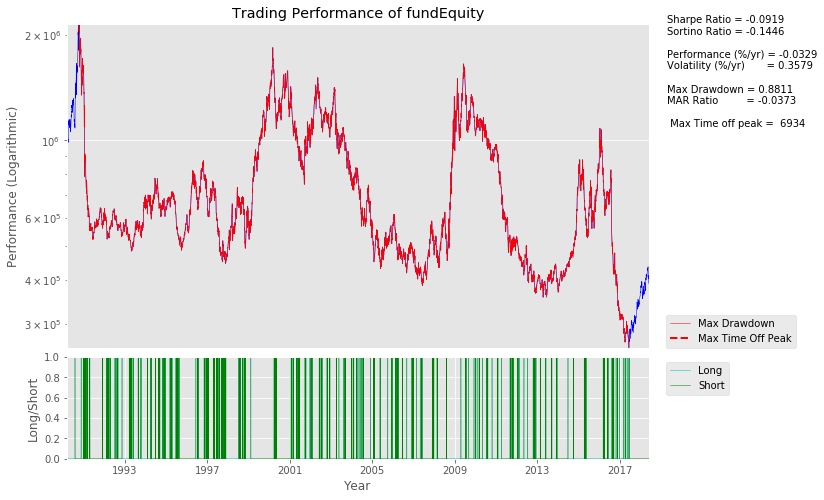

In [7]:
result = quantiacsToolbox.runts(myStrategy)